In [1]:
# !pip install statsmodels
# !pip install pymc

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
import pymc as pm

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/pp7-ucc/Players_project/main/data_football_ratings.csv")

In [ ]:
df.isna().sum().sort_values(ascending = False)

,0
competition,0
saves_itb,0
stop_shots,0
interceptions,0
tackles,0
...,...
grduels_w,0
grduels_l,0
aerials_w,0
aerials_l,0


In [ ]:
df.columns

Index(['competition', 'date', 'match', 'team', 'pos', 'pos_role', 'player',
       'rater', 'is_human', 'original_rating', 'goals', 'assists',
       'shots_ontarget', 'shots_offtarget', 'shotsblocked', 'chances2score',
       'drib_success', 'drib_unsuccess', 'keypasses', 'touches', 'passes_acc',
       'passes_inacc', 'crosses_acc', 'crosses_inacc', 'lballs_acc',
       'lballs_inacc', 'grduels_w', 'grduels_l', 'aerials_w', 'aerials_l',
       'poss_lost', 'fouls', 'wasfouled', 'clearances', 'stop_shots',
       'interceptions', 'tackles', 'dribbled_past', 'tballs_acc',
       'tballs_inacc', 'ycards', 'rcards', 'dangmistakes', 'countattack',
       'offsides', 'goals_ag_otb', 'goals_ag_itb', 'saves_itb', 'saves_otb',
       'saved_pen', 'missed_penalties', 'owngoals', 'degree_centrality',
       'betweenness_centrality', 'closeness_centrality', 'flow_centrality',
       'flow_success', 'betweenness2goals', 'win', 'lost', 'is_home_team',
       'minutesPlayed', 'game_duration'],
    

In [ ]:
df[summary_stats].describe().to_latex()

'\\begin{tabular}{lrrrrr}\n\\toprule\n & original_rating & goals & assists & interceptions & saved_pen \\\\\n\\midrule\ncount & 50652.000000 & 50652.000000 & 50652.000000 & 50652.000000 & 50652.000000 \\\\\nmean & 5.687847 & 0.099601 & 0.061893 & 1.935402 & 0.002191 \\\\\nstd & 1.673356 & 0.335712 & 0.257212 & 1.862718 & 0.046762 \\\\\nmin & 1.000000 & 0.000000 & 0.000000 & 0.000000 & 0.000000 \\\\\n25% & 4.500000 & 0.000000 & 0.000000 & 0.000000 & 0.000000 \\\\\n50% & 6.040000 & 0.000000 & 0.000000 & 1.000000 & 0.000000 \\\\\n75% & 7.000000 & 0.000000 & 0.000000 & 3.000000 & 0.000000 \\\\\nmax & 10.000000 & 4.000000 & 3.000000 & 13.000000 & 1.000000 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [ ]:
df[["original_rating",'goals','assists']].describe()

,original_rating,goals,assists
count,50652.000000,50652.000000,50652.000000
mean,5.687847,0.099601,0.061893
std,1.673356,0.335712,0.257212
min,1.000000,0.000000,0.000000
25%,4.500000,0.000000,0.000000
50%,6.040000,0.000000,0.000000
75%,7.000000,0.000000,0.000000
max,10.000000,4.000000,3.000000


In [ ]:
df

,competition,date,match,team,pos,pos_role,player,rater,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,keypasses,touches,passes_acc,passes_inacc,crosses_acc,crosses_inacc,lballs_acc,lballs_inacc,grduels_w,grduels_l,aerials_w,aerials_l,poss_lost,fouls,wasfouled,clearances,stop_shots,interceptions,tackles,dribbled_past,tballs_acc,tballs_inacc,ycards,rcards,dangmistakes,countattack,offsides,goals_ag_otb,goals_ag_itb,saves_itb,saves_otb,saved_pen,missed_penalties,owngoals,degree_centrality,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
0,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,Kicker,1,3.50,0,0,0,0,0,0,0,0,0,34,20,5,0,0,5,1,0,2,0,3,11,0,0,8,0,3,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,1.071429,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
1,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,WhoScored,0,6.56,0,0,0,0,0,0,0,0,0,34,20,5,0,0,5,1,0,2,0,3,11,0,0,8,0,3,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,1.071429,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
2,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,SofaScore,0,6.70,0,0,0,0,0,0,0,0,0,34,20,5,0,0,5,1,0,2,0,3,11,0,0,8,0,3,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,1.071429,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
3,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,Sub,Sub,Anthony Martial,WhoScored,0,6.19,0,0,1,0,0,1,1,0,0,10,3,1,0,0,0,0,2,0,0,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.428571,0.051556,0.524845,0.041096,0.166667,0.000000,1,0,1,13,90
4,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,Kicker,1,3.50,0,0,0,1,0,1,2,0,0,60,31,9,0,0,4,5,5,6,1,1,14,4,1,4,0,7,3,4,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1.571429,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50647,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SkySports,1,8.00,1,0,1,1,1,2,0,0,0,58,19,7,1,8,1,0,11,4,3,2,22,1,1,0,0,0,5,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1.384615,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50648,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,WhoScored,0,6.89,1,0,1,1,1,2,0,0,0,58,19,7,1,8,1,0,11,4,3,2,22,1,1,0,0,0,5,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1.384615,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50649,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SofaScore,0,6.40,1,0,1,1,1,2,0,0,0,58,19,7,1,8,1,0,11,4,3,2,22,1,1,0,0,0,5,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1.384615,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50650,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,Sub,Sub,Marko Pjaca,SkySports,1,6.00,0,0,0,0,0,0,0,0,0,4,1,1,0,0,0,0,2,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.230769,0.000000,0.481605,0.032967,0.333333,0.000000,0,1,0,90,90


## Remove raters with discrete ratings

In [3]:
df_continuous = df[(df['rater'] == 'SofaScore') | (df['rater'] == 'WhoScored')]
df_continuous

,competition,date,match,team,pos,pos_role,player,rater,is_human,original_rating,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
1,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,WhoScored,0,6.56,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
2,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,SofaScore,0,6.70,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
3,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,Sub,Sub,Anthony Martial,WhoScored,0,6.19,...,0.051556,0.524845,0.041096,0.166667,0.000000,1,0,1,13,90
5,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,WhoScored,0,6.58,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
6,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,SofaScore,0,6.80,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50644,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,WhoScored,0,6.64,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50645,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,SofaScore,0,6.90,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50648,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,WhoScored,0,6.89,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50649,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SofaScore,0,6.40,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90


## Scale the Bild and Kicker ratings

In [4]:
df_scaled = df.copy()

In [5]:
df_scaled

,competition,date,match,team,pos,pos_role,player,rater,is_human,original_rating,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
0,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,Kicker,1,3.50,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
1,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,WhoScored,0,6.56,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
2,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,SofaScore,0,6.70,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
3,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,Sub,Sub,Anthony Martial,WhoScored,0,6.19,...,0.051556,0.524845,0.041096,0.166667,0.000000,1,0,1,13,90
4,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,Kicker,1,3.50,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50647,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SkySports,1,8.00,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50648,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,WhoScored,0,6.89,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50649,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SofaScore,0,6.40,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50650,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,Sub,Sub,Marko Pjaca,SkySports,1,6.00,...,0.000000,0.481605,0.032967,0.333333,0.000000,0,1,0,90,90


In [6]:
# Define old and new ranges
#For Bild and Kicker ratings
old_min, old_max = 1, 6   # Original rating scale (1 = best, 6 = worst)
new_min, new_max = 1, 10  # Desired new scale (1 = worst, 10 = best)

# Apply reversed Min-Max Scaling formula
df_scaled.loc[df_scaled["rater"].isin(["Bild", "Kicker"]), "original_rating"] = (
    new_min + ((old_max - df["original_rating"]) * (new_max - new_min)) / (old_max - old_min)
)

#For SkySports
df_scaled.loc[df_scaled["rater"].isin(["SkySports"]), "original_rating"] = (
    new_min + ((old_max - df["original_rating"]) * (new_max - new_min)) / (old_max - old_min)
)

specific_rater = "SkySports"  # Change this to any rater you want
new_min, new_max = 1, 10  # Desired scale range

# Get old min and max dynamically for the specific rater
old_min = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].min()
old_max = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "SofaScore"  # Change this to any rater you want

old_min = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].min()
old_max = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "WhoScored"

old_min = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].min()
old_max = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "TheGuardian"

old_min = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].min()
old_max = df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df_scaled.loc[df_scaled["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)



In [7]:
# Define old and new ranges
#For Bild and Kicker ratings
old_min, old_max = 1, 6   # Original rating scale (1 = best, 6 = worst)
new_min, new_max = 1, 10  # Desired new scale (1 = worst, 10 = best)

# Apply reversed Min-Max Scaling formula
df.loc[df["rater"].isin(["Bild", "Kicker"]), "original_rating"] = (
    new_min + ((old_max - df["original_rating"]) * (new_max - new_min)) / (old_max - old_min)
)

#For SkySports
df.loc[df["rater"].isin(["SkySports"]), "original_rating"] = (
    new_min + ((old_max - df["original_rating"]) * (new_max - new_min)) / (old_max - old_min)
)

specific_rater = "SkySports"  # Change this to any rater you want
new_min, new_max = 1, 10  # Desired scale range

# Get old min and max dynamically for the specific rater
old_min = df.loc[df["rater"] == specific_rater, "original_rating"].min()
old_max = df.loc[df["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df.loc[df["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df.loc[df["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "SofaScore"  # Change this to any rater you want

old_min = df.loc[df["rater"] == specific_rater, "original_rating"].min()
old_max = df.loc[df["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df.loc[df["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df.loc[df["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "WhoScored"

old_min = df.loc[df["rater"] == specific_rater, "original_rating"].min()
old_max = df.loc[df["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df.loc[df["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df.loc[df["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

specific_rater = "TheGuardian"

old_min = df.loc[df["rater"] == specific_rater, "original_rating"].min()
old_max = df.loc[df["rater"] == specific_rater, "original_rating"].max()

# Apply min-max scaling only for the specific rater
df.loc[df["rater"] == specific_rater, "original_rating"] = (
    new_min + ((df.loc[df["rater"] == specific_rater, "original_rating"] - old_min) * (new_max - new_min))
    / (old_max - old_min)
)

In [ ]:
df.describe()

,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
count,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,...,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000
mean,0.530996,6.274450,0.099601,0.061893,0.299041,0.557135,0.214049,0.568053,0.524027,0.347686,...,0.169482,0.661259,0.317616,0.813626,0.011549,0.369008,0.373806,0.406460,79.371180,90.456053
std,0.499043,1.299299,0.335712,0.257212,0.631347,0.878827,0.505860,0.935402,0.955628,0.710788,...,0.086042,0.102062,0.145349,0.683888,0.035372,0.482541,0.483818,0.491177,21.425548,3.670678
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.008130,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,90.000000
25%,0.000000,5.980000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.106612,0.593939,0.216667,0.202468,0.000000,0.000000,0.000000,0.000000,78.000000,90.000000
50%,1.000000,6.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.163850,0.670635,0.321839,0.744910,0.000000,0.000000,0.000000,0.000000,90.000000,90.000000
75%,1.000000,7.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,...,0.225616,0.725926,0.420000,1.264387,0.000000,1.000000,1.000000,1.000000,90.000000,90.000000
max,1.000000,10.000000,4.000000,3.000000,7.000000,7.000000,4.000000,8.000000,10.000000,7.000000,...,0.525179,0.933333,0.810811,6.074042,1.000000,1.000000,1.000000,1.000000,120.000000,120.000000


In [ ]:
df_scaled['original_rating'].describe()

,original_rating
count,50652.000000
mean,6.274450
std,1.299299
min,1.000000
25%,5.980000
50%,6.400000
75%,7.000000
max,10.000000


In [ ]:
df[df['rater'] == 'Kicker'].describe()

,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
count,9548.0,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,...,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000,9548.000000
mean,1.0,5.507164,0.103058,0.065459,0.312526,0.585149,0.212191,0.602953,0.574256,0.371177,...,0.178075,0.676553,0.339566,0.866570,0.010759,0.363113,0.374948,0.374529,82.759636,90.637830
std,0.0,1.645852,0.340763,0.263742,0.646106,0.895725,0.496146,0.960179,1.004147,0.734645,...,0.080832,0.089468,0.126917,0.671641,0.028120,0.480922,0.484135,0.484026,15.545233,4.327821
min,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.015385,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,90.000000
25%,1.0,4.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.118854,0.620513,0.246575,0.319686,0.000000,0.000000,0.000000,0.000000,82.000000,90.000000
50%,1.0,5.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.170763,0.670635,0.336957,0.822245,0.000000,0.000000,0.000000,0.000000,90.000000,90.000000
75%,1.0,6.400000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,...,0.228157,0.725926,0.425743,1.301580,0.000000,1.000000,1.000000,1.000000,90.000000,90.000000
max,1.0,10.000000,3.000000,3.000000,7.000000,6.000000,4.000000,8.000000,10.000000,7.000000,...,0.525179,0.933333,0.810811,4.214623,0.333333,1.000000,1.000000,1.000000,120.000000,120.000000


In [ ]:
df.groupby(['rater'])['original_rating'].describe()

,count,mean,std,min,25%,50%,75%,max
rater,,,,,,,,
Bild,5519.0,5.438521,1.918632,1.0,4.600000,4.600000,6.400000,10.0
Kicker,9548.0,5.507164,1.645852,1.0,4.600000,5.500000,6.400000,10.0
SkySports,11134.0,5.236180,1.106466,1.0,4.375000,5.500000,5.500000,10.0
SofaScore,2402.0,6.068401,0.763983,1.0,5.628571,6.014286,6.528571,10.0
TheGuardian,695.0,5.834532,1.456611,1.0,5.500000,5.500000,7.000000,10.0
WhoScored,21354.0,5.242820,1.061473,1.0,4.443350,5.093596,5.862069,10.0


In [8]:
human_df = df_scaled[df_scaled['is_human'] == 1]
human_df

,competition,date,match,team,pos,pos_role,player,rater,is_human,original_rating,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
0,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,Kicker,1,5.500,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
4,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,Kicker,1,5.500,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
9,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,FW,FW,Olivier Giroud,Kicker,1,6.400,...,0.316015,0.754464,0.315068,1.090213,0.050000,1,0,1,90,90
10,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DL,Razvan Rat,Kicker,1,3.700,...,0.321679,0.754464,0.478261,0.000000,0.000000,0,1,0,90,90
15,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,MF,MC,Blaise Matuidi,Kicker,1,4.600,...,0.307731,0.754464,0.520548,1.315471,0.000000,1,0,1,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50642,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,Kicker,1,7.300,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50643,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,SkySports,1,4.375,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50646,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,Kicker,1,8.200,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50647,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SkySports,1,3.250,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90


In [ ]:
list(df_continuous.columns)

['competition',
 'date',
 'match',
 'team',
 'pos',
 'pos_role',
 'player',
 'rater',
 'is_human',
 'original_rating',
 'goals',
 'assists',
 'shots_ontarget',
 'shots_offtarget',
 'shotsblocked',
 'chances2score',
 'drib_success',
 'drib_unsuccess',
 'keypasses',
 'touches',
 'passes_acc',
 'passes_inacc',
 'crosses_acc',
 'crosses_inacc',
 'lballs_acc',
 'lballs_inacc',
 'grduels_w',
 'grduels_l',
 'aerials_w',
 'aerials_l',
 'poss_lost',
 'fouls',
 'wasfouled',
 'clearances',
 'stop_shots',
 'interceptions',
 'tackles',
 'dribbled_past',
 'tballs_acc',
 'tballs_inacc',
 'ycards',
 'rcards',
 'dangmistakes',
 'countattack',
 'offsides',
 'goals_ag_otb',
 'goals_ag_itb',
 'saves_itb',
 'saves_otb',
 'saved_pen',
 'missed_penalties',
 'owngoals',
 'degree_centrality',
 'betweenness_centrality',
 'closeness_centrality',
 'flow_centrality',
 'flow_success',
 'betweenness2goals',
 'win',
 'lost',
 'is_home_team',
 'minutesPlayed',
 'game_duration']

In [ ]:
print((df_continuous.dtypes))

competition      object
date             object
match            object
team             object
pos              object
                  ...  
win               int64
lost              int64
is_home_team      int64
minutesPlayed     int64
game_duration     int64
Length: 63, dtype: object


In [ ]:
df_continuous.describe()


,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
count,23756.0,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,...,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000,23756.000000
mean,0.0,6.797266,0.094881,0.059606,0.289190,0.542768,0.210347,0.552745,0.506314,0.334358,...,0.165249,0.654084,0.307259,0.785009,0.011804,0.370601,0.373842,0.395016,77.750547,90.506398
std,0.0,0.708366,0.327517,0.252255,0.620673,0.869743,0.503655,0.925263,0.941301,0.695150,...,0.088070,0.107772,0.152523,0.689058,0.039033,0.482976,0.483833,0.488864,23.592567,3.864730
min,0.0,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.008130,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,90.000000
25%,0.0,6.270000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.100137,0.592982,0.197130,0.161944,0.000000,0.000000,0.000000,0.000000,76.000000,90.000000
50%,0.0,6.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.159640,0.653333,0.312500,0.700851,0.000000,0.000000,0.000000,0.000000,90.000000,90.000000
75%,0.0,7.210000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,...,0.223217,0.725926,0.416667,1.233254,0.000000,1.000000,1.000000,1.000000,90.000000,90.000000
max,0.0,10.000000,4.000000,3.000000,7.000000,7.000000,4.000000,8.000000,10.000000,7.000000,...,0.525179,0.933333,0.810811,6.074042,1.000000,1.000000,1.000000,1.000000,120.000000,120.000000


In [ ]:
df_continuous.groupby(['rater']).min('original_rating')

,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
rater,,,,,,,,,,,,,,,,,,,,,
SofaScore,0,3.00,0,0,0,0,0,0,0,0,...,0.0,0.377232,0.031746,0.0,0.0,0,0,0,10,90
WhoScored,0,3.91,0,0,0,0,0,0,0,0,...,0.0,0.000000,0.008130,0.0,0.0,0,0,0,-3,90


## Identifying Data types

In [ ]:
dis_col = df_continuous.select_dtypes(include=['int'])
dis_col

,is_human,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,keypasses,...,saves_itb,saves_otb,saved_pen,missed_penalties,owngoals,win,lost,is_home_team,minutesPlayed,game_duration
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,90,90
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,90,90
3,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,0,1,0,1,13,90
5,0,0,0,0,1,0,1,2,0,0,...,0,0,0,0,0,0,1,0,90,90
6,0,0,0,0,1,0,1,2,0,0,...,0,0,0,0,0,0,1,0,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50644,0,0,0,0,3,1,1,0,1,3,...,0,0,0,0,0,0,1,0,90,90
50645,0,0,0,0,3,1,1,0,1,3,...,0,0,0,0,0,0,1,0,90,90
50648,0,1,0,1,1,1,2,0,0,0,...,0,0,0,0,0,0,1,0,90,90
50649,0,1,0,1,1,1,2,0,0,0,...,0,0,0,0,0,0,1,0,90,90


In [ ]:
cat_col = df_continuous.select_dtypes(include=['object'])
cat_col


,competition,date,match,team,pos,pos_role,player,rater
1,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,WhoScored
2,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,SofaScore
3,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,Sub,Sub,Anthony Martial,WhoScored
5,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,WhoScored
6,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,SofaScore
...,...,...,...,...,...,...,...,...
50644,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,WhoScored
50645,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,SofaScore
50648,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,WhoScored
50649,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SofaScore


In [ ]:
numeric_col = df_continuous.drop(cat_col, axis = 1)
numeric_col

,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
1,0,6.56,0,0,0,0,0,0,0,0,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
2,0,6.70,0,0,0,0,0,0,0,0,...,0.143055,0.603571,0.304348,0.000000,0.000000,0,1,0,90,90
3,0,6.19,0,0,1,0,0,1,1,0,...,0.051556,0.524845,0.041096,0.166667,0.000000,1,0,1,13,90
5,0,6.58,0,0,0,1,0,1,2,0,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
6,0,6.80,0,0,0,1,0,1,2,0,...,0.333284,0.710084,0.347826,0.675075,0.000000,0,1,0,90,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50644,0,6.64,0,0,0,3,1,1,0,1,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50645,0,6.90,0,0,0,3,1,1,0,1,...,0.244549,0.791209,0.538462,1.096226,0.000000,0,1,0,90,90
50648,0,6.89,1,0,1,1,1,2,0,0,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90
50649,0,6.40,1,0,1,1,1,2,0,0,...,0.172090,0.791209,0.318681,0.794142,0.045455,0,1,0,90,90


In [ ]:
float_col = df_continuous.select_dtypes(include=['float'])
float_col

,original_rating,degree_centrality,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals
1,6.56,1.071429,0.143055,0.603571,0.304348,0.000000,0.000000
2,6.70,1.071429,0.143055,0.603571,0.304348,0.000000,0.000000
3,6.19,0.428571,0.051556,0.524845,0.041096,0.166667,0.000000
5,6.58,1.571429,0.333284,0.710084,0.347826,0.675075,0.000000
6,6.80,1.571429,0.333284,0.710084,0.347826,0.675075,0.000000
...,...,...,...,...,...,...,...
50644,6.64,1.692308,0.244549,0.791209,0.538462,1.096226,0.000000
50645,6.90,1.692308,0.244549,0.791209,0.538462,1.096226,0.000000
50648,6.89,1.384615,0.172090,0.791209,0.318681,0.794142,0.045455
50649,6.40,1.384615,0.172090,0.791209,0.318681,0.794142,0.045455


In [ ]:
df['goals']

,goals
1,0
2,0
3,0
5,0
6,0
...,...
50644,0
50645,0
50648,1
50649,1


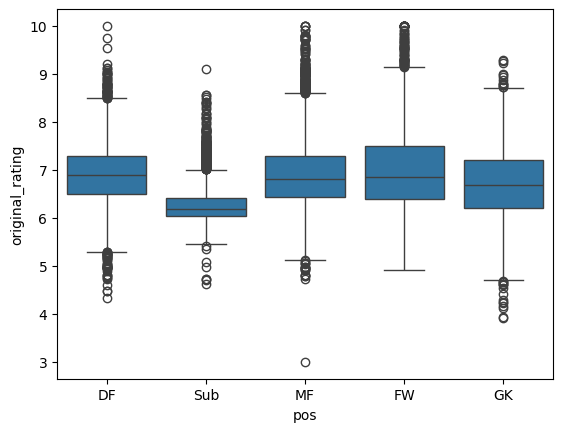

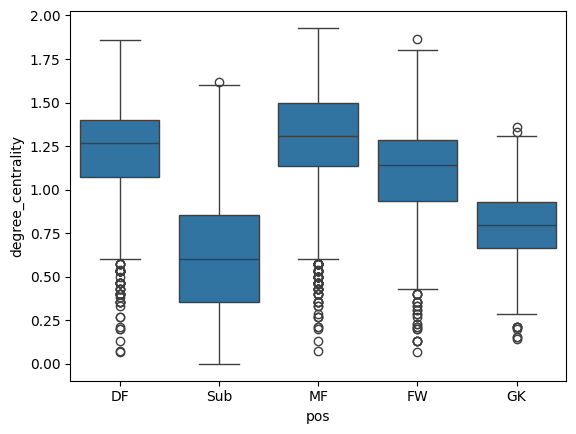

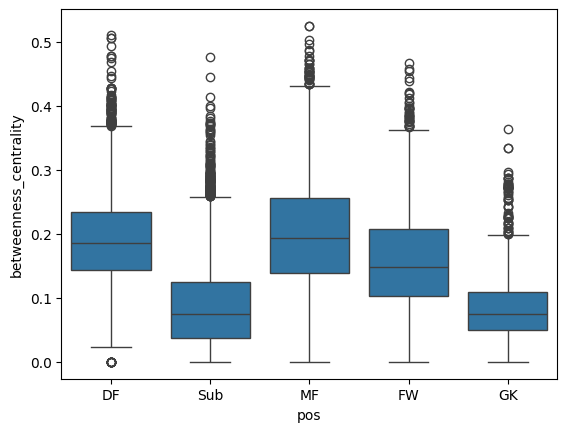

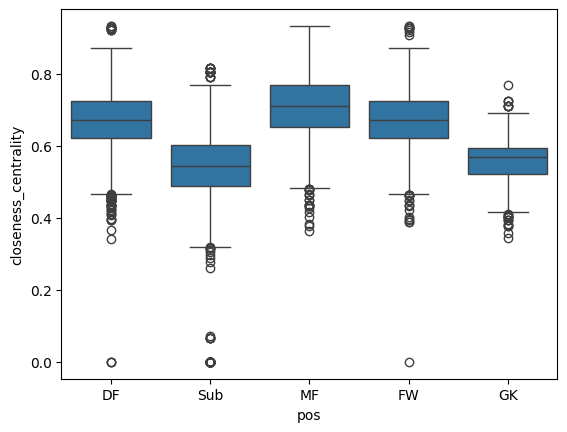

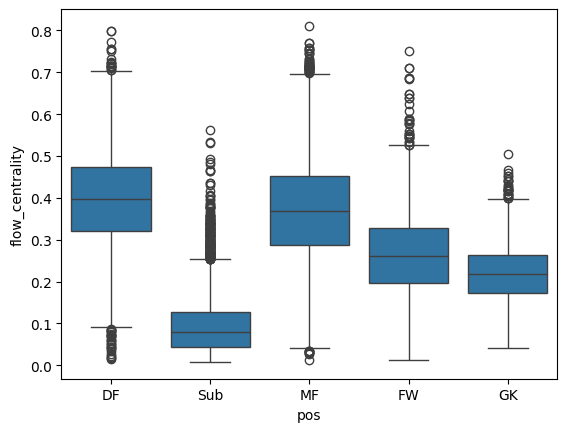

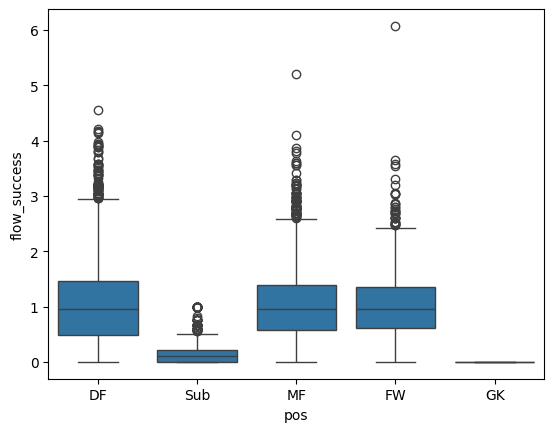

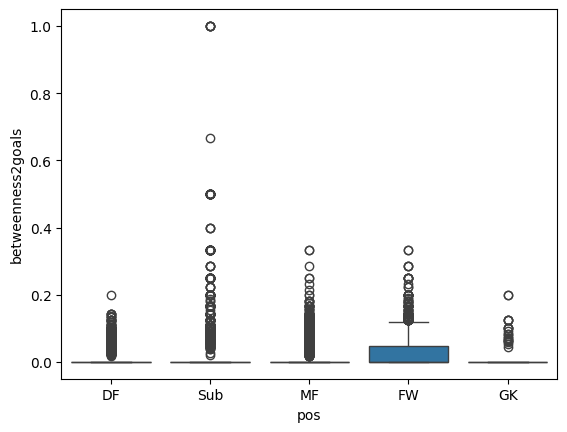

In [ ]:
for i,col in enumerate(float_col):
  plt.figure(i)
  sns.boxplot(data = df_continuous, x = 'pos',y = col)

<ipython-input-118-cbf79a1f9eef>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


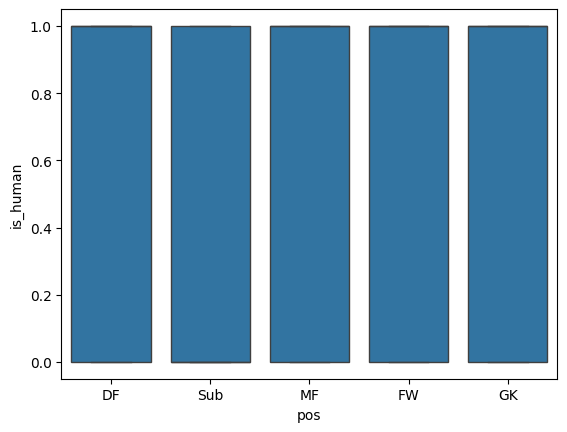

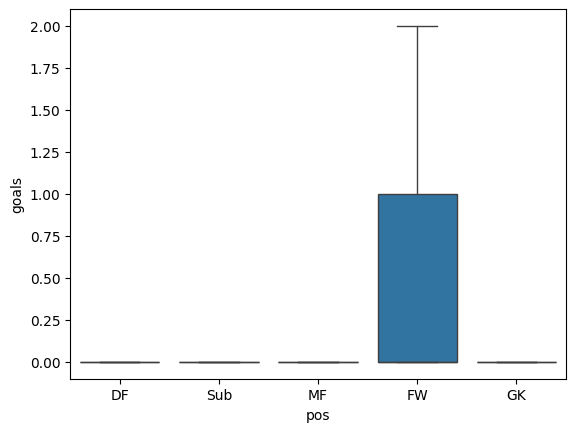

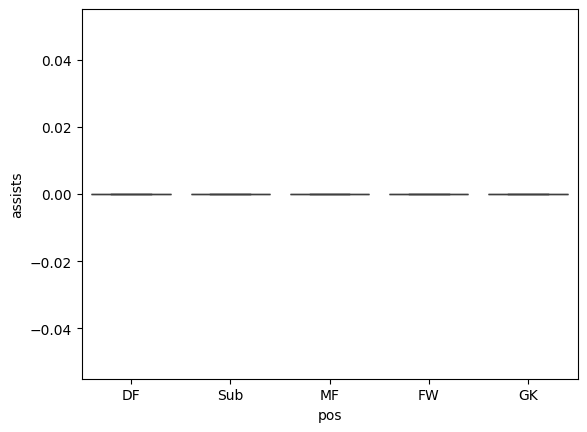

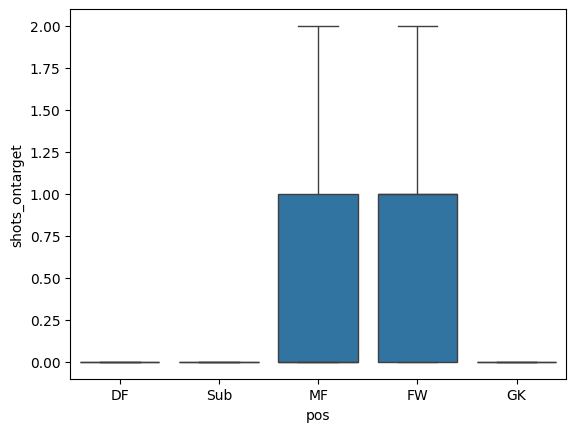

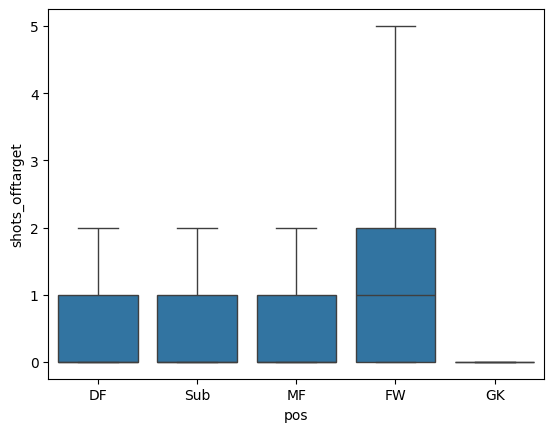

...

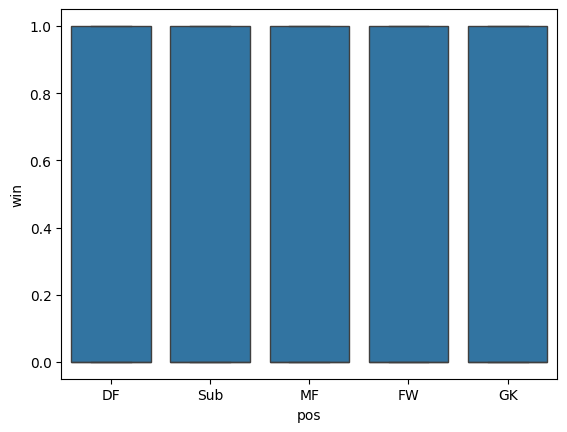

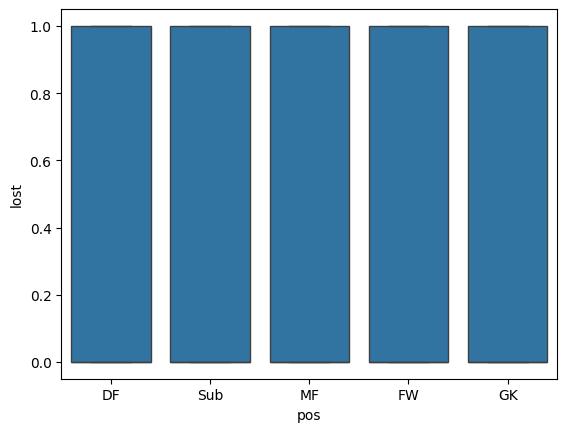

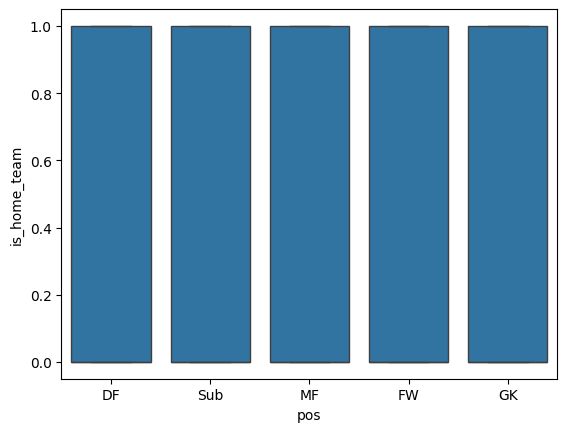

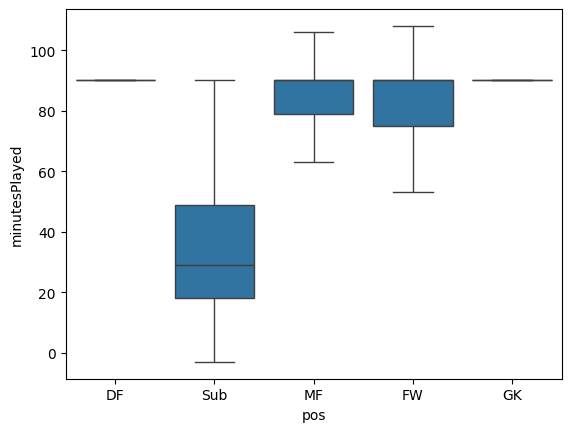

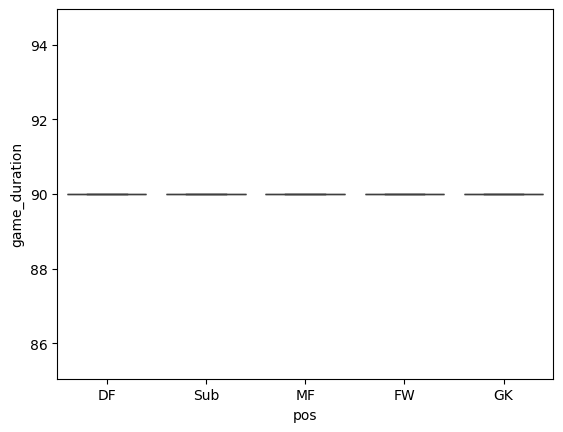

In [ ]:
for i,col in enumerate(dis_col):
  plt.figure(i)
  sns.boxplot(data = df_scaled, x = 'pos',y = col, showfliers = False)

/usr/local/lib/python3.11/dist-packages/scipy/stats/_continuous_distns.py:716: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/usr/local/lib/python3.11/dist-packages/scipy/stats/_continuous_distns.py:721: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


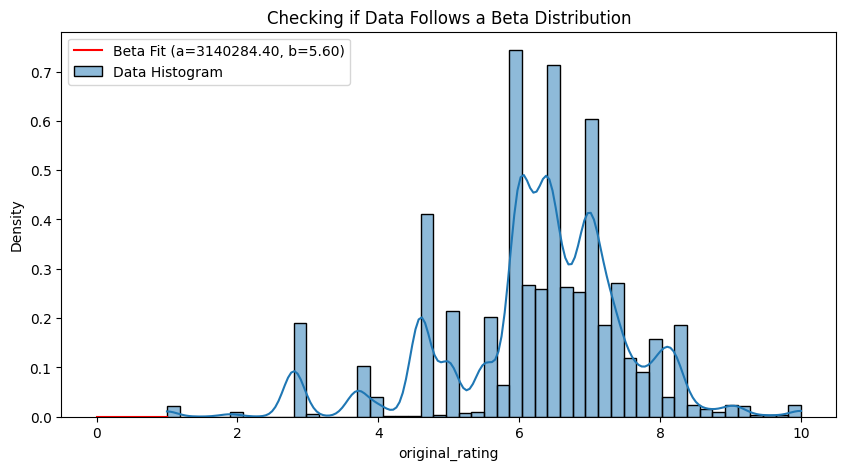

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Generate or load your data
# Example: Replace this with your actual dataset
data = df['original_rating']

# Fit a Beta distribution to your data
a_hat, b_hat, loc, scale = stats.beta.fit(data)  # Estimate parameters

# Generate fitted Beta distribution
x = np.linspace(0, 1, 100)
pdf_fitted = stats.beta.pdf(x, a_hat, b_hat, loc, scale)

# Plot histogram & Beta fit
plt.figure(figsize=(10, 5))
sns.histplot(data, bins=50, kde=True, stat="density", label="Data Histogram")
plt.plot(x, pdf_fitted, 'r-', label=f'Beta Fit (a={a_hat:.2f}, b={b_hat:.2f})')
plt.legend()
plt.title("Checking if Data Follows a Beta Distribution")
plt.show()


In [ ]:
ks_stat, ks_p = stats.kstest(data, 'beta', args=(a_hat, b_hat, loc, scale))
print(f"Kolmogorov-Smirnov Test: stat={ks_stat:.4f}, p={ks_p:.4f}")

Kolmogorov-Smirnov Test: stat=1.0000, p=0.0000


In [ ]:
def check_normality(data, name="Data"):
    ks_stat, ks_p = stats.kstest(data, 'norm', args=(np.mean(data), np.std(data)))
    print(f"Kolmogorov-Smirnov Test: stat={ks_stat:.4f}, p={ks_p:.4f}")

    anderson_result = stats.anderson(data, dist='norm')
    print(f"Anderson-Darling Test: statistic={anderson_result.statistic:.4f}, critical values={anderson_result.critical_values}")

    if ks_p > 0.05:
        print(" -> Data is likely normal (fail to reject H0).")
    else:
        print(" -> Data is likely NOT normal (reject H0).")

check_normality(df['original_rating'], "Original Data")
check_normality(log_data, "Log Transformed")
check_normality(sqrt_data, "Square Root Transformed")
check_normality(boxcox_data, "Box-Cox Transformed")

Kolmogorov-Smirnov Test: stat=0.1637, p=0.0000
Anderson-Darling Test: statistic=970.5443, critical values=[0.576 0.656 0.787 0.918 1.092]
 -> Data is likely NOT normal (reject H0).
Kolmogorov-Smirnov Test: stat=0.2113, p=0.0000
Anderson-Darling Test: statistic=2130.9601, critical values=[0.576 0.656 0.787 0.918 1.092]
 -> Data is likely NOT normal (reject H0).
Kolmogorov-Smirnov Test: stat=0.1919, p=0.0000
Anderson-Darling Test: statistic=1575.2395, critical values=[0.576 0.656 0.787 0.918 1.092]
 -> Data is likely NOT normal (reject H0).
Kolmogorov-Smirnov Test: stat=0.1205, p=0.0000
Anderson-Darling Test: statistic=453.3241, critical values=[0.576 0.656 0.787 0.918 1.092]
 -> Data is likely NOT normal (reject H0).


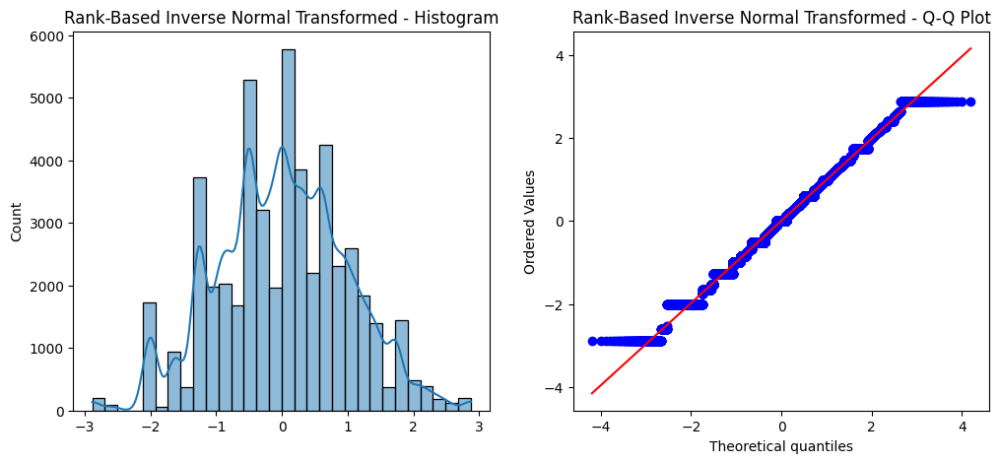

Kolmogorov-Smirnov Test: stat=0.0544, p=0.0000
Anderson-Darling Test: statistic=75.0970, critical values=[0.576 0.656 0.787 0.918 1.092]
 -> Data is likely NOT normal (reject H0).


In [ ]:
from scipy.stats import rankdata, norm

def rank_inverse_normal(data):
    """Applies rank-based inverse normal transformation."""
    ranked_data = rankdata(data)  # Rank the data
    transformed_data = norm.ppf((ranked_data - 0.5) / len(data))  # Apply normal quantile
    return transformed_data

int_data = rank_inverse_normal(df['original_rating'])
plot_distribution(int_data, "Rank-Based Inverse Normal Transformed")
check_normality(int_data, "Rank-Based INT")


## Univariate Analysis

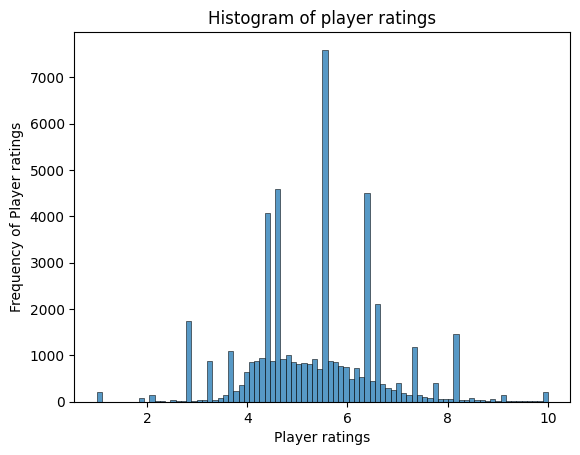

In [ ]:
sns.histplot(data = df, x = 'original_rating')
plt.title('Histogram of player ratings')
plt.xlabel('Player ratings')
plt.ylabel('Frequency of Player ratings')
plt.show()

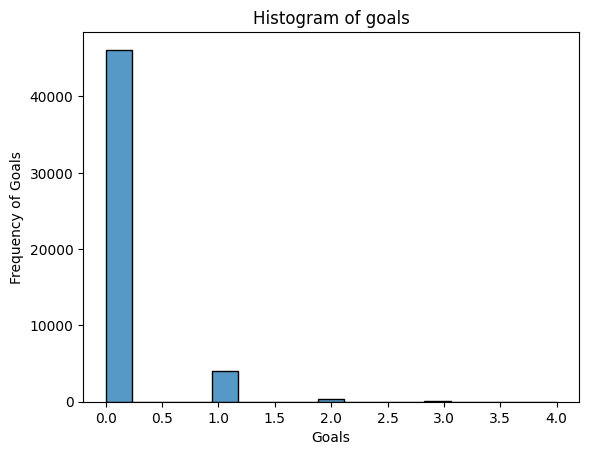

In [ ]:
sns.histplot(data = df, x = 'goals')
plt.title('Histogram of goals')
plt.xlabel('Goals')
plt.ylabel('Frequency of Goals')
plt.show()

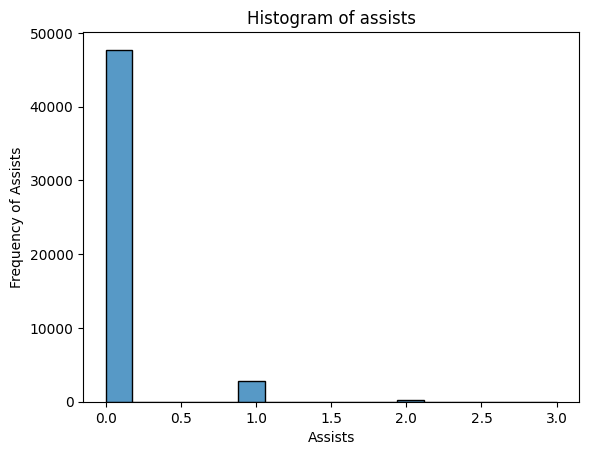

In [ ]:
sns.histplot(data = df, x = 'assists')
plt.title('Histogram of assists')
plt.xlabel('Assists')
plt.ylabel('Frequency of Assists')
plt.show()

## Discrete variables analysis

C:\Users\prolo\AppData\Local\Temp\ipykernel_21056\1213762974.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


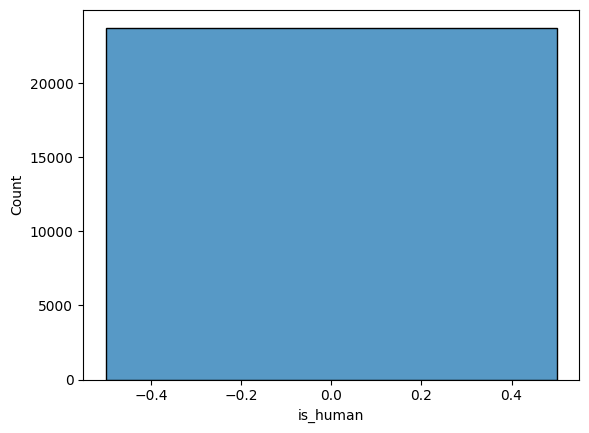

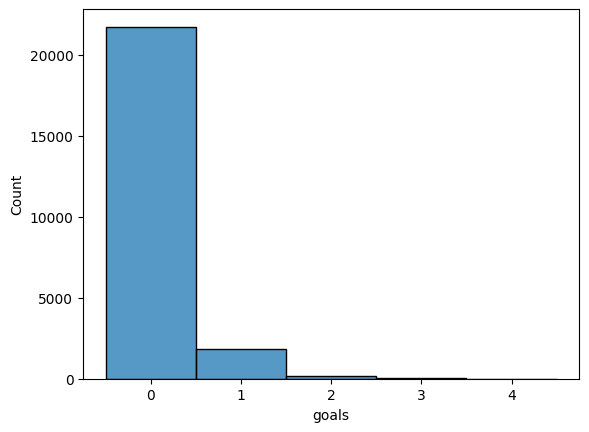

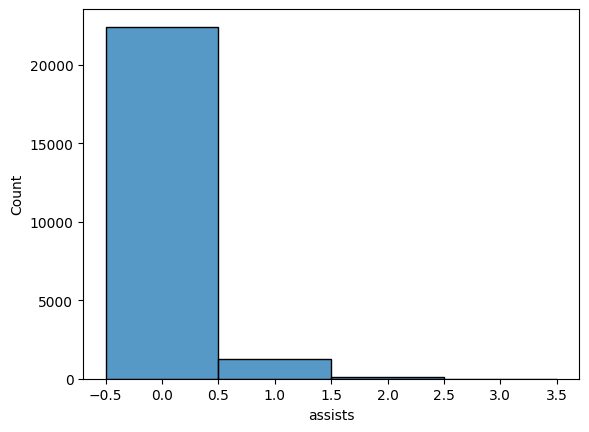

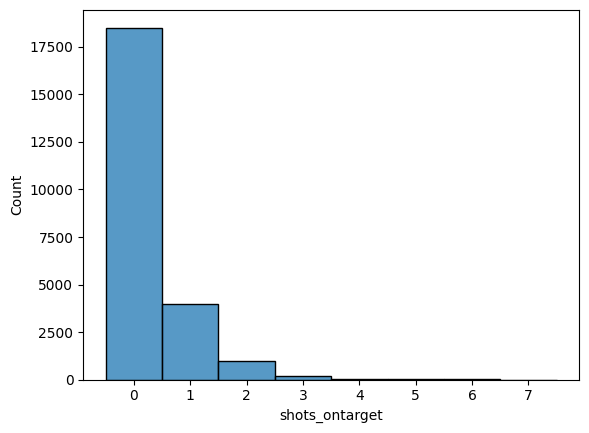

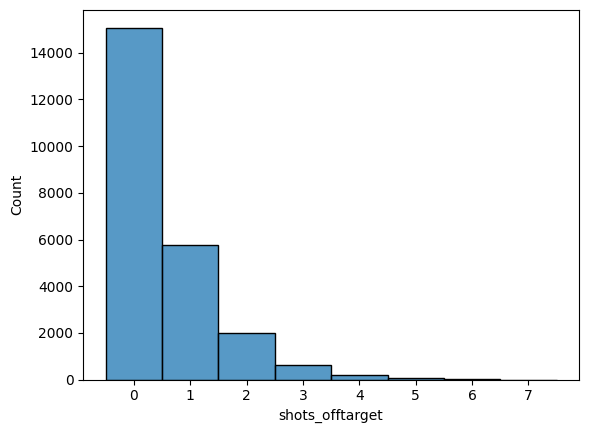

...

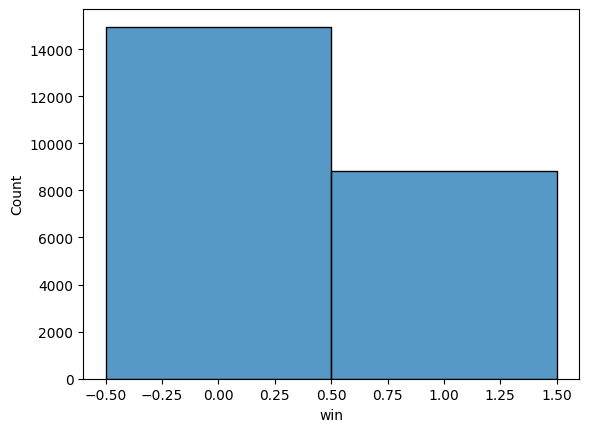

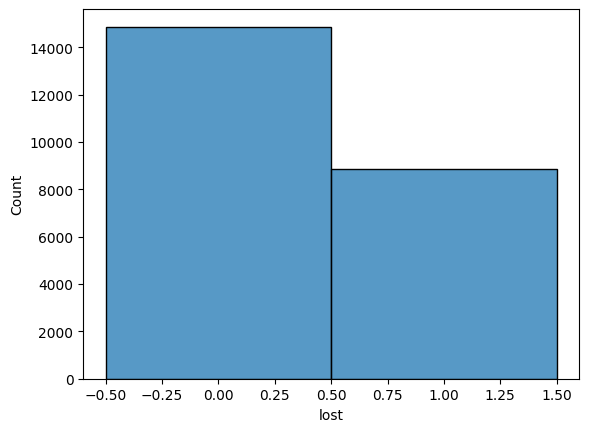

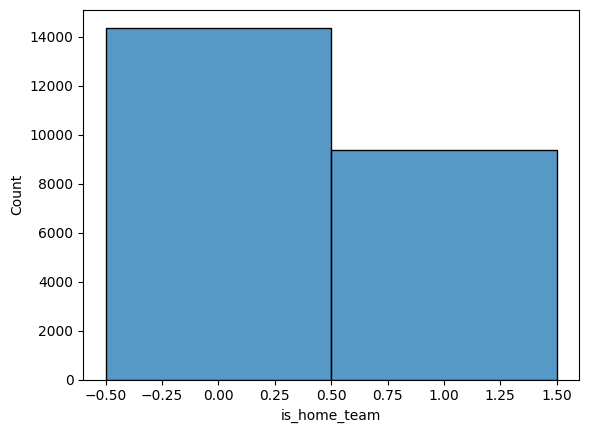

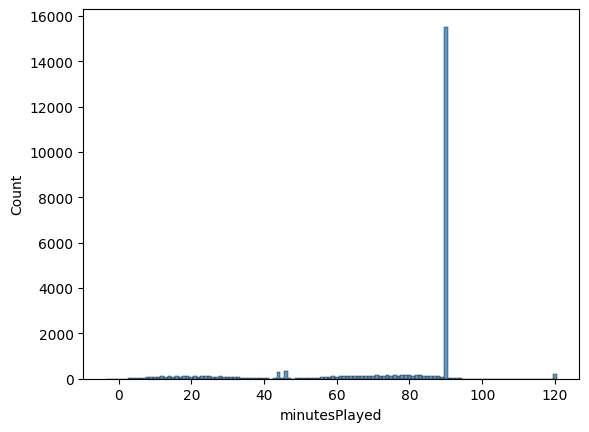

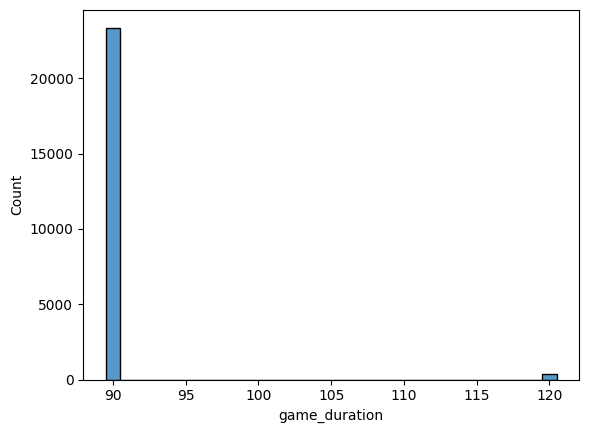

In [ ]:
for i, col in enumerate(dis_col):
    plt.figure(i)
    sns.histplot(x=df[col], discrete = True)

It seems is was very common for players not to get involved into anything( majority of passes, goals, assists, chances etc are zero)

C:\Users\prolo\AppData\Local\Temp\ipykernel_35560\2282364301.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


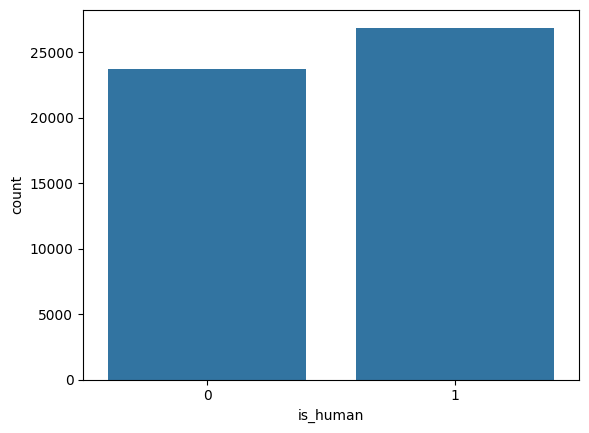

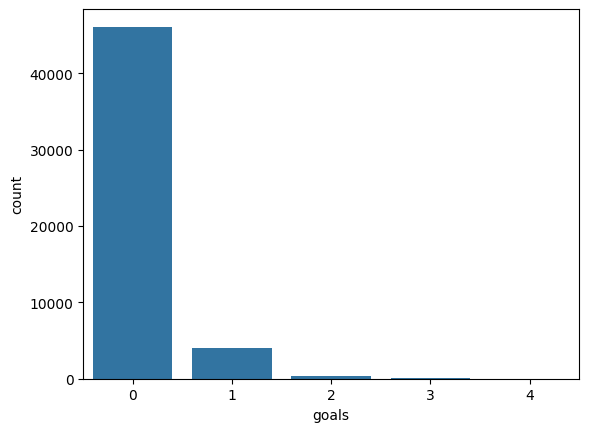

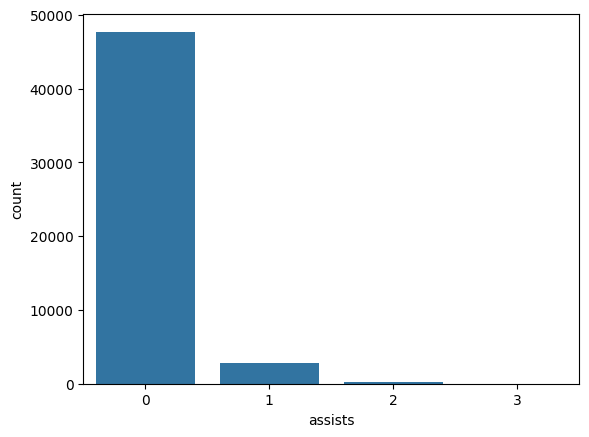

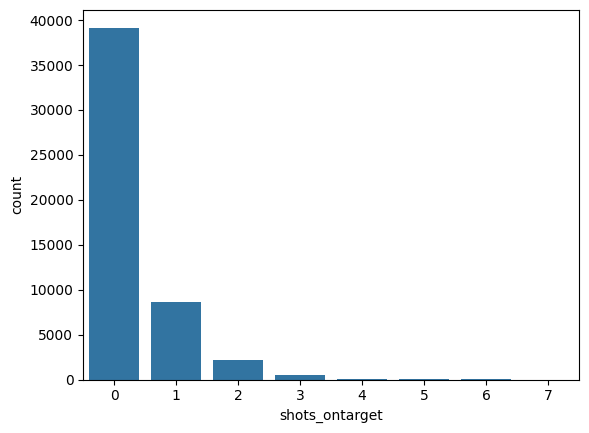

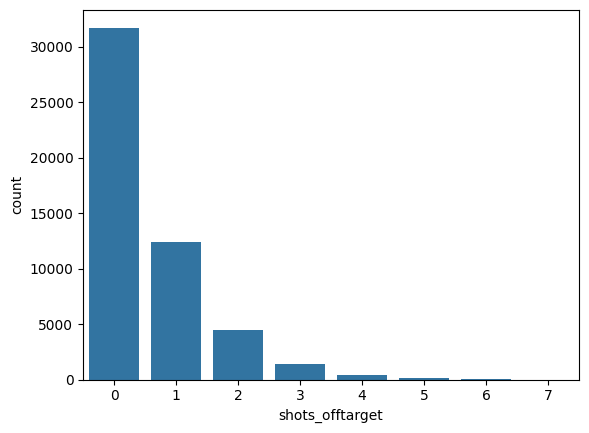

...

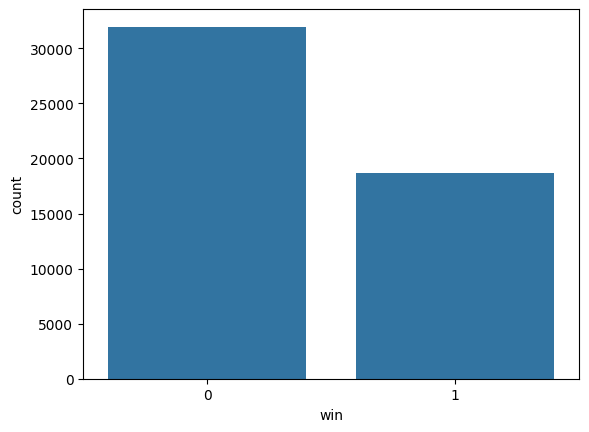

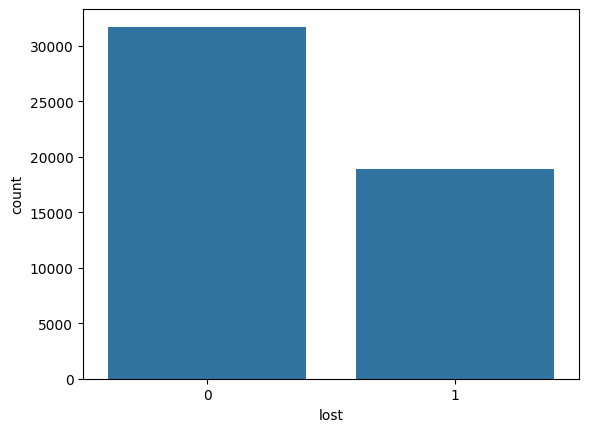

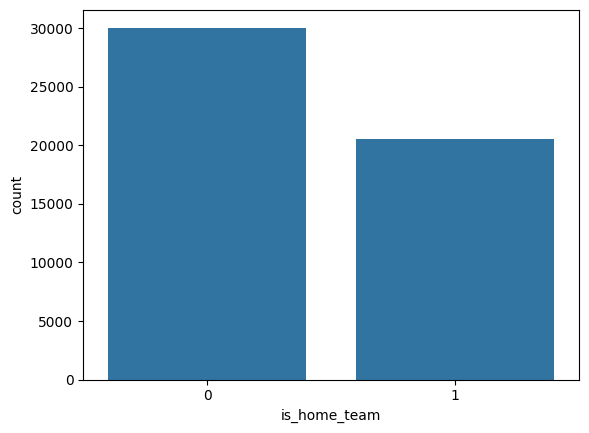

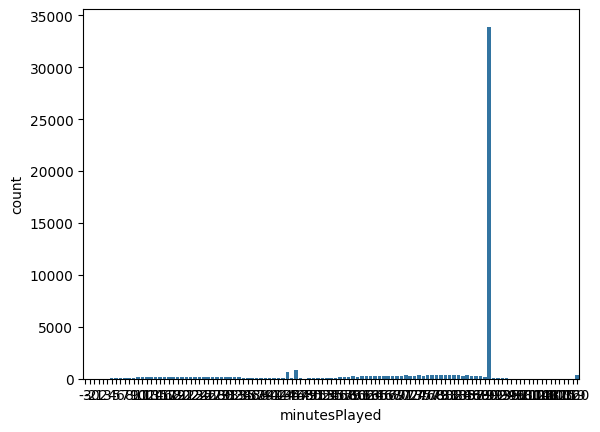

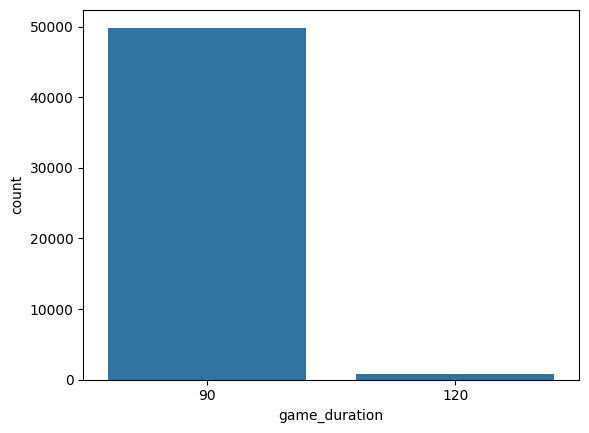

In [ ]:
for i, col in enumerate(dis_col):
    plt.figure(i)
    sns.countplot(x=df[col])

C:\Users\prolo\AppData\Local\Temp\ipykernel_35560\36494325.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


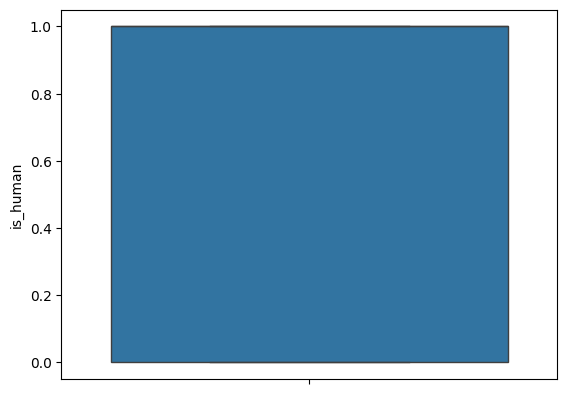

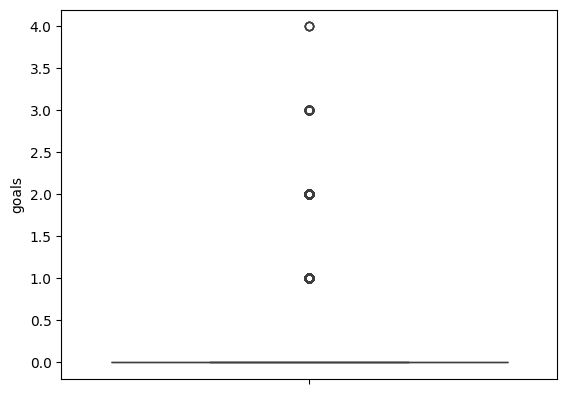

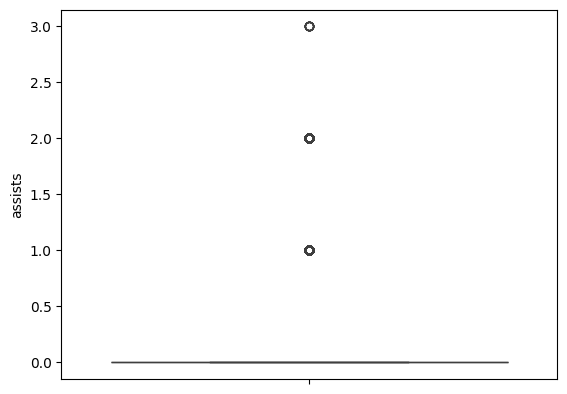

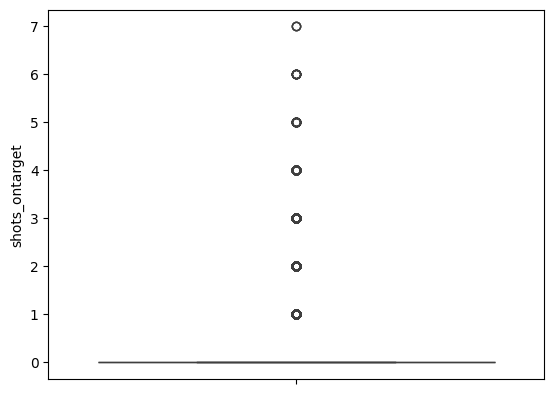

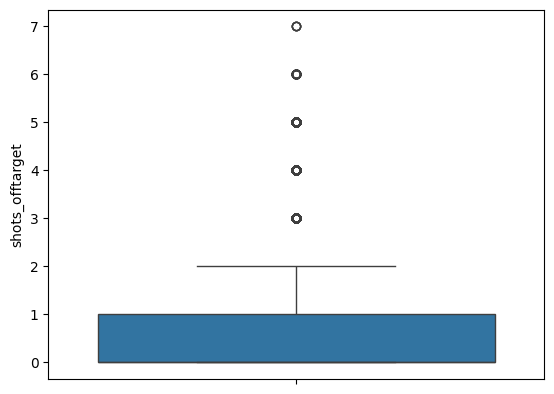

...

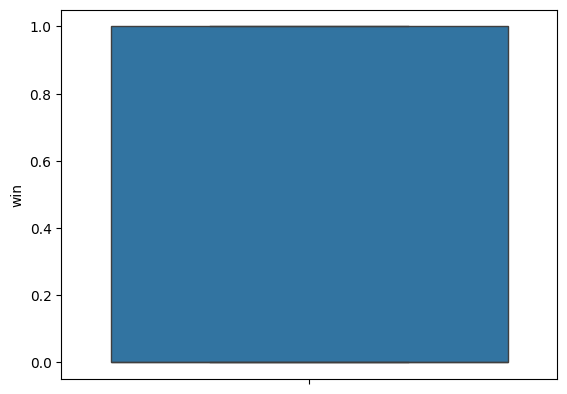

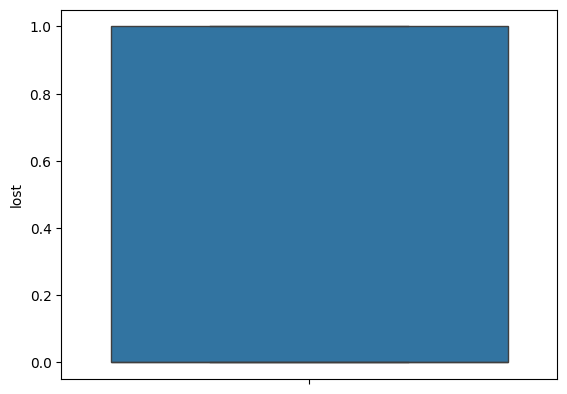

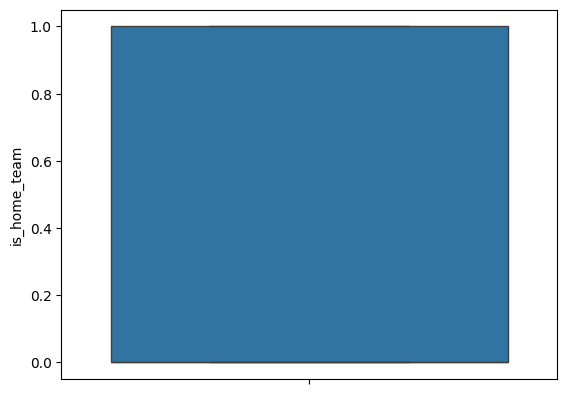

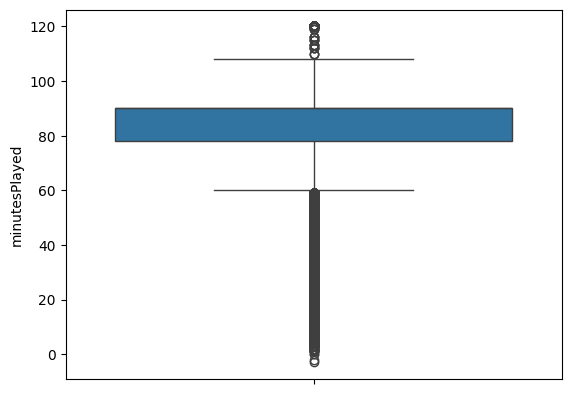

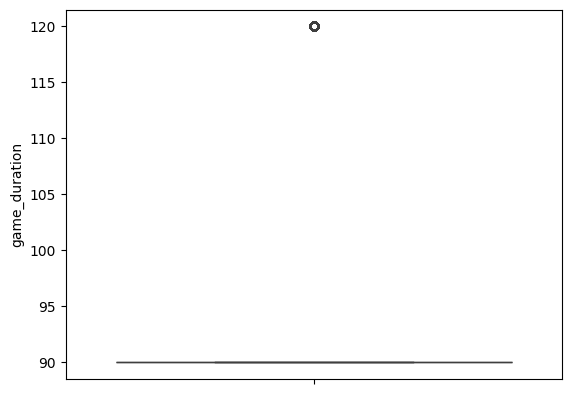

In [ ]:
for i, col in enumerate(dis_col):
    plt.figure(i)
    sns.boxplot(y=df[col], data=df)

## Float variables

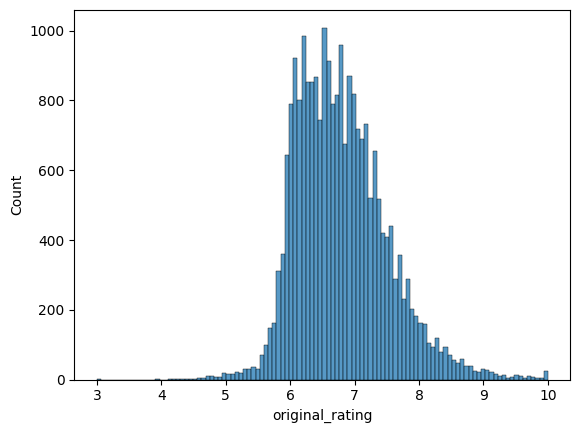

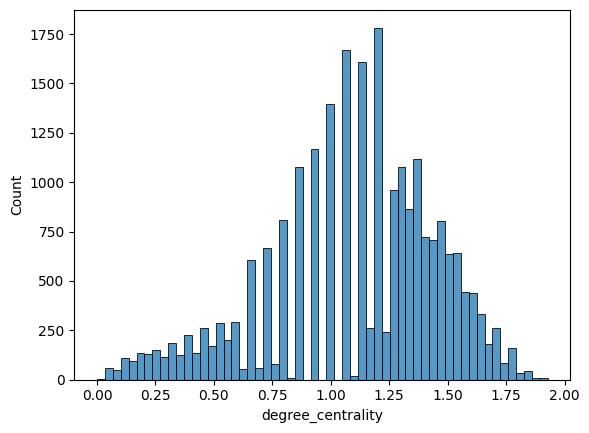

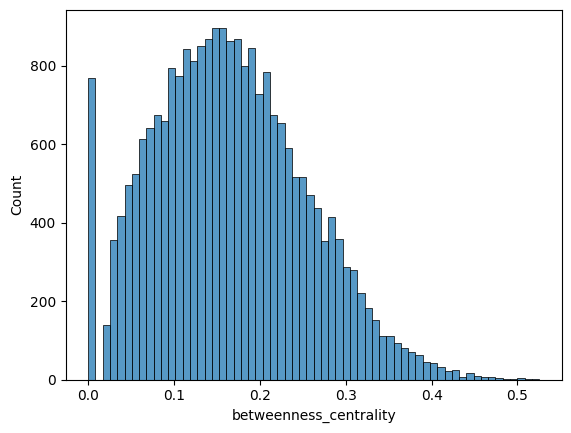

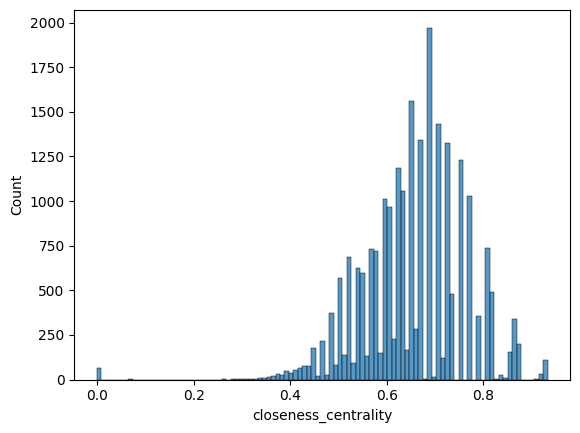

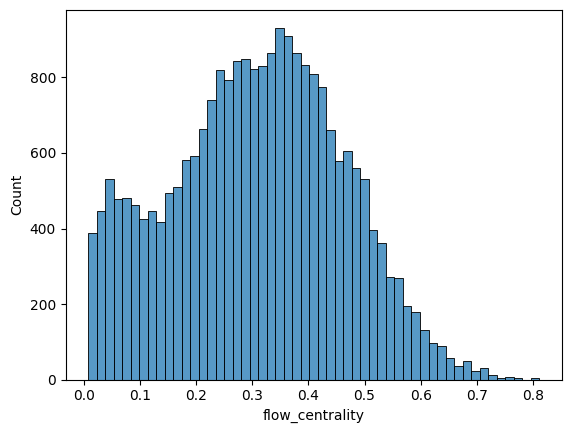

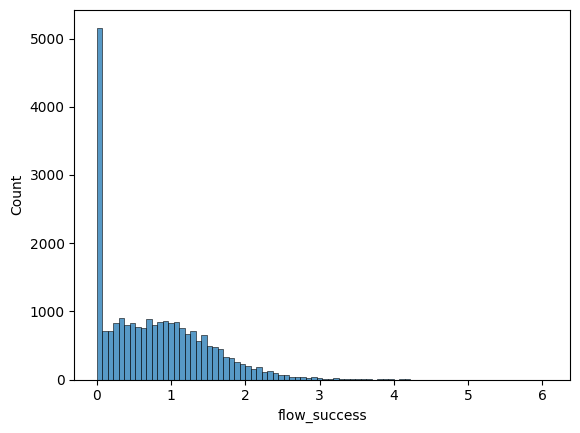

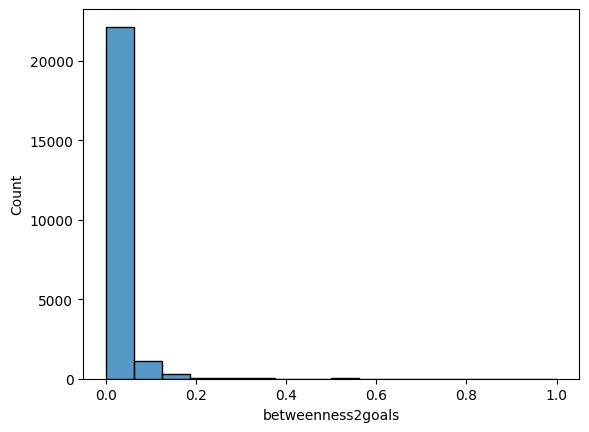

In [ ]:
for i, col in enumerate(float_col):
    plt.figure(i)
    sns.histplot(x=col,data=df )

## Categorical variables

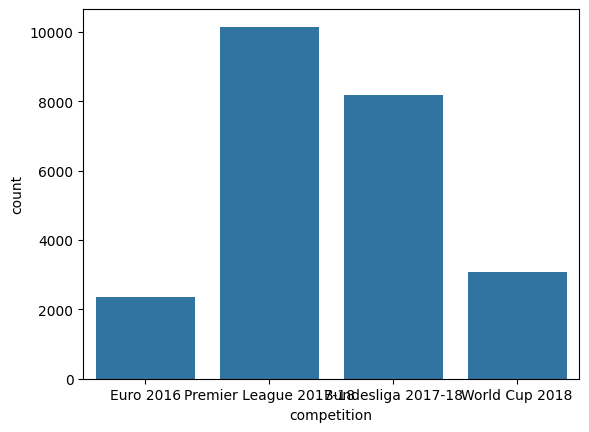

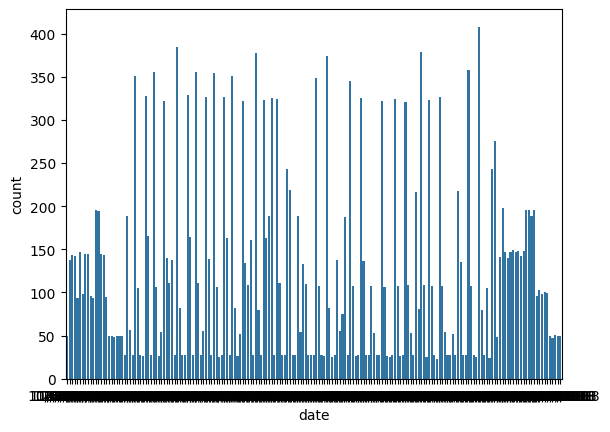

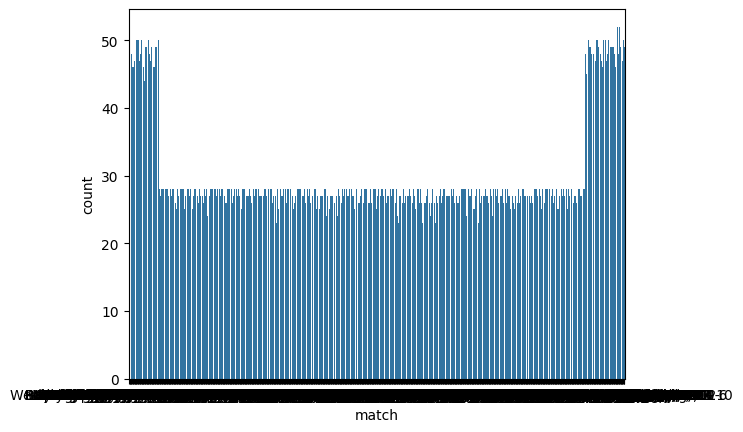

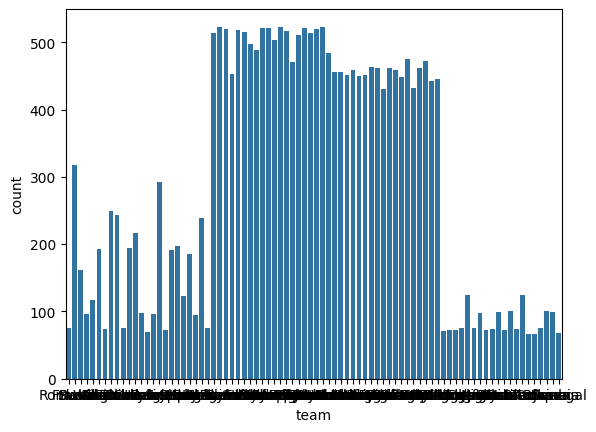

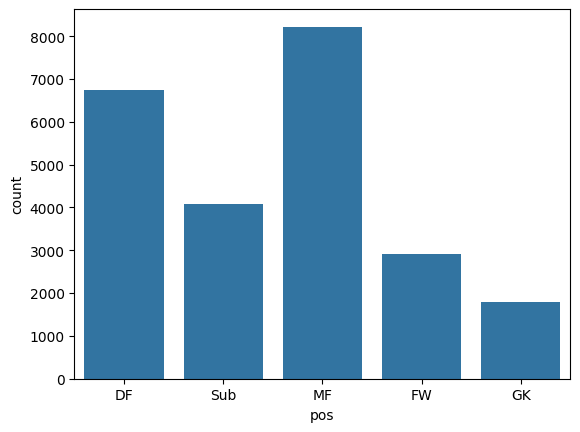

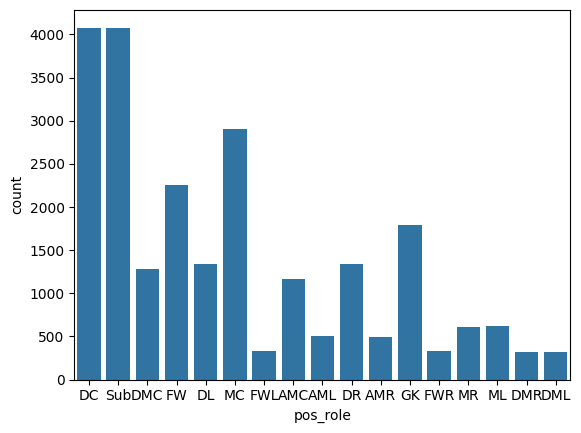

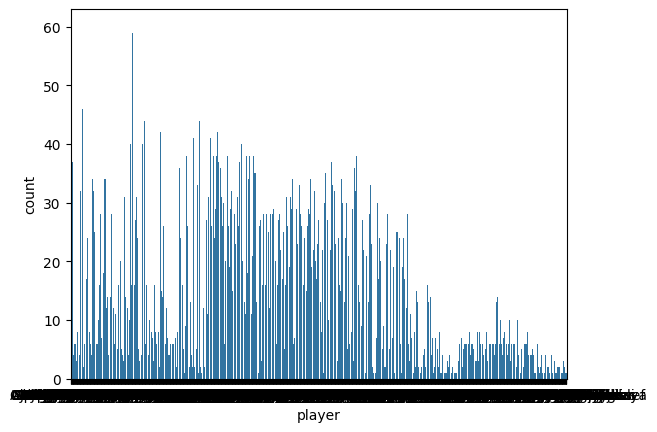

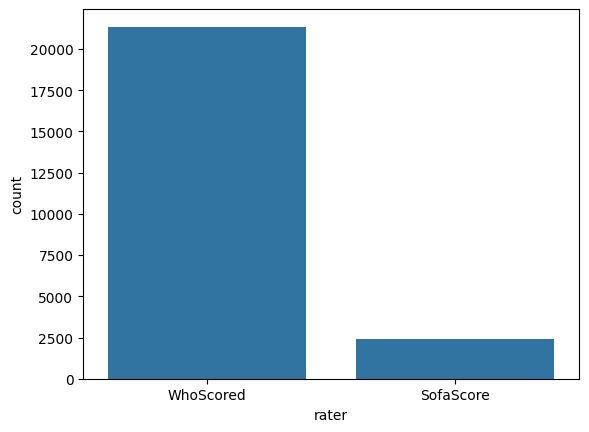

In [ ]:
for i, col in enumerate(cat_col):
    plt.figure(i)
    sns.countplot(x=col,data=df )

WhoScored has the most data available by a wide margin
Midfielder is the most common position
Bundesliga is the most common competition
Centre-back is the most common positional role

## Original_rating vs discrete variables

C:\Users\prolo\AppData\Local\Temp\ipykernel_21056\2293534131.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


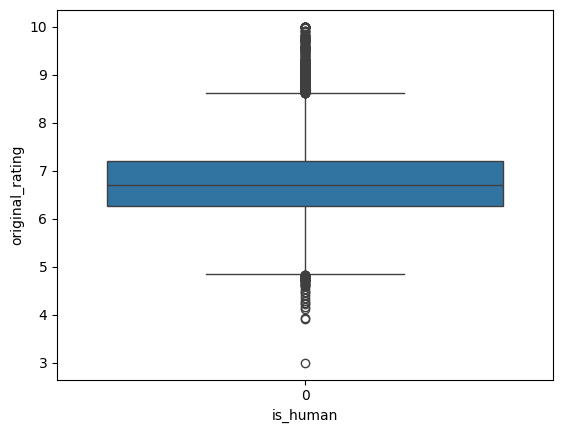

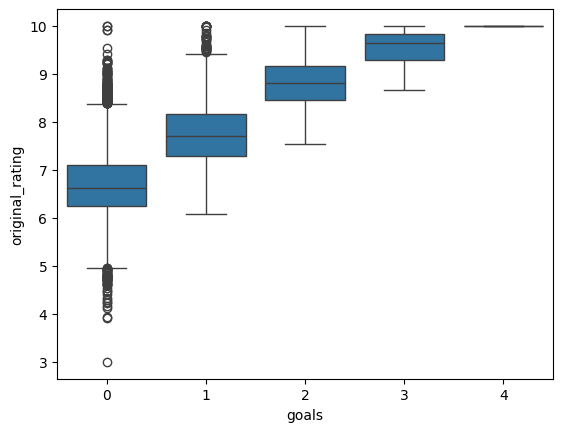

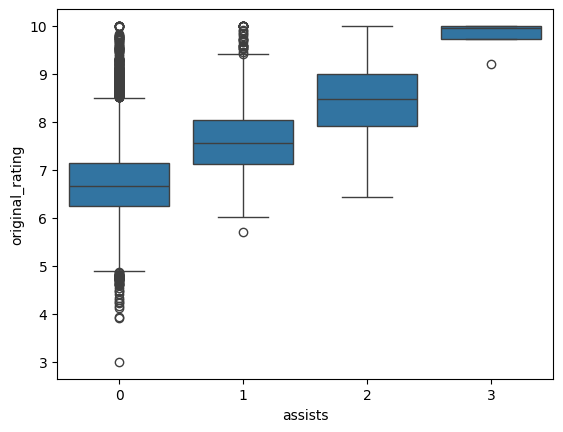

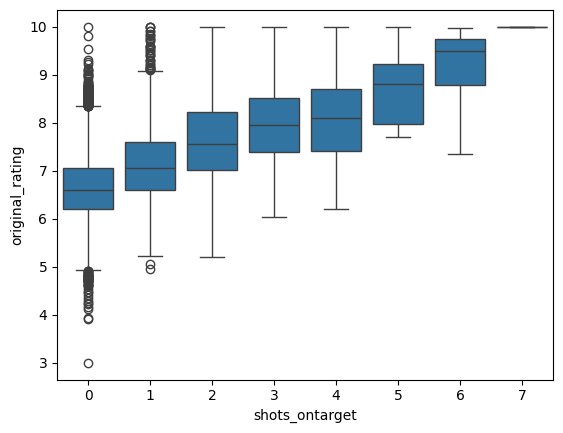

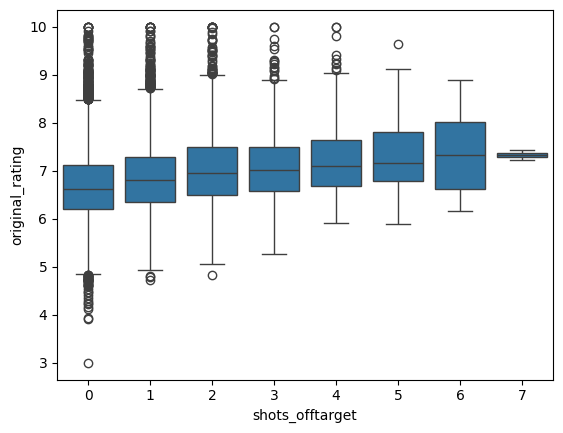

...

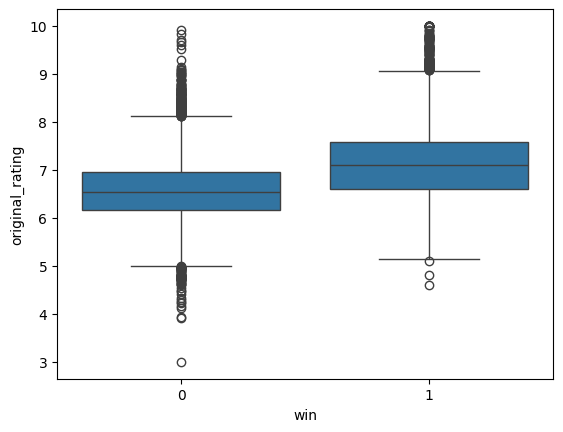

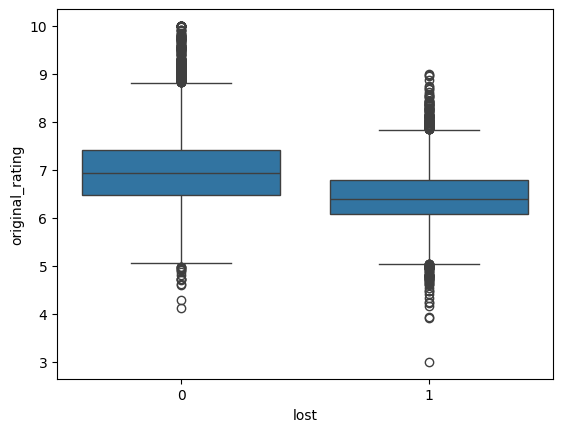

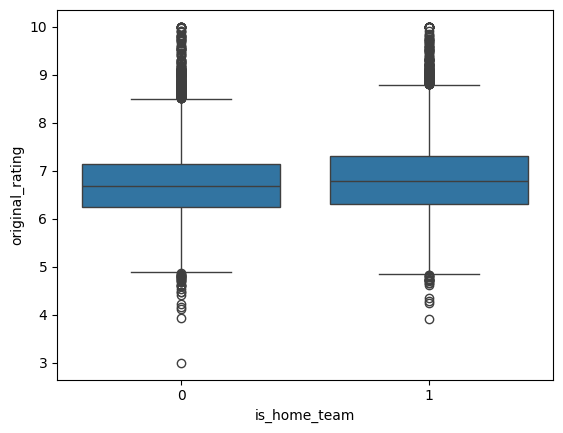

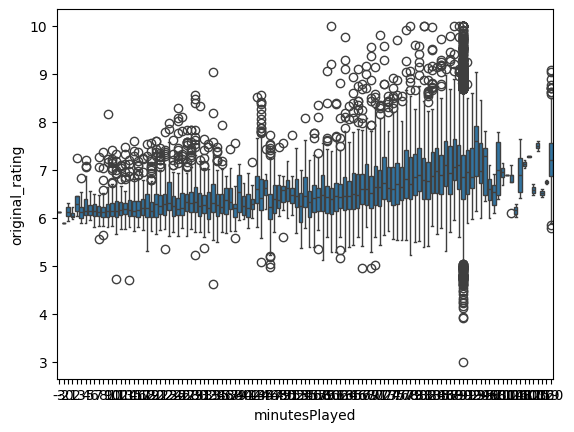

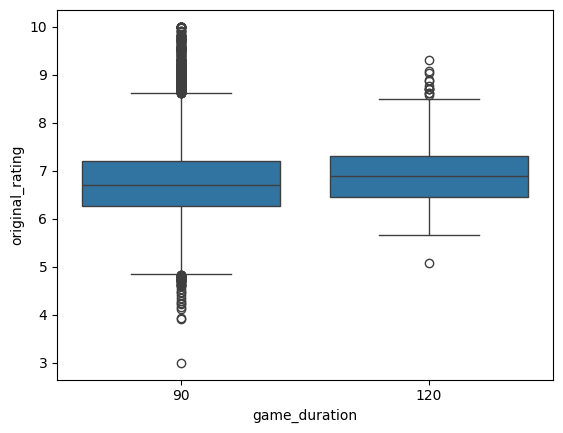

In [ ]:
for i, col in enumerate(dis_col):
    plt.figure(i)
    sns.boxplot(x=col, y='original_rating' ,data=df )

dangerous mistakes lowers rating \
goals raises ratings a lot \
assists raises ratings a lot \
keypasses raises ratings a lot \
red cards lowers ratings a lot \
more successful tackles/blocked shots/interceptions raises rating \
more success in aerial duels and ground duels increases rating \
saving penalties and saves outside and inside the box (for goalkeepers) raises ratings a lot \
letting in goals( for goalkeepers ) drops rating \
offsides raises rating could be because more chances are being created \
surprisingly losses in aerial duels and ground duels do not decrease as much only up to a certain point where doing it too much decreases rating \
passes ( through ball, long, crosses, ground ) whether they are inaccurate or acurrate have a slight increase in rating except for crosses which increases more significantly than the rest of the passes \
being fouled increases your rating maybe because there is contributions to chances being created \
counterattacks increase ratings only up to a certain point where it decreases after
dribbling whether it is unsuccessful or successful raises ratings \
stopping shots are significant to rating increase


<Axes: xlabel='None', ylabel='original_rating'>

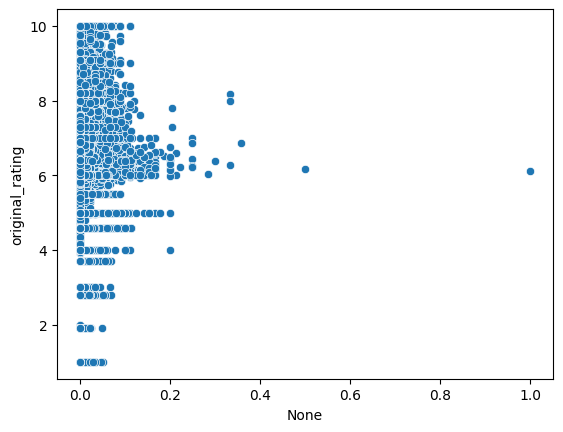

In [ ]:
dm = df['drib_success']/df['minutesPlayed']
sns.scatterplot(df, x = dm, y = 'original_rating')

In [ ]:
df['drib_success'].describe()

count    50652.000000
mean         0.524027
std          0.955628
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         10.000000
Name: drib_success, dtype: float64

## Original_rating vs float variables

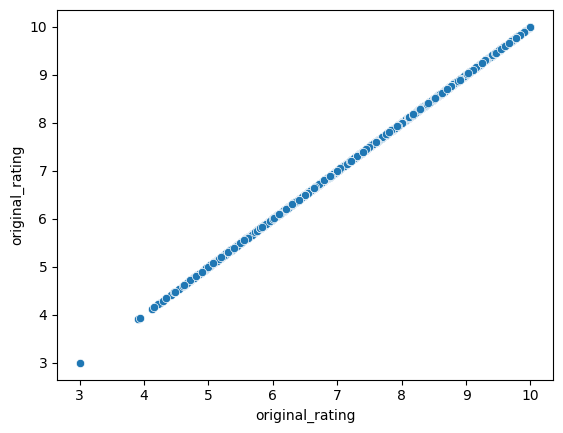

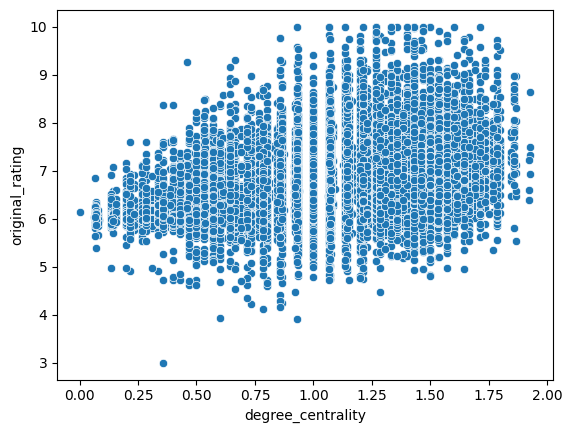

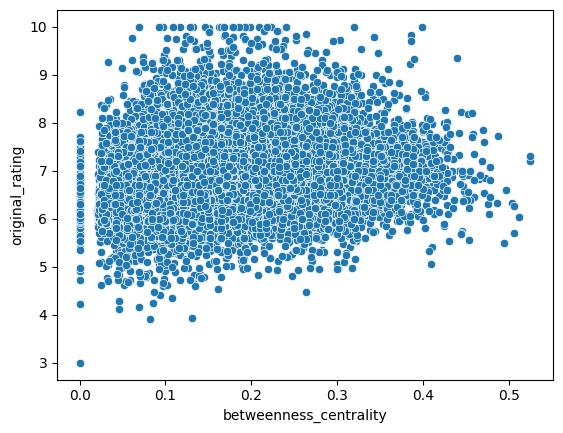

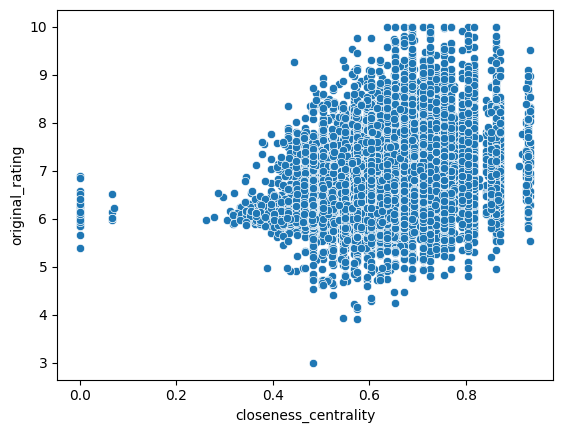

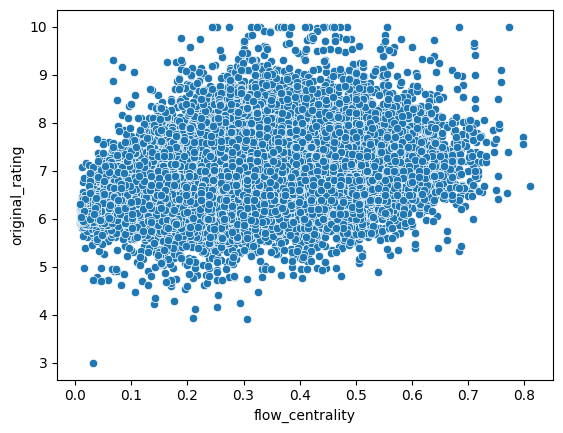

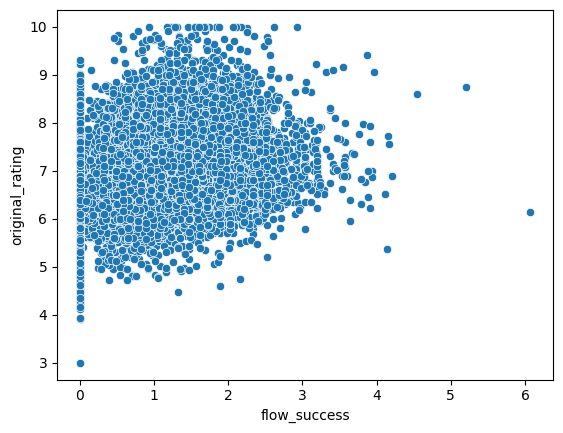

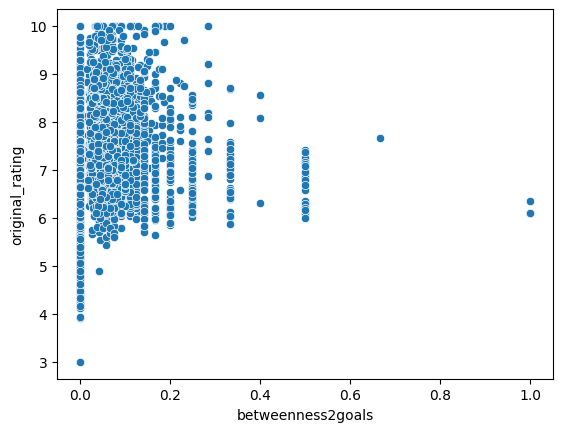

In [ ]:
for i, col in enumerate(float_col):
    plt.figure(i)
    sns.scatterplot(x=col, y='original_rating',data=df )

## Original_rating vs categorical variables

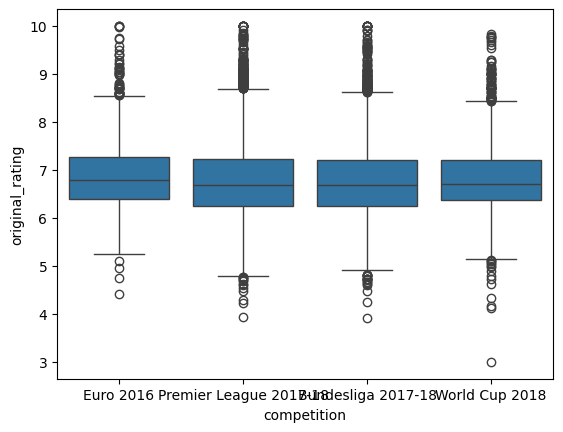

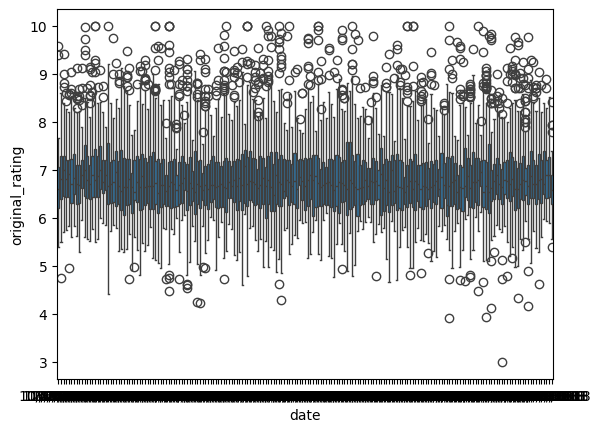

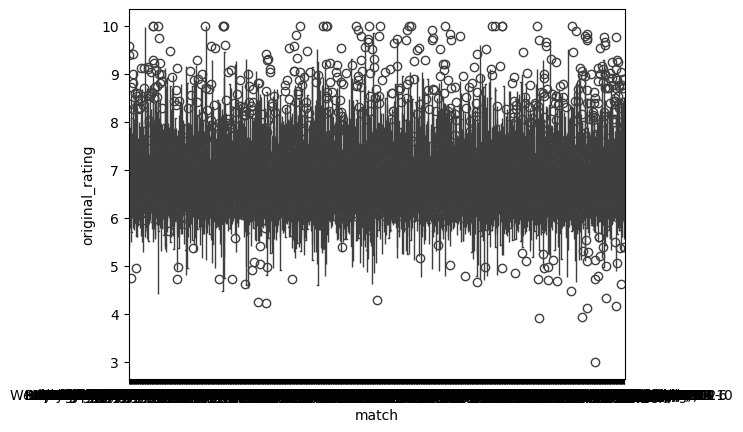

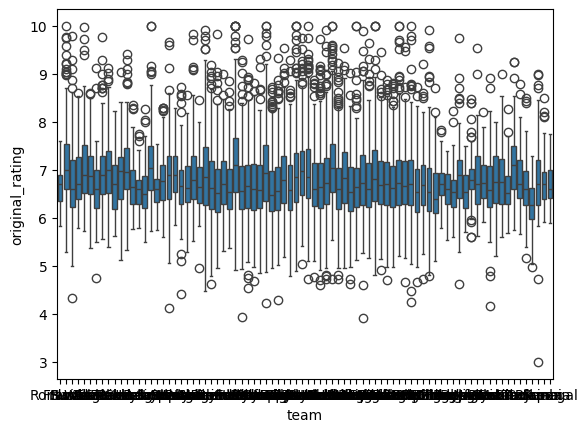

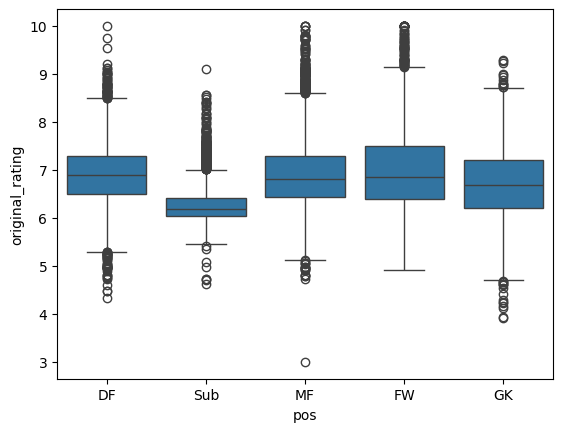

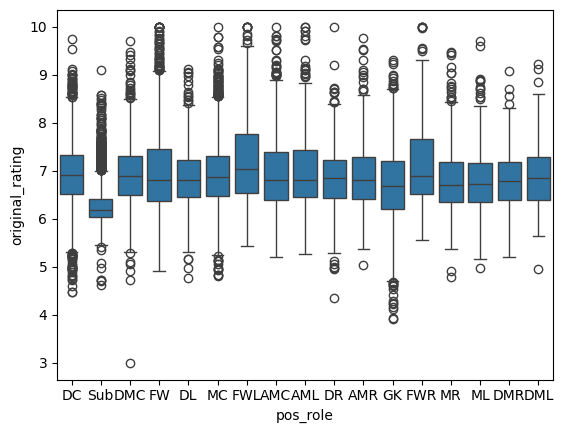

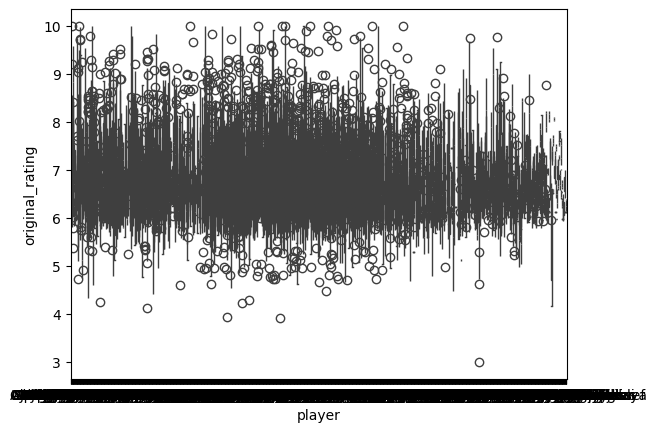

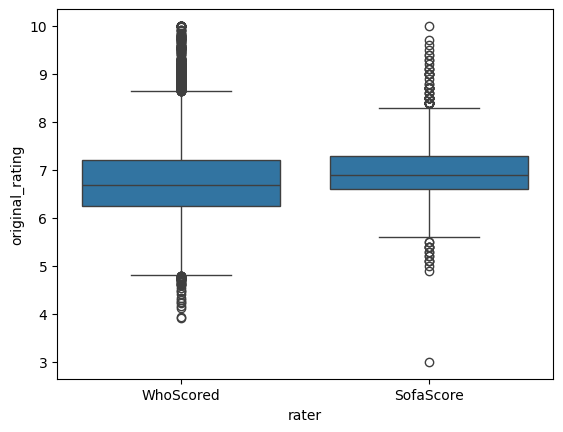

In [ ]:
for i, col in enumerate(cat_col):
    plt.figure(i)
    sns.boxplot(x=col, y='original_rating' ,data=df )

In [ ]:
# rating = df['original_rating']

In [ ]:
# rating = rating/10

In [ ]:
# rating

0        0.350
1        0.656
2        0.670
3        0.619
4        0.350
         ...  
50647    0.800
50648    0.689
50649    0.640
50650    0.600
50651    0.610
Name: original_rating, Length: 50652, dtype: float64

In [ ]:
numeric_col.corr()

,is_human,original_rating,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
is_human,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
original_rating,NaN,1.000000,0.492453,0.316788,0.405783,0.183829,0.121731,0.238047,0.257569,0.084920,...,0.274172,0.316532,0.397968,0.372387,0.268371,0.380974,-0.375198,0.079435,0.305573,0.027354
goals,NaN,0.492453,1.000000,0.063003,0.575937,0.137230,0.077804,0.179354,0.101150,0.090297,...,0.052374,0.090122,0.022528,0.164549,0.404609,0.174223,-0.138044,0.045126,0.032139,-0.009027
assists,NaN,0.316788,0.063003,1.000000,0.102038,0.093335,0.071618,0.115126,0.102305,0.089436,...,0.074009,0.110508,0.098620,0.173510,0.337153,0.155565,-0.113601,0.036750,0.044734,-0.010236
shots_ontarget,NaN,0.405783,0.575937,0.102038,1.000000,0.251504,0.165490,0.638656,0.172036,0.158055,...,0.092042,0.167747,0.054252,0.302129,0.270036,0.115990,-0.097046,0.047481,0.050627,-0.004720
shots_offtarget,NaN,0.183829,0.137230,0.093335,0.251504,1.000000,0.689204,0.679927,0.195732,0.170710,...,0.166003,0.278374,0.157722,0.408294,0.050917,0.023196,-0.037446,0.044916,0.093309,0.036576
shotsblocked,NaN,0.121731,0.077804,0.071618,0.165490,0.689204,1.000000,0.315979,0.168082,0.141543,...,0.111772,0.207899,0.123071,0.271542,0.026869,0.018535,-0.029210,0.037119,0.052866,0.018589
chances2score,NaN,0.238047,0.179354,0.115126,0.638656,0.679927,0.315979,1.000000,0.186887,0.176093,...,0.129008,0.233597,0.099067,0.389574,0.085586,0.044711,-0.052652,0.037324,0.084835,0.030143
drib_success,NaN,0.257569,0.101150,0.102305,0.172036,0.195732,0.168082,0.186887,1.000000,0.318860,...,0.136478,0.198163,0.172730,0.145875,0.046324,0.030409,-0.022329,0.017633,0.080534,0.009709
drib_unsuccess,NaN,0.084920,0.090297,0.089436,0.158055,0.170710,0.141543,0.176093,0.318860,1.000000,...,0.086512,0.135080,0.058707,0.112999,0.052691,-0.007985,0.005578,0.011816,0.044930,-0.000506


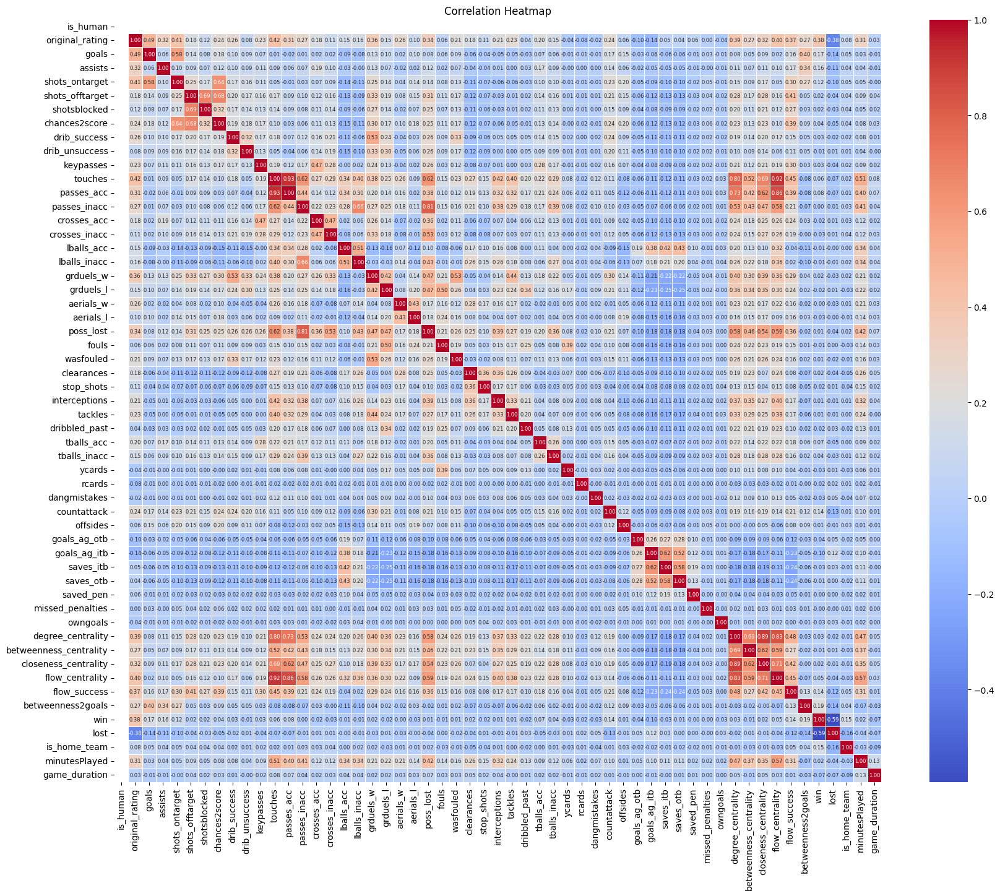

In [ ]:
plt.figure(figsize=(20, 16))
sns.heatmap(numeric_col.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5,annot_kws={'size':6})
plt.title("Correlation Heatmap")
plt.show()

## Pivot Tables

In [ ]:
piv_pos = pd.pivot_table(df, values = ['original_rating'], columns = ['pos'])

In [ ]:
piv_pos

pos,DF,FW,GK,MF,Sub
original_rating,6.27517,6.324922,6.529412,6.279232,6.054651


In [ ]:
DF = df[df['pos']=='DF']
FW = df[df['pos']=='FW']
GK = df[df['pos']=='GK']
MF = df[df['pos']=='MF']
Sub = df[df['pos']=='Sub']

In [ ]:
f, p_value = stats.kruskal(DF['original_rating'], FW['original_rating'], GK['original_rating'], MF['original_rating'], Sub['original_rating'])
p_value

1.2713684112561283e-258

## Pivot tables

In [ ]:
pivot_raters = pd.pivot_table(df, values = ['original_rating'], columns = ['rater'], aggfunc = 'mean')
pivot_raters

rater,Bild,Kicker,SkySports,SofaScore,TheGuardian,WhoScored
original_rating,5.438521,5.507164,6.234507,6.94209,6.223022,6.780975


In [ ]:
pivot_comp = pd.pivot_table(df, values = ['original_rating'], columns = ['competition'], aggfunc = 'mean')
pivot_comp

competition,Bundesliga 2017-18,Euro 2016,Premier League 2017-18,World Cup 2018
original_rating,5.995679,6.403423,6.511989,6.362785


In [ ]:
pivot_comp = pd.pivot_table(df,index = ['rater'], values = ['original_rating'], columns = ['competition'], aggfunc = 'mean')
pivot_comp

original_rating                                                
competition Bundesliga 2017-18 Euro 2016 Premier League 2017-18 World Cup 2018
rater                                                                         
Bild                  5.438521       NaN                    NaN            NaN
Kicker                5.520402  5.527248                    NaN       5.428247
SkySports                  NaN       NaN               6.215423       6.349057
SofaScore                  NaN  6.988395                    NaN       6.907091
TheGuardian                NaN  6.216095               6.416667            NaN
WhoScored             6.777136  6.785833               6.790964       6.736155

In [ ]:
Who_scored = df[df['rater'] == 'WhoScored']
group1 = Who_scored[Who_scored['competition'] == 'Bundesliga 2017-18']
group2 = Who_scored[Who_scored['competition'] == 'Euro 2016']
group3 = Who_scored[Who_scored['competition'] == 'Premier League 2017-18']
group4 = Who_scored[Who_scored['competition'] == 'World Cup 2018']

In [ ]:
f, p_value = stats.kruskal(group1['original_rating'], group2['original_rating'], group3['original_rating'], group4['original_rating'])
p_value

0.02244679750467804

competition has no effect on how well a player performs

In [ ]:
pd.pivot_table(df,index = ['rater'], values = ['original_rating'], columns = ['pos'], aggfunc = 'mean')

original_rating                                        
pos                      DF        FW        GK        MF       Sub
rater                                                              
Bild               5.356772  5.445134  6.186982  5.332057  6.100000
Kicker             5.459077  5.380085  6.531411  5.423002  5.173142
SkySports          6.246658  6.409639  6.403778  6.322040  5.820863
SofaScore          6.936009  7.051563  6.881448  6.925838       NaN
TheGuardian        6.176768  6.205479  6.296296  6.351240  6.031250
WhoScored          6.891948  7.024983  6.665111  6.906438  6.288142

In [ ]:
len(df[df['rater']=='WhoScored'])

21354

In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['shots_ontarget'], aggfunc = 'mean')

shots_ontarget,0,1,2,3,4,5,6,7
original_rating,6.123403,6.614257,7.223404,7.625706,7.624151,8.449655,8.555,10.0


In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['shots_offtarget'], aggfunc = 'mean')

shots_offtarget,0,1,2,3,4,5,6,7
original_rating,6.208379,6.316378,6.488742,6.515484,6.645193,6.955448,6.934762,7.165


In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['poss_lost'], aggfunc = 'mean')

poss_lost,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,37
original_rating,6.010092,6.103605,6.168701,6.131391,6.168838,6.13537,6.177401,6.195579,6.180422,6.292846,...,6.398246,6.639286,6.684127,6.522727,6.943636,5.241111,5.885,5.87,7.23,6.55


In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['passes_inacc'], aggfunc = 'mean')

passes_inacc,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,23
original_rating,6.012213,6.166219,6.16834,6.230661,6.289352,6.307625,6.281315,6.389924,6.362666,6.403514,...,6.291543,6.509713,6.197303,6.533,6.213871,6.753103,6.669259,6.501053,6.475,5.573333


In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['tballs_inacc'], aggfunc = 'mean')

tballs_inacc,0,1,2,3,4,5,6,7,8,10
original_rating,6.236669,6.311309,6.438336,6.550848,6.895434,6.726061,7.109091,6.786667,7.31,6.11


In [ ]:
pd.pivot_table(df, values = ['original_rating'], columns = ['chances2score'], aggfunc = 'mean')

chances2score,0,1,2,3,4,5,6,7,8
original_rating,6.185894,6.322193,6.52829,6.70801,6.774022,7.157744,7.18837,6.884286,6.685


## Testing for significance in variables

In [ ]:
for i in cat_col:
    contingency_table = pd.crosstab(df[i], df['original_rating'])
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    print("The variable",i,"has P-value:", p)

The variable competition has P-value: 0.0
The variable date has P-value: 8.457858362417819e-195
The variable match has P-value: 0.0
The variable team has P-value: 0.0
The variable pos has P-value: 0.0
The variable pos_role has P-value: 0.0
The variable player has P-value: 1.0
The variable rater has P-value: 0.0


In [ ]:
for i in dis_col:
    contingency_table = pd.crosstab(df[i], df['original_rating'])
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    print("The variable",i,"has P-value:", p)

The variable is_human has P-value: 0.0
The variable goals has P-value: 0.0
The variable assists has P-value: 0.0
The variable shots_ontarget has P-value: 0.0
The variable shots_offtarget has P-value: 5.275751931877955e-153
The variable shotsblocked has P-value: 3.737286128121858e-24
The variable chances2score has P-value: 0.0
The variable drib_success has P-value: 0.0
The variable drib_unsuccess has P-value: 4.579756038673158e-98
The variable keypasses has P-value: 0.0
The variable touches has P-value: 0.0
The variable passes_acc has P-value: 1.332431060981764e-308
The variable passes_inacc has P-value: 0.0
The variable crosses_acc has P-value: 4.50876913547337e-168
The variable crosses_inacc has P-value: 0.9937919465769665
The variable lballs_acc has P-value: 0.0
The variable lballs_inacc has P-value: 1.0643495036440089e-110
The variable grduels_w has P-value: 0.0
The variable grduels_l has P-value: 4.907117619086701e-66
The variable aerials_w has P-value: 0.0
The variable aerials_l h

In [ ]:
X = df[['touches','passes_acc','passes_inacc','poss_lost']]
X = sm.add_constant(X)
Y = df['original_rating']

model = sm.OLS(Y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        original_rating   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     123.7
Date:                Sun, 02 Feb 2025   Prob (F-statistic):          2.78e-105
Time:                        14:02:25   Log-Likelihood:                -84636.
No. Observations:               50652   AIC:                         1.693e+05
Df Residuals:                   50647   BIC:                         1.693e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            6.0334      0.013    449.434   

In [ ]:


X = df[float_col.columns.drop('original_rating')]
X = sm.add_constant(X)
Y = df['original_rating']

model = sm.OLS(Y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        original_rating   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     61.95
Date:                Sun, 02 Feb 2025   Prob (F-statistic):           6.63e-77
Time:                        14:02:34   Log-Likelihood:                -84697.
No. Observations:               50652   AIC:                         1.694e+05
Df Residuals:                   50645   BIC:                         1.695e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      5

flow centrality is the only significant variable

## PCA

In [ ]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_col)

In [ ]:
pca = PCA()

# Fit PCA to the standardized data
pca.fit(scaled_data)

PCA()

In [ ]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([1.67418722e-01, 8.11230651e-02, 5.32519031e-02, 4.40639689e-02,
       3.58724053e-02, 3.18755405e-02, 2.65020958e-02, 2.49711982e-02,
       2.45257902e-02, 2.22459924e-02, 2.18559686e-02, 2.06412947e-02,
       1.96822172e-02, 1.88100888e-02, 1.86910300e-02, 1.84768401e-02,
       1.82015963e-02, 1.76984839e-02, 1.75834296e-02, 1.73161607e-02,
       1.64197964e-02, 1.58511359e-02, 1.56396017e-02, 1.52237373e-02,
       1.47531688e-02, 1.41032509e-02, 1.38685968e-02, 1.35775801e-02,
       1.26460419e-02, 1.23673592e-02, 1.19523220e-02, 1.11251805e-02,
       1.04924288e-02, 1.01211607e-02, 1.00783014e-02, 9.75097617e-03,
       9.21023952e-03, 9.07572136e-03, 8.52458064e-03, 7.57938084e-03,
       7.29814846e-03, 7.22242242e-03, 6.91160727e-03, 6.72194341e-03,
       6.10400434e-03, 5.33513753e-03, 4.63194335e-03, 3.95335964e-03,
       2.99330941e-03, 1.65137436e-03, 1.53737527e-03, 1.25279276e-03,
       1.02353772e-03, 1.94691436e-04, 8.24372986e-34])

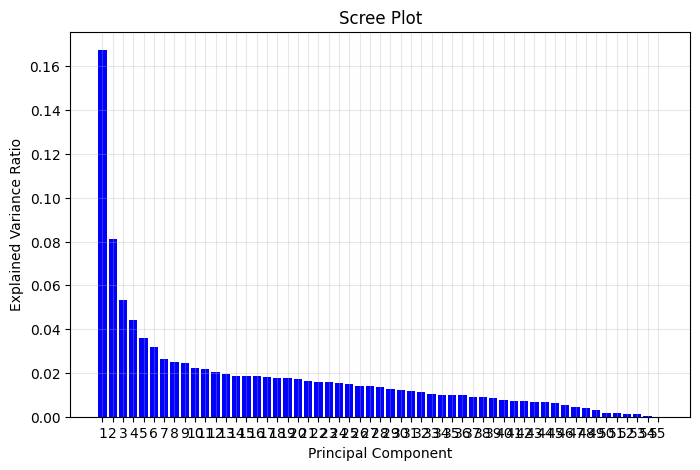

In [ ]:
# Plot the scree plot
plt.figure(figsize=(8, 5))
plt.bar(
    range(1, len(explained_variance) + 1),
    explained_variance,
    color='b'
)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(alpha=0.3)
plt.show()

In [ ]:
loadings = pd.DataFrame(
    pca.components_.T,  # Transpose the PCA components to align with variables
    columns=[f'PC{i+1}' for i in range(len(pca.components_))],
    index=numeric_col.columns  # Use the original column names
)

# Print the loadings
print("Loading Scores (Columns vs Principal Components):")
print(loadings)

Loading Scores (Columns vs Principal Components):
                                 PC1           PC2           PC3  \
is_human               -2.034841e-19 -5.087825e-19 -5.738024e-19   
original_rating         1.796543e-01  5.621162e-02  2.487545e-01   
goals                   5.506967e-02  1.795023e-01  1.838443e-01   
assists                 6.413290e-02  9.317098e-02  1.395051e-01   
shots_ontarget          8.669555e-02  2.436361e-01  1.880336e-01   
shots_offtarget         1.277468e-01  2.184631e-01  1.046439e-01   
shotsblocked            9.625776e-02  1.637305e-01  9.213654e-02   
chances2score           1.126491e-01  2.498915e-01  1.372334e-01   
drib_success            1.129013e-01  1.553730e-01  5.242227e-02   
drib_unsuccess          7.475850e-02  1.672168e-01  1.244935e-02   
keypasses               1.085417e-01  9.698049e-02  1.213599e-01   
touches                 2.804724e-01 -1.679000e-01  3.056490e-02   
passes_acc              2.274104e-01 -1.831442e-01  1.702446e-02  

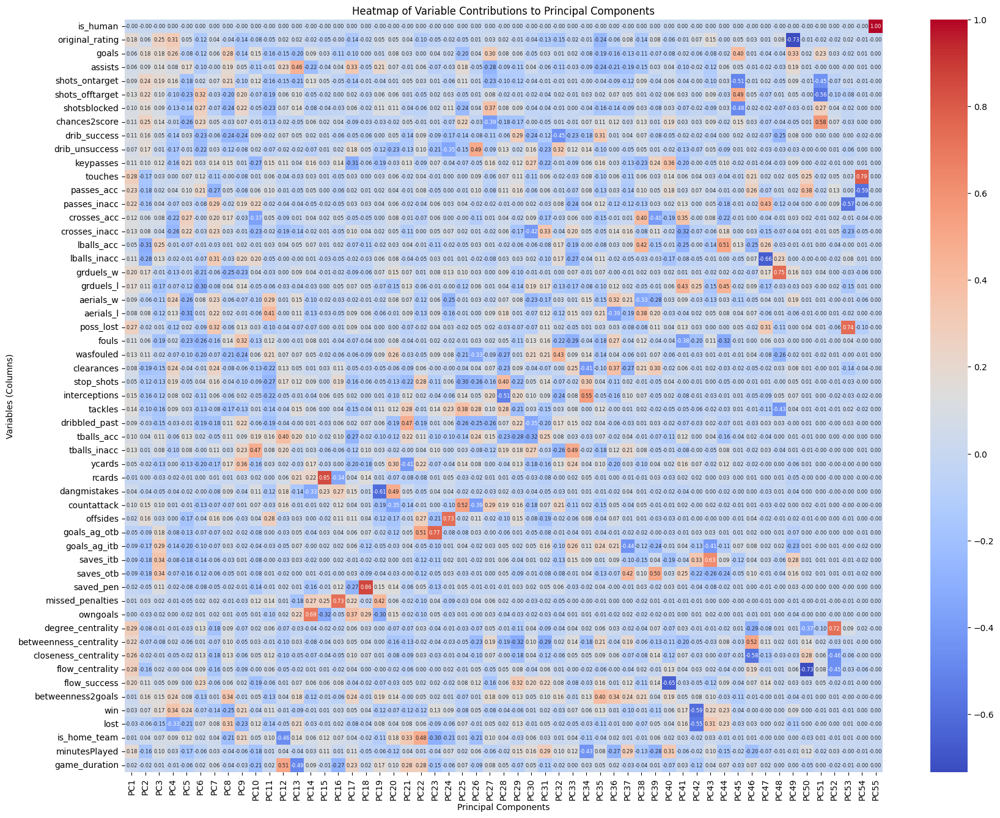

In [ ]:
plt.figure(figsize=(20, 16))
sns.heatmap(loadings, annot=True, cmap='coolwarm', fmt=".2f",annot_kws={'size':6})
plt.title("Heatmap of Variable Contributions to Principal Components")
plt.xlabel("Principal Components")
plt.ylabel("Variables (Columns)")
plt.show()

## LASSO

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


In [ ]:
numeric_col.columns

Index(['is_human', 'original_rating', 'goals', 'assists', 'shots_ontarget',
       'shots_offtarget', 'shotsblocked', 'chances2score', 'drib_success',
       'drib_unsuccess', 'keypasses', 'touches', 'passes_acc', 'passes_inacc',
       'crosses_acc', 'crosses_inacc', 'lballs_acc', 'lballs_inacc',
       'grduels_w', 'grduels_l', 'aerials_w', 'aerials_l', 'poss_lost',
       'fouls', 'wasfouled', 'clearances', 'stop_shots', 'interceptions',
       'tackles', 'dribbled_past', 'tballs_acc', 'tballs_inacc', 'ycards',
       'rcards', 'dangmistakes', 'countattack', 'offsides', 'goals_ag_otb',
       'goals_ag_itb', 'saves_itb', 'saves_otb', 'saved_pen',
       'missed_penalties', 'owngoals', 'degree_centrality',
       'betweenness_centrality', 'closeness_centrality', 'flow_centrality',
       'flow_success', 'betweenness2goals', 'win', 'lost', 'is_home_team',
       'minutesPlayed', 'game_duration'],
      dtype='object')

In [ ]:
# Define features (X) and target variable (y)
df_encoded = pd.get_dummies(df, columns=['pos'])

X = df_encoded.drop(columns=["original_rating",'player','date','match','competition','rater','team','pos_role'])  # Replace 'target' with your actual target column
y = df["original_rating"]


# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree

# Train a Random Forest classifier
from sklearn.ensemble import RandomForestRegressor

# Train a Random Forest regressor
rf_reg = RandomForestRegressor(n_estimators=100, min_samples_split=10, min_samples_leaf=1, max_features='sqrt', max_depth=None,random_state=42)
rf_reg.fit(X_train, y_train)






RandomForestRegressor(max_features='sqrt', min_samples_split=10,
                      random_state=42)

In [ ]:
cat_col

,competition,date,match,team,pos,pos_role,player,rater
1,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,WhoScored
2,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,DF,DC,Dragos Grigore,SofaScore
3,Euro 2016,10/06/2016,"France - Romania, 2 - 1",France,Sub,Sub,Anthony Martial,WhoScored
5,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,WhoScored
6,Euro 2016,10/06/2016,"France - Romania, 2 - 1",Romania,MF,DMC,Mihai Pintilii,SofaScore
...,...,...,...,...,...,...,...,...
50644,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,WhoScored
50645,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,MC,Ivan Rakitic,SofaScore
50648,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,WhoScored
50649,World Cup 2018,15/07/2018,"France - Croatia, 4 - 2",Croatia,MF,ML,Ivan Perisic,SofaScore


                   Feature  Importance
0                 is_human    0.201741
46         flow_centrality    0.043238
10                 touches    0.039113
44  betweenness_centrality    0.038636
47            flow_success    0.036004
11              passes_acc    0.033823
1                    goals    0.030979
43       degree_centrality    0.030693
45    closeness_centrality    0.030059
48       betweenness2goals    0.027771
21               poss_lost    0.025475
17               grduels_w    0.022369
15              lballs_acc    0.022156
12            passes_inacc    0.021195
50                    lost    0.020457
18               grduels_l    0.019547
19               aerials_w    0.019168
49                     win    0.018430
26           interceptions    0.017784
52           minutesPlayed    0.017652
3           shots_ontarget    0.017036
16            lballs_inacc    0.016299
20               aerials_l    0.015236
24              clearances    0.014810
34             countattac

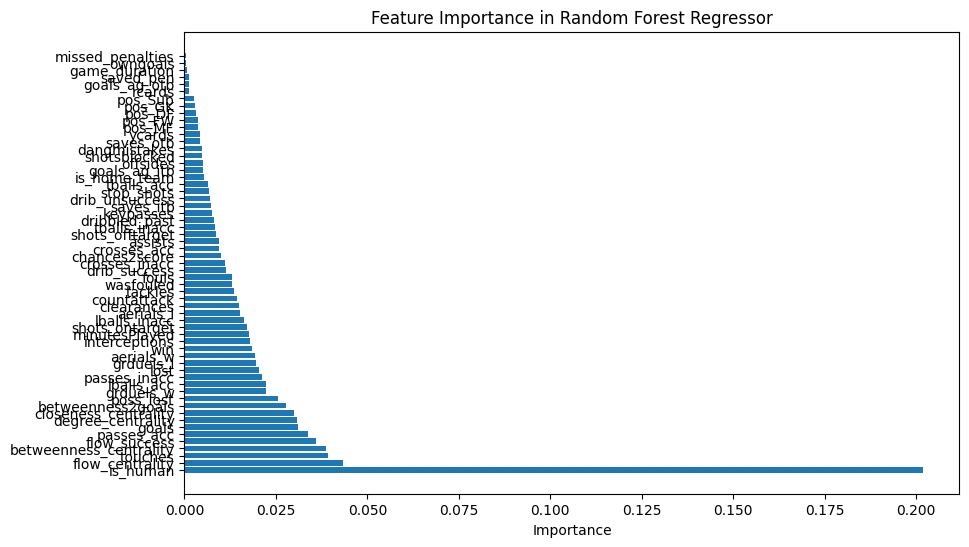

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


feature_names = [f"Feature {i+1}" for i in range(X_train.shape[1])]
# Get feature importances
importances = rf_reg.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,  # Using the column names from the original dataset
    'Importance': importances
})

# Sort the features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print the feature importance
print(feature_importance_df)

# Plot the feature importance
plt.figure(figsize=(10,6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Feature Importance in Random Forest Regressor')
plt.show()

In [ ]:
X_train

,is_human,goals,assists,shots_ontarget,shots_offtarget,shotsblocked,chances2score,drib_success,drib_unsuccess,keypasses,...,betweenness_centrality,closeness_centrality,flow_centrality,flow_success,betweenness2goals,win,lost,is_home_team,minutesPlayed,game_duration
22677,0,0,0,0,0,0,0,0,1,2,...,0.251764,0.738462,0.323077,0.730817,0.000000,0,0,1,90,90
49411,0,0,0,0,1,0,0,0,0,0,...,0.096107,0.653333,0.432692,1.400155,0.000000,0,0,0,120,120
44334,0,0,0,0,0,0,0,1,0,0,...,0.240840,0.605042,0.344262,0.523195,0.000000,0,1,1,90,90
40145,0,0,0,0,0,0,0,0,0,0,...,0.051493,0.710084,0.186047,0.319686,0.000000,0,1,0,71,90
3060,0,0,0,0,0,0,0,0,0,2,...,0.207498,0.738462,0.508333,1.497319,0.000000,0,1,0,120,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46286,0,1,0,1,3,1,2,0,1,1,...,0.252331,0.710084,0.378788,1.047249,0.052632,1,0,0,90,90
10995,0,0,0,0,0,0,0,0,0,0,...,0.109528,0.502976,0.068182,0.000000,0.000000,0,0,0,14,90
1486,0,0,1,0,0,0,0,0,0,1,...,0.206763,0.804762,0.488889,2.218487,0.076923,1,0,0,81,90
33769,0,0,0,0,0,0,0,0,0,0,...,0.097910,0.544444,0.086022,0.111111,0.000000,0,1,1,8,90


## Combination of the variables

In [9]:
df['total_dribbles'] = df['drib_success']  + df['drib_unsuccess']
df['total_tballs'] = df['tballs_acc'] + df['tballs_inacc']
df['total_shots'] = df['shots_ontarget'] + df['shots_offtarget']
df['total_passes'] = df['passes_acc'] + df['passes_inacc']
df['total_lballs'] = df['lballs_acc'] + df['lballs_inacc']
df['goals_conceded'] = df['goals_ag_otb'] + df['goals_ag_itb']
df['saves'] = df['saves_itb'] + df['saves_otb']
df['total_aerials'] = df['aerials_l'] + df['aerials_w']
df['total_crosses'] = df['crosses_acc'] + df['crosses_inacc']
df['total_grduels'] = df['grduels_w'] + df['grduels_l']

In [10]:
human_df['total_dribbles'] = human_df['drib_success']  + human_df['drib_unsuccess']
human_df['total_tballs'] = human_df['tballs_acc'] + human_df['tballs_inacc']
human_df['total_shots'] = human_df['shots_ontarget'] + human_df['shots_offtarget']
human_df['total_passes'] = human_df['passes_acc'] + human_df['passes_inacc']
human_df['total_lballs'] = human_df['lballs_acc'] + human_df['lballs_inacc']
human_df['goals_conceded'] = human_df['goals_ag_otb'] + human_df['goals_ag_itb']
human_df['saves'] = human_df['saves_itb'] + human_df['saves_otb']
human_df['total_aerials'] = human_df['aerials_l'] + human_df['aerials_w']
human_df['total_crosses'] = human_df['crosses_acc'] + human_df['crosses_inacc']
human_df['total_grduels'] = human_df['grduels_w'] + human_df['grduels_l']

<ipython-input-10-57450aba6532>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  human_df['total_dribbles'] = human_df['drib_success']  + human_df['drib_unsuccess']
<ipython-input-10-57450aba6532>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  human_df['total_tballs'] = human_df['tballs_acc'] + human_df['tballs_inacc']
<ipython-input-10-57450aba6532>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

In [11]:
df_continuous['total_dribbles'] = df_continuous['drib_success']  + df_continuous['drib_unsuccess']
df_continuous['total_tballs'] = df_continuous['tballs_acc'] + df_continuous['tballs_inacc']
df_continuous['total_shots'] = df_continuous['shots_ontarget'] + df_continuous['shots_offtarget']
df_continuous['total_passes'] = df_continuous['passes_acc'] + df_continuous['passes_inacc']
df_continuous['total_lballs'] = df_continuous['lballs_acc'] + df_continuous['lballs_inacc']
df_continuous['goals_conceded'] = df_continuous['goals_ag_otb'] + df_continuous['goals_ag_itb']
df_continuous['saves'] = df_continuous['saves_itb'] + df_continuous['saves_otb']
df_continuous['total_aerials'] = df_continuous['aerials_l'] + df_continuous['aerials_w']
df_continuous['total_crosses'] = df_continuous['crosses_acc'] + df_continuous['crosses_inacc']
df_continuous['total_grduels'] = df_continuous['grduels_w'] + df_continuous['grduels_l']

<ipython-input-11-85c174771b4e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_continuous['total_dribbles'] = df_continuous['drib_success']  + df_continuous['drib_unsuccess']
<ipython-input-11-85c174771b4e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_continuous['total_tballs'] = df_continuous['tballs_acc'] + df_continuous['tballs_inacc']
<ipython-input-11-85c174771b4e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_i

## Selection of the variables

In [12]:
selected_variables = ['original_rating',
                   'saves',
                   'total_dribbles',
                   'total_tballs',
                   'total_shots',
                   'total_passes',
                   'goals_conceded',
                   'goals',
                   'assists',
                   'dangmistakes',
                   'chances2score',
                   'shotsblocked',
                   'stop_shots',
                   'keypasses',
                   'tackles',
                   'interceptions',
                   'wasfouled',
                   'rcards',
                   'saved_pen',
                   'clearances',
                   'pos',
                   'owngoals',
                   'touches',
                   'countattack',
                   'total_grduels',
                   'total_crosses',
                   'total_aerials']

In [13]:
cleaned_df = df_continuous[selected_variables]
mixed_df = df[selected_variables]
human_cleaned_df = human_df[selected_variables]


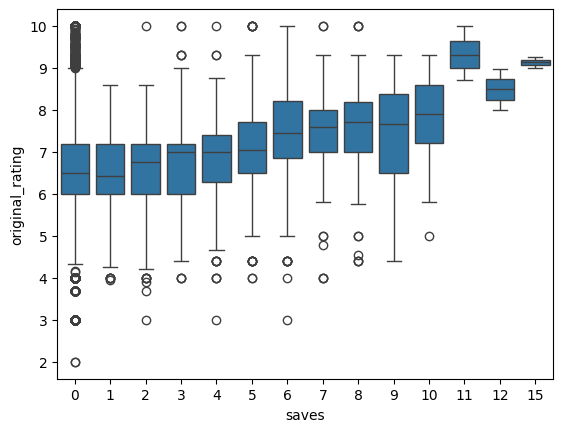

In [ ]:
sns.boxplot(data = mixed_df, x = 'saves', y = 'original_rating')
plt.title('')
plt.xlabel('saves')
plt.ylabel('original_rating')
plt.show()

In [ ]:
summary_stats = ['original_rating','goals', 'assists','tackles', 'saves']
mixed_df[summary_stats].describe()

,original_rating,goals,assists,tackles,saves
count,50652.000000,50652.000000,50652.000000,50652.000000,50652.000000
mean,6.274450,0.099601,0.061893,1.084084,0.245894
std,1.299299,0.335712,0.257212,1.299793,1.015705
min,1.000000,0.000000,0.000000,0.000000,0.000000
25%,5.980000,0.000000,0.000000,0.000000,0.000000
50%,6.400000,0.000000,0.000000,1.000000,0.000000
75%,7.000000,0.000000,0.000000,2.000000,0.000000
max,10.000000,4.000000,3.000000,11.000000,15.000000


In [ ]:
cleaned_df.head()

,original_rating,saves,total_dribbles,total_tballs,total_shots,total_passes,goals_conceded,goals,assists,dangmistakes,...,rcards,saved_pen,clearances,pos,owngoals,touches,countattack,total_grduels,total_crosses,total_aerials
1,6.56,0,0,0,0,25,0,0,0,0,...,0,0,8,DF,0,34,2,2,0,3
2,6.70,0,0,0,0,25,0,0,0,0,...,0,0,8,DF,0,34,2,2,0,3
3,6.19,0,1,0,1,4,0,0,0,0,...,0,0,1,Sub,0,10,0,2,0,0
5,6.58,0,2,0,1,40,0,0,0,0,...,0,0,4,MF,0,60,2,11,0,2
6,6.80,0,2,0,1,40,0,0,0,0,...,0,0,4,MF,0,60,2,11,0,2


In [ ]:
cleaned_df.columns
len(cleaned_df.columns)

27

In [ ]:
from sklearn.linear_model import LassoCV

lasso = LassoCV(cv=20, random_state=42)  # 5-fold cross-validation
lasso.fit(cleaned_df.drop(columns = ['original_rating','pos']), cleaned_df['original_rating'])

# Best lambda value chosen by cross-validation
print("Optimal lambda:", lasso.alpha_)

# Get non-zero coefficients (selected features)
selected_features = np.where(lasso.coef_ != 0)[0]

# Print selected feature names
selected_feature_names = cleaned_df.columns[selected_features]
print("Selected features:", selected_feature_names)
len(selected_feature_names)

Optimal lambda: 0.007658956281577529
Selected features: Index(['original_rating', 'saves', 'total_dribbles', 'total_tballs',
       'total_shots', 'total_passes', 'goals_conceded', 'goals', 'assists',
       'dangmistakes', 'shotsblocked', 'stop_shots', 'keypasses', 'tackles',
       'interceptions', 'saved_pen', 'pos', 'owngoals', 'touches',
       'countattack', 'total_grduels'],
      dtype='object')


21

In [ ]:
cleaned_df.drop(columns = 'pos').corr()

,original_rating,saves,total_dribbles,total_tballs,total_shots,total_passes,crosses_acc,goals_conceded,goals,assists,...,chances2score,shotsblocked,stop_shots,keypasses,tackles,interceptions,wasfouled,rcards,saved_pen,clearances
original_rating,1.000000,0.050010,0.225554,0.209399,0.346354,0.329171,0.180180,-0.150264,0.492453,0.316788,...,0.238047,0.121731,0.109221,0.232255,0.230065,0.209944,0.212889,-0.079838,0.055504,0.175836
saves,0.050010,1.000000,-0.146559,-0.115132,-0.164161,-0.127199,-0.116223,0.653862,-0.068220,-0.054805,...,-0.139718,-0.098013,-0.092613,-0.095127,-0.188703,-0.123179,-0.146795,-0.010596,0.183452,-0.112223
total_dribbles,0.225554,-0.146559,1.000000,0.185189,0.271975,0.046122,0.186346,-0.128459,0.118195,0.118560,...,0.223195,0.191983,-0.087897,0.182324,0.033394,0.033569,0.315643,-0.001650,-0.028301,-0.124179
total_tballs,0.209399,-0.115132,0.185189,1.000000,0.204370,0.320058,0.152681,-0.102086,0.075972,0.149421,...,0.172157,0.155796,-0.033851,0.262047,0.075896,0.079023,0.146769,-0.003885,-0.021805,-0.043058
total_shots,0.346354,-0.164161,0.271975,0.204370,1.000000,0.072908,0.121844,-0.143656,0.401099,0.121560,...,0.830893,0.590638,-0.083735,0.180156,-0.037767,-0.055224,0.197857,-0.014142,-0.031490,-0.143263
total_passes,0.329171,-0.127199,0.046122,0.320058,0.072908,1.000000,0.161303,-0.115519,-0.020752,0.064345,...,0.033082,0.092489,0.132705,0.137240,0.339587,0.352039,0.139304,-0.020267,-0.027418,0.202796
crosses_acc,0.180180,-0.116223,0.186346,0.152681,0.121844,0.161303,1.000000,-0.101536,0.018397,0.187530,...,0.111485,0.110139,-0.069058,0.466314,0.035249,0.065200,0.112889,-0.008079,-0.022675,-0.056552
goals_conceded,-0.150264,0.653862,-0.128459,-0.102086,-0.143656,-0.115519,-0.101536,1.000000,-0.059648,-0.047963,...,-0.122250,-0.085819,-0.080875,-0.083161,-0.164728,-0.101156,-0.134068,-0.009264,0.130089,-0.098627
goals,0.492453,-0.068220,0.118195,0.075972,0.401099,-0.020752,0.018397,-0.059648,1.000000,0.063003,...,0.179354,0.077804,-0.037228,0.072827,-0.046729,-0.050259,0.089510,-0.007311,-0.013036,-0.055018
assists,0.316788,-0.054805,0.118560,0.149421,0.121560,0.064345,0.187530,-0.047963,0.063003,1.000000,...,0.115126,0.071618,-0.037971,0.109960,0.003111,0.005087,0.066319,0.000516,-0.010632,-0.041054


<Axes: >

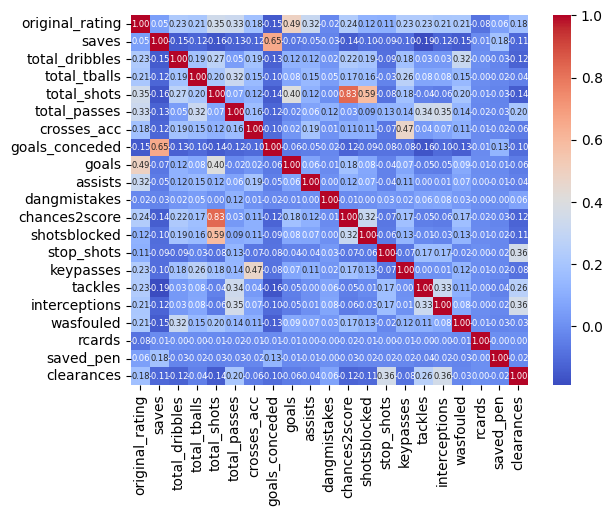

In [ ]:
sns.heatmap(cleaned_df.drop(columns = 'pos').corr(), annot=True, cmap='coolwarm', fmt=".2f",annot_kws={'size':6})

## EDA on the cleaned and refined dataset

C:\Users\prolo\AppData\Local\Temp\ipykernel_48668\509837183.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


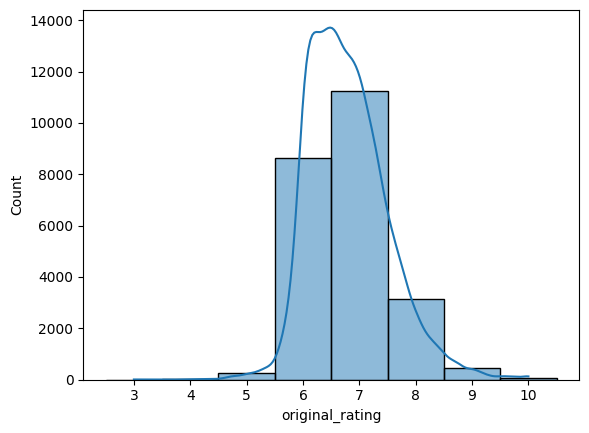

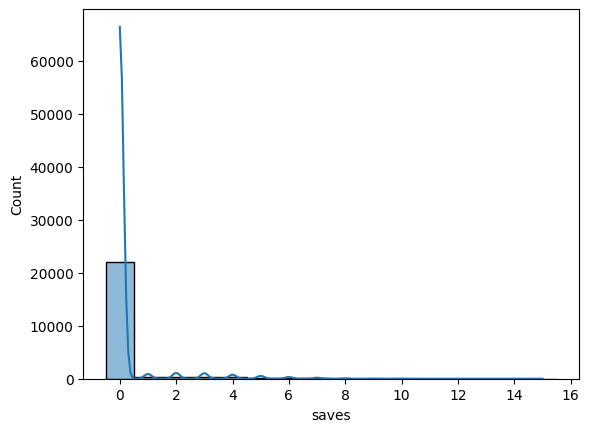

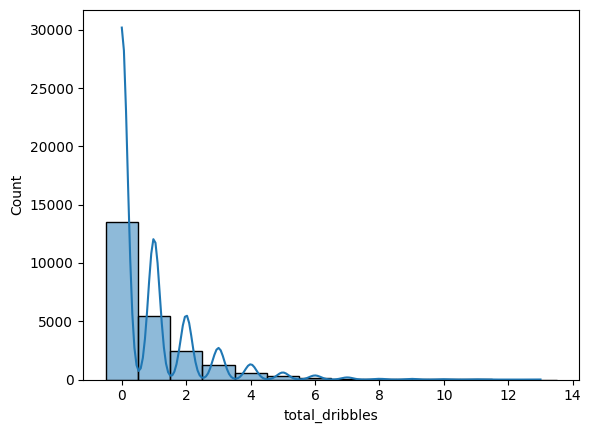

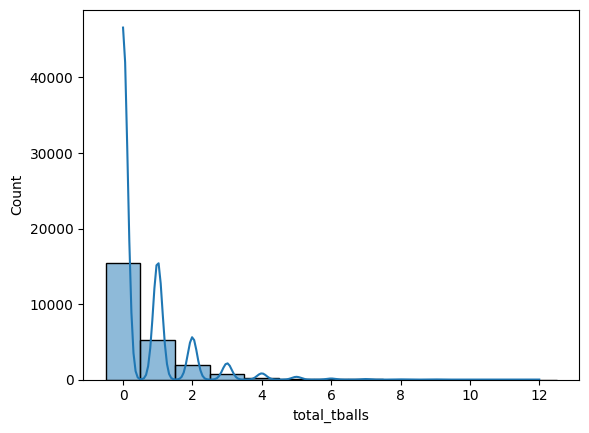

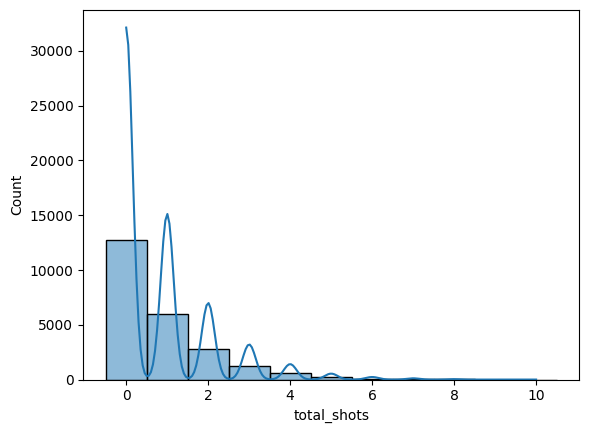

...

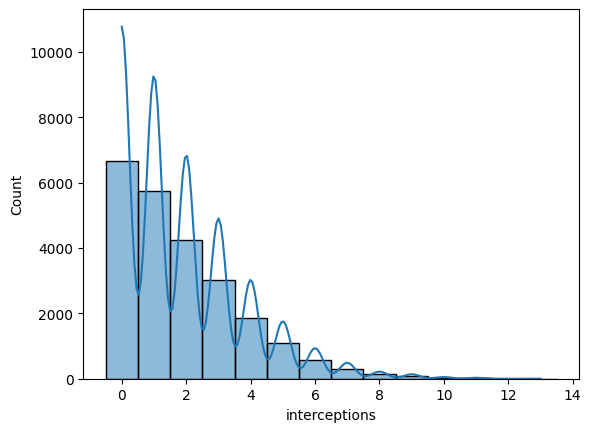

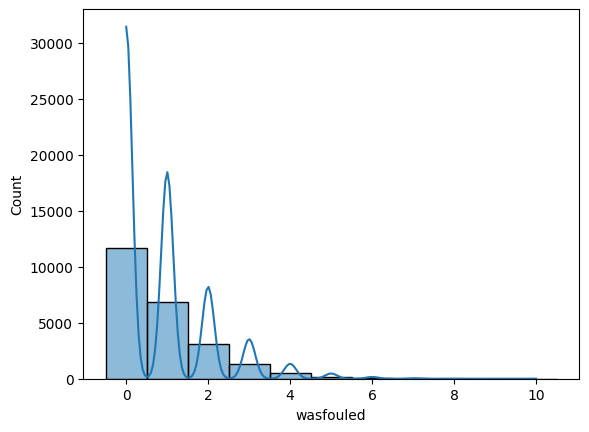

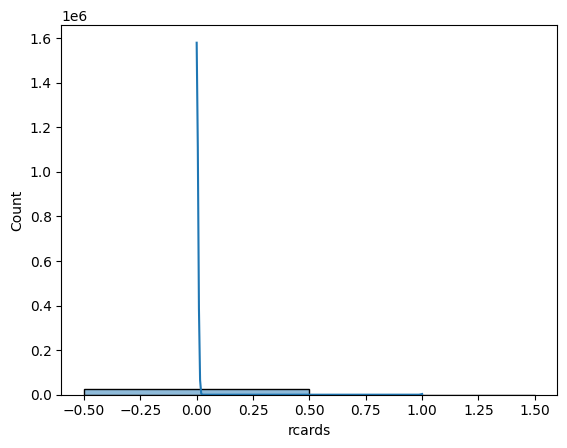

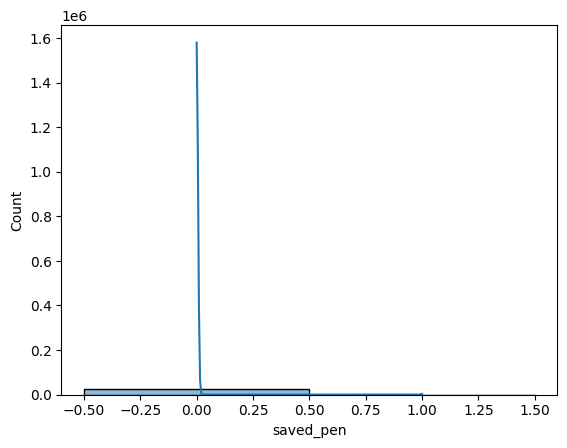

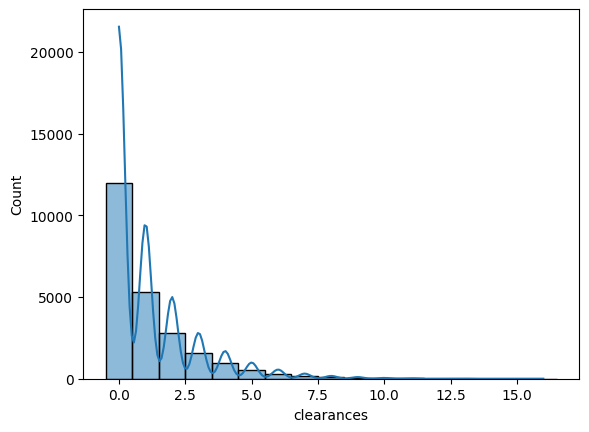

In [ ]:
for i,col in enumerate(cleaned_df.drop('pos',axis = 1)):
    plt.figure(i)
    sns.histplot(x = col, data = cleaned_df.drop('pos',axis = 1), kde = True, discrete = True)


In [ ]:
cleaned_df = pd.get_dummies(cleaned_df, dtype=int, columns=['pos'])
cleaned_df

,original_rating,saves,total_dribbles,total_tballs,total_shots,total_passes,goals_conceded,goals,assists,dangmistakes,...,touches,countattack,total_grduels,total_crosses,total_aerials,pos_DF,pos_FW,pos_GK,pos_MF,pos_Sub
1,6.56,0,0,0,0,25,0,0,0,0,...,34,2,2,0,3,1,0,0,0,0
2,6.70,0,0,0,0,25,0,0,0,0,...,34,2,2,0,3,1,0,0,0,0
3,6.19,0,1,0,1,4,0,0,0,0,...,10,0,2,0,0,0,0,0,0,1
5,6.58,0,2,0,1,40,0,0,0,0,...,60,2,11,0,2,0,0,0,1,0
6,6.80,0,2,0,1,40,0,0,0,0,...,60,2,11,0,2,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50644,6.64,0,1,2,3,62,0,0,0,1,...,91,1,9,4,4,0,0,0,1,0
50645,6.90,0,1,2,3,62,0,0,0,1,...,91,1,9,4,4,0,0,0,1,0
50648,6.89,0,0,0,2,26,0,1,0,0,...,58,2,15,9,5,0,0,0,1,0
50649,6.40,0,0,0,2,26,0,1,0,0,...,58,2,15,9,5,0,0,0,1,0


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(cleaned_df.drop(columns='original_rating'), cleaned_df['original_rating'], test_size=0.2, random_state=42)

In [ ]:
y_train = (1/10)*((y_train* (len(y_train) - 1) + 0.5)/len(y_train))

In [ ]:
y_train.describe()

,original_rating
count,19004.000000
mean,0.679528
std,0.070904
min,0.299987
25%,0.626970
50%,0.669967
75%,0.720965
max,0.999950


In [ ]:
# @title Model building with beta regression


In [ ]:
# @title Human-rated df beta regression

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

gk_attributes = ['saves', 'goals_conceded','saved_pen']

# Fit beta regression model
X_gk_human = sm.add_constant(human_cleaned_df[human_cleaned_df['pos'] == 'GK' ][gk_attributes])

y_train_gk_human = (1/10)*(((human_cleaned_df[human_cleaned_df['pos'] == 'GK' ]['original_rating'])* (len((human_cleaned_df[human_cleaned_df['pos'] == 'GK' ]['original_rating'])) - 1) + 0.5)/len((human_cleaned_df[human_cleaned_df['pos'] == 'GK' ]['original_rating'])))

model_for_gk_human = BetaModel(y_train_gk_human/10, X_gk_human, link=Probit())
results_gk_human = model_for_gk_human.fit()

# Print model summary
print(results_gk_human.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 6690.5
Model:                      BetaModel   AIC:                        -1.337e+04
Method:            Maximum Likelihood   BIC:                        -1.334e+04
Date:                Tue, 04 Mar 2025                                         
Time:                        10:15:42                                         
No. Observations:                2223                                         
Df Residuals:                    2218                                         
Df Model:                           3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.5156      0.004   -369.676      0.000      -1.524      -1.508
saves              0.0142      0.001    

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

defense_attributes = ['dangmistakes', 'interceptions','clearances','shotsblocked','stop_shots','tackles','owngoals','total_aerials','total_grduels','rcards','total_tballs']

# Fit beta regression model
X_df_human = sm.add_constant(human_cleaned_df[human_cleaned_df['pos'] == 'DF' ][defense_attributes])

y_train_df_human = (1/10)*(((human_cleaned_df[human_cleaned_df['pos'] == 'DF' ]['original_rating'])* (len((human_cleaned_df[human_cleaned_df['pos'] == 'DF' ]['original_rating'])) - 1) + 0.5)/len((human_cleaned_df[human_cleaned_df['pos'] == 'DF' ]['original_rating'])))

model_for_defenders_human = BetaModel(y_train_df_human/10, X_df_human, link=Probit())
results_df_human = model_for_defenders_human.fit()

# Print model summary
print(results_df_human.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 22532.
Model:                      BetaModel   AIC:                        -4.504e+04
Method:            Maximum Likelihood   BIC:                        -4.495e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:39:53                                         
No. Observations:                8200                                         
Df Residuals:                    8187                                         
Df Model:                          11                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.5940      0.005   -350.926      0.000      -1.603      -1.585
dangmistakes     -0.0438      0.005     -9.

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

midfield_attributes = ['goals','total_passes', 'assists','total_crosses','keypasses','touches','countattack','total_tballs','dangmistakes', 'interceptions','clearances','shotsblocked','stop_shots','tackles','owngoals','total_aerials','total_grduels','rcards']

# Fit beta regression model
X_mf_human = sm.add_constant(human_cleaned_df[human_cleaned_df['pos'] == 'MF' ][midfield_attributes])

y_train_mf_human = (1/10)*(((human_cleaned_df[human_cleaned_df['pos'] == 'MF' ]['original_rating'])* (len((human_cleaned_df[human_cleaned_df['pos'] == 'MF' ]['original_rating'])) - 1) + 0.5)/len((human_cleaned_df[human_cleaned_df['pos'] == 'MF' ]['original_rating'])))

model_for_midfielders_human = BetaModel(y_train_mf_human/10, X_mf_human, link=Probit())
results_mf_human = model_for_midfielders_human.fit()

# Print model summary
print(results_mf_human.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 28471.
Model:                      BetaModel   AIC:                        -5.690e+04
Method:            Maximum Likelihood   BIC:                        -5.676e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:41:30                                         
No. Observations:               10169                                         
Df Residuals:                   10149                                         
Df Model:                          18                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.6862      0.004   -390.359      0.000      -1.695      -1.678
goals             0.1278      0.004     35.

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

forward_attributes = ['goals','total_passes','total_dribbles','keypasses','assists','chances2score','wasfouled','total_crosses','touches','countattack']

# Fit beta regression model
X_fw_human = sm.add_constant(human_cleaned_df[human_cleaned_df['pos'] == 'FW' ][forward_attributes])

y_train_fw_human = (1/10)*(((human_cleaned_df[human_cleaned_df['pos'] == 'FW' ]['original_rating'])* (len((human_cleaned_df[human_cleaned_df['pos'] == 'FW' ]['original_rating'])) - 1) + 0.5)/len((human_cleaned_df[human_cleaned_df['pos'] == 'FW' ]['original_rating'])))

model_for_fowards_human = BetaModel(y_train_fw_human/10, X_fw_human, link=Probit())
results_fw_human = model_for_fowards_human.fit()

# Print model summary
print(results_fw_human.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 10414.
Model:                      BetaModel   AIC:                        -2.080e+04
Method:            Maximum Likelihood   BIC:                        -2.073e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:43:35                                         
No. Observations:                3747                                         
Df Residuals:                    3735                                         
Df Model:                          10                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7328      0.006   -280.386      0.000      -1.745      -1.721
goals              0.1358      0.003    

In [ ]:
# @title Algorithm-based df beta regression

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

gk_attributes = ['saves', 'goals_conceded','saved_pen']

# Fit beta regression model
X_gk_algo = sm.add_constant(cleaned_df[cleaned_df['pos'] == 'GK' ][gk_attributes])

y_train_gk_algo = (1/10)*(((cleaned_df[cleaned_df['pos'] == 'GK' ]['original_rating'])* (len((cleaned_df[cleaned_df['pos'] == 'GK' ]['original_rating'])) - 1) + 0.5)/len((cleaned_df[cleaned_df['pos'] == 'GK' ]['original_rating'])))

model_for_gk_algo = BetaModel(y_train_gk_algo/10, X_gk_algo, link=Probit())
results_gk_algo = model_for_gk_algo.fit()

# Print model summary
print(results_gk_algo.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 7346.0
Model:                      BetaModel   AIC:                        -1.468e+04
Method:            Maximum Likelihood   BIC:                        -1.465e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:45:04                                         
No. Observations:                1792                                         
Df Residuals:                    1787                                         
Df Model:                           3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.5105      0.001  -1026.875      0.000      -1.513      -1.508
saves              0.0168      0.000    

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

defense_attributes = ['dangmistakes', 'interceptions','clearances','shotsblocked','stop_shots','tackles','owngoals','total_aerials','total_grduels','rcards','total_tballs']

# Fit beta regression model
X_df_algo = sm.add_constant(cleaned_df[cleaned_df['pos'] == 'DF' ][defense_attributes])

y_train_df_algo = (1/10)*(((cleaned_df[cleaned_df['pos'] == 'DF' ]['original_rating'])* (len((cleaned_df[cleaned_df['pos'] == 'DF' ]['original_rating'])) - 1) + 0.5)/len((cleaned_df[cleaned_df['pos'] == 'DF' ]['original_rating'])))

model_for_defenders_algo = BetaModel(y_train_df_algo/10, X_df_algo, link=Probit())
results_df_algo = model_for_defenders_algo.fit()

# Print model summary
print(results_df_algo.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 4612.1
Model:                      BetaModel   AIC:                            -9198.
Method:            Maximum Likelihood   BIC:                            -9132.
Date:                Mon, 03 Mar 2025                                         
Time:                        21:27:23                                         
No. Observations:                1212                                         
Df Residuals:                    1199                                         
Df Model:                          11                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.5159      0.004   -422.018      0.000      -1.523      -1.509
dangmistakes     -0.0089      0.003     -2.

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

midfield_attributes = ['goals','total_passes', 'assists','total_crosses','keypasses','touches','countattack']

# Fit beta regression model
X_mf_algo = sm.add_constant(cleaned_df[cleaned_df['pos'] == 'MF' ][midfield_attributes])

y_train_mf_algo = (1/10)*(((cleaned_df[cleaned_df['pos'] == 'MF' ]['original_rating'])* (len((cleaned_df[cleaned_df['pos'] == 'MF' ]['original_rating'])) - 1) + 0.5)/len((cleaned_df[cleaned_df['pos'] == 'MF' ]['original_rating'])))

model_for_midfielders_algo = BetaModel(y_train_mf_algo/10, X_mf_algo, link=Probit())
results_mf_algo = model_for_midfielders_algo.fit()

# Print model summary
print(results_mf_algo.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 32659.
Model:                      BetaModel   AIC:                        -6.530e+04
Method:            Maximum Likelihood   BIC:                        -6.524e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:48:14                                         
No. Observations:                8220                                         
Df Residuals:                    8211                                         
Df Model:                           7                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.5565      0.001  -1385.602      0.000      -1.559      -1.554
goals             0.0669      0.001     59.

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

forward_attributes = ['goals','total_passes','total_dribbles','total_tballs','keypasses','assists','wasfouled','total_crosses','touches','countattack']

# Fit beta regression model
X_fw_algo = sm.add_constant(cleaned_df[cleaned_df['pos'] == 'FW' ][forward_attributes])

y_train_fw_algo = (1/10)*(((cleaned_df[cleaned_df['pos'] == 'FW' ]['original_rating'])* (len((cleaned_df[cleaned_df['pos'] == 'FW' ]['original_rating'])) - 1) + 0.5)/len((cleaned_df[cleaned_df['pos'] == 'FW' ]['original_rating'])))

model_for_fowards_algo = BetaModel(y_train_fw_algo/10, X_fw_algo, link=Probit())
results_fw_algo = model_for_fowards_algo.fit()

# Print model summary
print(results_fw_algo.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 11935.
Model:                      BetaModel   AIC:                        -2.385e+04
Method:            Maximum Likelihood   BIC:                        -2.377e+04
Date:                Wed, 26 Feb 2025                                         
Time:                        19:49:34                                         
No. Observations:                2919                                         
Df Residuals:                    2907                                         
Df Model:                          10                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.5592      0.002  -1005.142      0.000      -1.562      -1.556
goals              0.0676      0.001    

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
# @title beta regression with Algorithm and human based df

In [123]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

gk_attributes = ['saves', 'goals_conceded','saved_pen']

# Fit beta regression model
X_gk_mixed = sm.add_constant(mixed_df[mixed_df['pos'] == 'GK' ][gk_attributes])

y_train_gk_mixed = (1/10)*(((mixed_df[mixed_df['pos'] == 'GK' ]['original_rating'])* (len((mixed_df[mixed_df['pos'] == 'GK' ]['original_rating'])) - 1) + 0.5)/len((mixed_df[mixed_df['pos'] == 'GK' ]['original_rating'])))

model_for_gk_mixed = BetaModel(y_train_gk_mixed, X_gk_mixed, link=Probit())
results_gk_mixed = model_for_gk_mixed.fit()

# Print model summary
print(results_gk_mixed.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 2145.6
Model:                      BetaModel   AIC:                            -4281.
Method:            Maximum Likelihood   BIC:                            -4250.
Date:                Thu, 20 Mar 2025                                         
Time:                        18:31:56                                         
No. Observations:                4015                                         
Df Residuals:                    4010                                         
Df Model:                           3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0964      0.012      8.258      0.000       0.074       0.119
saves              0.0629      0.003    

In [15]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

# defense_attributes = ['dangmistakes', 'interceptions','clearances','stop_shots','tackles','owngoals','total_aerials','total_grduels','rcards','total_tballs','total_crosses']

defense_attributes = ['total_dribbles',
 'goals',
 'assists',
 'dangmistakes',
 'chances2score',
 'stop_shots',
 'keypasses',
 'tackles',
 'rcards',
 'clearances',
 'owngoals',
 'touches',
 'countattack',
 'total_grduels',
 'total_aerials'
  ]

# Fit beta regression model
X_df_mixed = sm.add_constant(mixed_df[mixed_df['pos'] == 'DF' ][defense_attributes])

y_train_df_mixed = (1/10)*(((mixed_df[mixed_df['pos'] == 'DF' ]['original_rating'])* (len((mixed_df[mixed_df['pos'] == 'DF' ]['original_rating'])) - 1) + 0.5)/len((mixed_df[mixed_df['pos'] == 'DF' ]['original_rating'])))

model_for_defenders_mixed = BetaModel(y_train_df_mixed, X_df_mixed, link=Probit())
results_df_mixed = model_for_defenders_mixed.fit()

# Print model summary
print(results_df_mixed.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 9624.5
Model:                      BetaModel   AIC:                        -1.921e+04
Method:            Maximum Likelihood   BIC:                        -1.909e+04
Date:                Thu, 20 Mar 2025                                         
Time:                        16:27:45                                         
No. Observations:               14945                                         
Df Residuals:                   14928                                         
Df Model:                          15                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.0739      0.010     -7.204      0.000      -0.094      -0.054
total_dribbles     0.0138      0.003    

In [16]:
selected_variables

['original_rating',
 'saves',
 'total_dribbles',
 'total_tballs',
 'total_shots',
 'total_passes',
 'goals_conceded',
 'goals',
 'assists',
 'dangmistakes',
 'chances2score',
 'shotsblocked',
 'stop_shots',
 'keypasses',
 'tackles',
 'interceptions',
 'wasfouled',
 'rcards',
 'saved_pen',
 'clearances',
 'pos',
 'owngoals',
 'touches',
 'countattack',
 'total_grduels',
 'total_crosses',
 'total_aerials']

In [17]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

# midfield_attributes = ['goals','total_passes', 'assists','total_crosses','keypasses','touches','countattack','interceptions','total_grduels','dangmistakes','rcards','owngoals','wasfouled','stop_shots','clearances','chances2score','tackles']

# midfield_attributes = ['total_dribbles',
#  'total_shots',
#  'goals',
#  'assists',
#  'dangmistakes',
#  'chances2score',
#  'stop_shots',
#  'keypasses',
#  'tackles',
#  'rcards',
#  'clearances',
#  'owngoals',
#  'touches',
#  'countattack',
#  'total_grduels',
#   ]

midfield_attributes = ['total_dribbles',
 'goals',
 'assists',
 'dangmistakes',
 'chances2score',
 'stop_shots',
 'keypasses',
 'tackles',
 'rcards',
 'clearances',
 'touches',
 'countattack'
  ]


# Fit beta regression model
X_mf_mixed = sm.add_constant(mixed_df[mixed_df['pos'] == 'MF' ][midfield_attributes])

y_train_mf_mixed = (1/10)*(((mixed_df[mixed_df['pos'] == 'MF' ]['original_rating'])* (len((mixed_df[mixed_df['pos'] == 'MF' ]['original_rating'])) - 1) + 0.5)/len((mixed_df[mixed_df['pos'] == 'MF' ]['original_rating'])))

model_for_midfielders_mixed = BetaModel(y_train_mf_mixed, X_mf_mixed, link=Probit())
results_mf_mixed = model_for_midfielders_mixed.fit()

# Print model summary
print(results_mf_mixed.summary())

                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 10846.
Model:                      BetaModel   AIC:                        -2.166e+04
Method:            Maximum Likelihood   BIC:                        -2.155e+04
Date:                Thu, 20 Mar 2025                                         
Time:                        16:27:48                                         
No. Observations:               18389                                         
Df Residuals:                   18375                                         
Df Model:                          12                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.1288      0.007    -17.377      0.000      -0.143      -0.114
total_dribbles     0.0169      0.002    

In [18]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.othermod.betareg import BetaModel
from statsmodels.genmod.families.links import Probit

# forward_attributes = ['goals','total_passes','total_tballs','keypasses','assists','touches','countattack','chances2score','total_dribbles']

forward_attributes = ['total_dribbles',
 'goals',
 'assists',
 'dangmistakes',
 'keypasses',
 'tackles',
 'rcards',
 'touches',
  'total_shots',
  ]

# Fit beta regression model
X_fw_mixed = sm.add_constant(mixed_df[mixed_df['pos'] == 'FW' ][forward_attributes])

y_train_fw_mixed = (1/10)*(((mixed_df[mixed_df['pos'] == 'FW' ]['original_rating'])* (len((mixed_df[mixed_df['pos'] == 'FW' ]['original_rating'])) - 1) + 0.5)/len((mixed_df[mixed_df['pos'] == 'FW' ]['original_rating'])))

model_for_fowards_mixed = BetaModel(y_train_fw_mixed, X_fw_mixed, link=Probit())
results_fw_mixed = model_for_fowards_mixed.fit()

# Print model summary
print(results_fw_mixed.summary())


                              BetaModel Results                               
Dep. Variable:        original_rating   Log-Likelihood:                 3380.6
Model:                      BetaModel   AIC:                            -6739.
Method:            Maximum Likelihood   BIC:                            -6664.
Date:                Thu, 20 Mar 2025                                         
Time:                        16:27:49                                         
No. Observations:                6666                                         
Df Residuals:                    6655                                         
Df Model:                           9                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.1973      0.013    -15.329      0.000      -0.222      -0.172
total_dribbles     0.0073      0.003    

In [ ]:
# @title Beta regression diagnostics


In [ ]:
y_pred_gk_mixed = results_gk_mixed.predict(X_gk_mixed)



y_ordered = y_train_gk_mixed.argsort().values

y_pred_ordered =  [y_pred_gk_mixed.iloc[i] for i in y_ordered]

n = len(y_train_gk_mixed)
p = X_gk_mixed.shape[1]

# Compute residual standard deviation
residuals = y_train_gk_mixed - y_pred_gk_mixed
residual_std = np.sqrt(np.sum(residuals**2) / (n - p))

# Compute approximate SE(y_pred)
se_y_pred_approx = residual_std / np.sqrt(n)

# Print standard error
print("Approximate Standard Error of Predictions:", se_y_pred_approx)


Approximate Standard Error of Predictions: 0.0020190881361914857


In [ ]:
df_pred = pd.DataFrame({'y_train':y_train_gk_mixed, 'y_pred':y_pred_gk_mixed})
df_pred



# y_train_gk_mixed,y_pred_gk_mixed

,y_train,y_pred
46,0.639853,0.580469
47,0.423552,0.580469
48,0.511314,0.580469
67,0.537022,0.522099
68,0.438327,0.522099
...,...,...
50562,0.459898,0.448128
50612,0.549875,0.480684
50613,0.402868,0.480684
50614,0.549875,0.480684


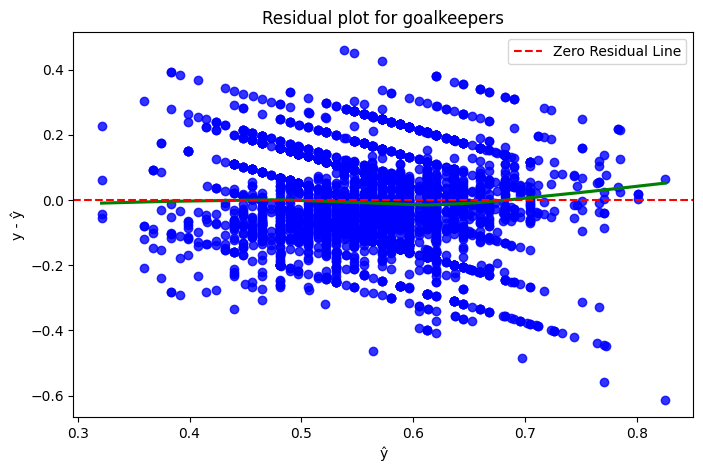

In [ ]:

plt.figure(figsize=(8, 5))
sns.regplot( x = y_pred_gk_mixed,y =(y_train_gk_mixed - y_pred_gk_mixed), lowess = True, scatter_kws={'color': 'blue'}, line_kws = {'color':'green'})  # Residual plot
plt.axhline(y=0, color='red', linestyle='--', label="Zero Residual Line")  # Zero line



# plt.fill_between(y_pred_gk_mixed, ci_lower - y_pred_gk_mixed, ci_upper - y_pred_gk_mixed, color='blue', alpha=0.2, label="95% CI")  # Confidence band
# plt.plot([min(y_pred_gk_mixed), max(y_pred_gk_mixed)], [min(y_pred_gk_mixed), max(y_pred_gk_mixed)], color='green', linestyle='-', label='y = y_pred')
plt.xlabel("ŷ")
plt.ylabel("y - ŷ")
plt.title("Residual plot for goalkeepers")
plt.legend()
plt.show()

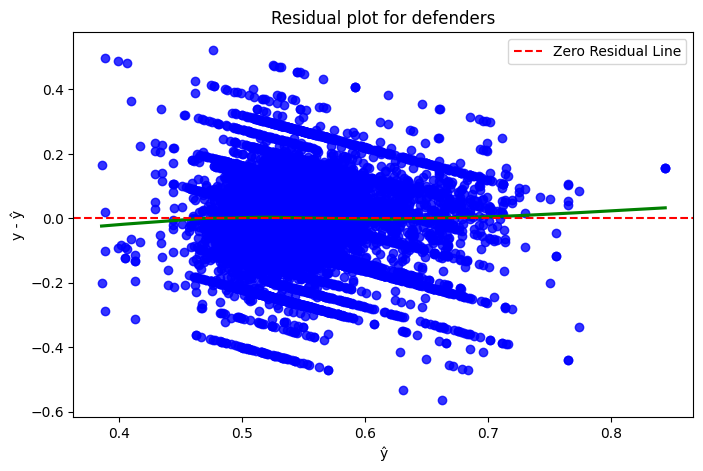

In [ ]:
y_pred_df_mixed = results_df_mixed.predict(X_df_mixed)

plt.figure(figsize=(8, 5))
sns.regplot( x = y_pred_df_mixed,y =(y_train_df_mixed - y_pred_df_mixed), lowess = True, scatter_kws={'color': 'blue'}, line_kws = {'color':'green'})  # Residual plot
plt.axhline(y=0, color='red', linestyle='--', label="Zero Residual Line")  # Zero line



# plt.fill_between(y_pred_gk_mixed, ci_lower - y_pred_gk_mixed, ci_upper - y_pred_gk_mixed, color='blue', alpha=0.2, label="95% CI")  # Confidence band
# plt.plot([min(y_pred_gk_mixed), max(y_pred_gk_mixed)], [min(y_pred_gk_mixed), max(y_pred_gk_mixed)], color='green', linestyle='-', label='y = y_pred')
plt.xlabel("ŷ")
plt.ylabel("y - ŷ")
plt.title("Residual plot for defenders")
plt.legend()
plt.show()

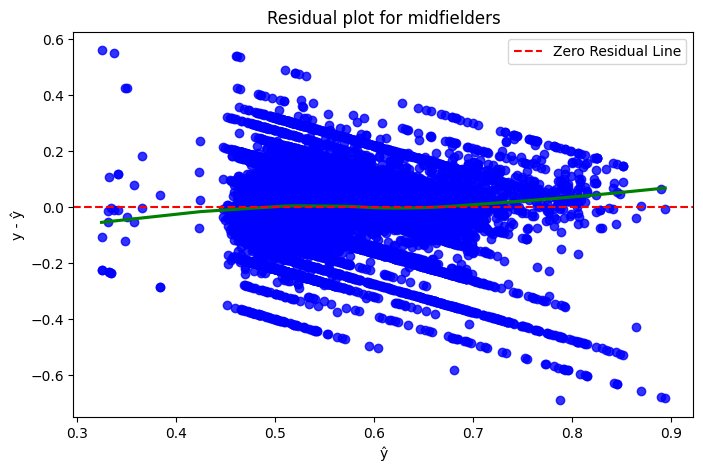

In [ ]:
y_pred_mf_mixed = results_mf_mixed.predict(X_mf_mixed)

plt.figure(figsize=(8, 5))
sns.regplot( x = y_pred_mf_mixed,y =(y_train_mf_mixed - y_pred_mf_mixed), lowess = True, scatter_kws={'color': 'blue'}, line_kws = {'color':'green'})  # Residual plot
plt.axhline(y=0, color='red', linestyle='--', label="Zero Residual Line")  # Zero line



# plt.fill_between(y_pred_gk_mixed, ci_lower - y_pred_gk_mixed, ci_upper - y_pred_gk_mixed, color='blue', alpha=0.2, label="95% CI")  # Confidence band
# plt.plot([min(y_pred_gk_mixed), max(y_pred_gk_mixed)], [min(y_pred_gk_mixed), max(y_pred_gk_mixed)], color='green', linestyle='-', label='y = y_pred')
plt.xlabel("ŷ")
plt.ylabel("y - ŷ")
plt.title("Residual plot for midfielders")
plt.legend()
plt.show()

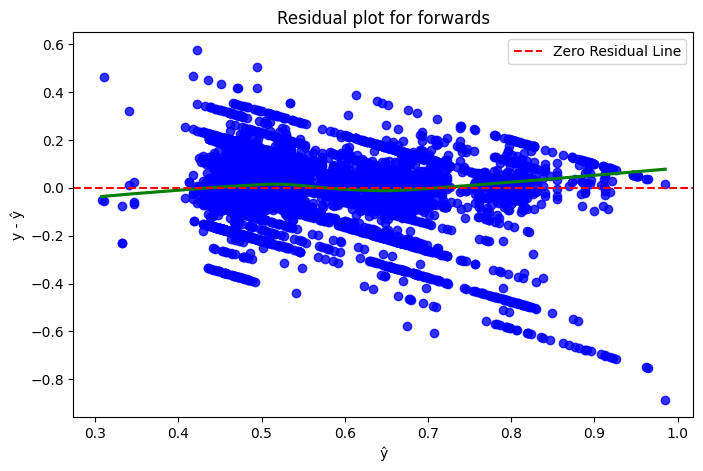

In [ ]:
y_pred_fw_mixed = results_fw_mixed.predict(X_fw_mixed)

plt.figure(figsize=(8, 5))
sns.regplot( x = y_pred_fw_mixed,y =(y_train_fw_mixed - y_pred_fw_mixed), lowess = True, scatter_kws={'color': 'blue'}, line_kws = {'color':'green'})  # Residual plot
plt.axhline(y=0, color='red', linestyle='--', label="Zero Residual Line")  # Zero line



# plt.fill_between(y_pred_gk_mixed, ci_lower - y_pred_gk_mixed, ci_upper - y_pred_gk_mixed, color='blue', alpha=0.2, label="95% CI")  # Confidence band
# plt.plot([min(y_pred_gk_mixed), max(y_pred_gk_mixed)], [min(y_pred_gk_mixed), max(y_pred_gk_mixed)], color='green', linestyle='-', label='y = y_pred')
plt.xlabel("ŷ")
plt.ylabel("y - ŷ")
plt.title("Residual plot for forwards")
plt.legend()
plt.show()

In [ ]:
(y_train_gk_mixed/10).describe()

,original_rating
count,4015.000000
mean,0.065279
std,0.011044
min,0.009999
25%,0.059986
50%,0.063985
75%,0.071283
max,0.099976


In [ ]:
y_pred_gk_mixed.describe()

,0
count,4015.000000
mean,0.065269
std,0.006836
min,0.042015
25%,0.061357
50%,0.065180
75%,0.069153
max,0.093364


In [ ]:
# @title Generalised Linear mixed effects model (GLMM)


In [21]:
!pip install bambi
!pip install h5pyd
import bambi as bmb
import arviz as az

In [ ]:
selected_variables

['original_rating',
 'saves',
 'total_dribbles',
 'total_tballs',
 'total_shots',
 'total_passes',
 'goals_conceded',
 'goals',
 'assists',
 'dangmistakes',
 'chances2score',
 'shotsblocked',
 'stop_shots',
 'keypasses',
 'tackles',
 'interceptions',
 'wasfouled',
 'rcards',
 'saved_pen',
 'clearances',
 'pos',
 'owngoals',
 'touches',
 'countattack',
 'total_grduels',
 'total_crosses',
 'total_aerials']

In [ ]:
!nvidia-smi

Thu Mar 20 01:17:10 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   76C    P0             31W /   70W |    2168MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import jax
print("JAX is using:", jax.devices())
# !pip install -U bambi pymc jax jaxlib

JAX is using: [CudaDevice(id=0)]


In [ ]:
jax.config.update("jax_platform_name", "gpu")

In [ ]:
import tensorflow as tf

# Check if TensorFlow is using the GPU
if tf.config.list_physical_devices('GPU'):
    print("TensorFlow is using the GPU.")
else:
    print("TensorFlow is not using the GPU.")

TensorFlow is using the GPU.


In [ ]:
import os
print(os.sched_getaffinity(0))

{0, 1}


In [19]:
df_glmm = df.copy()
df_glmm['original_rating'] = (df_glmm['original_rating']/10)* (((len(df_glmm) - 1) + 0.5) /len(df_glmm))
glmm_gk = df_glmm[df_glmm['pos'] == 'GK'][gk_attributes + ['original_rating','player']]
glmm_df = df_glmm[df_glmm['pos'] == 'DF'][defense_attributes + ['original_rating','player']]
glmm_mf = df_glmm[df_glmm['pos'] == 'MF'][midfield_attributes + ['original_rating','player']]
glmm_fw = df_glmm[df_glmm['pos'] == 'FW'][forward_attributes + ['original_rating', 'player']]


In [131]:
glmm_gk

,saves,goals_conceded,saved_pen,original_rating,player
46,5,2,0,0.639994,Ciprian Tatarusanu
47,5,2,0,0.423641,Ciprian Tatarusanu
48,5,2,0,0.511424,Ciprian Tatarusanu
67,1,1,0,0.537138,Hugo Lloris
68,1,1,0,0.438419,Hugo Lloris
...,...,...,...,...,...
50562,3,4,0,0.459995,Danijel Subasic
50612,1,2,0,0.549995,Hugo Lloris
50613,1,2,0,0.402952,Hugo Lloris
50614,1,2,0,0.549995,Hugo Lloris


In [22]:
glmm_gk_model = bmb.Model('original_rating ~ saves + goals_conceded+ saved_pen+ (1|player)', data=glmm_gk, family = "beta", link = "probit")
glmm_gk_model.build()

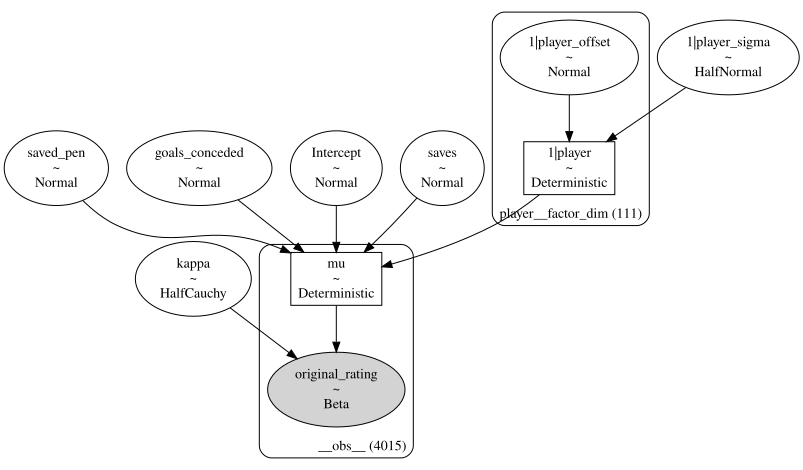

In [39]:
glmm_gk_model.graph()

In [42]:
glmm_gk_results = glmm_gk_model.fit(sampler = "blackjax_hmc", idata_kwargs={"log_likelihood": True})


Output()

In [68]:
glmm_gk_model.predict(idata = glmm_gk_results)


<Axes: xlabel='original_rating'>

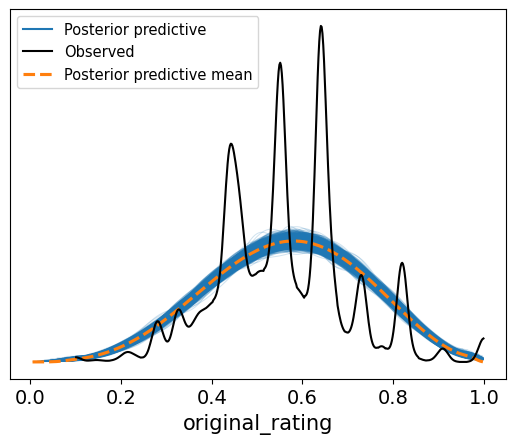

In [111]:
az.plot_ppc(glmm_gk_results, num_pp_samples=2000)


In [46]:
az.to_netcdf(glmm_gk_results, "glmm_gk_results.nc")

'glmm_gk_results.nc'

In [23]:
# glmm_gk_results = az.from_netcdf("https://raw.githubusercontent.com/pp7-ucc/Players_project/main/glmm_gk_model.nc")

import requests
import arviz as az

url = "https://raw.githubusercontent.com/pp7-ucc/Players_project/main/glmm_gk_model.nc"
filename = "glmm_gk_model.nc"

# Download the file using requests
response = requests.get(url)
with open(filename, "wb") as f:
    f.write(response.content)

# Load it with ArviZ
glmm_gk_results = az.from_netcdf(filename)

In [ ]:
print(az.summary(glmm_gk_results))

                                mean     sd  hdi_3%  hdi_97%  mcse_mean  \
1|player[Abdullah Al-Mayoof]  -0.014  0.107  -0.214    0.179      0.002   
1|player[Adrian]              -0.151  0.058  -0.258   -0.046      0.001   
1|player[Alex McCarthy]       -0.107  0.057  -0.213   -0.001      0.001   
1|player[Alexander Schwolow]   0.032  0.039  -0.039    0.104      0.001   
1|player[Alireza Beiranvand]  -0.030  0.089  -0.202    0.129      0.002   
...                              ...    ...     ...      ...        ...   
Intercept                      0.088  0.018   0.052    0.123      0.001   
goals_conceded                -0.105  0.005  -0.115   -0.096      0.000   
kappa                         10.699  0.240  10.265   11.159      0.004   
saved_pen                      0.322  0.038   0.250    0.392      0.001   
saves                          0.068  0.003   0.062    0.073      0.000   

                              mcse_sd  ess_bulk  ess_tail  r_hat  
1|player[Abdullah Al-Mayoof]    

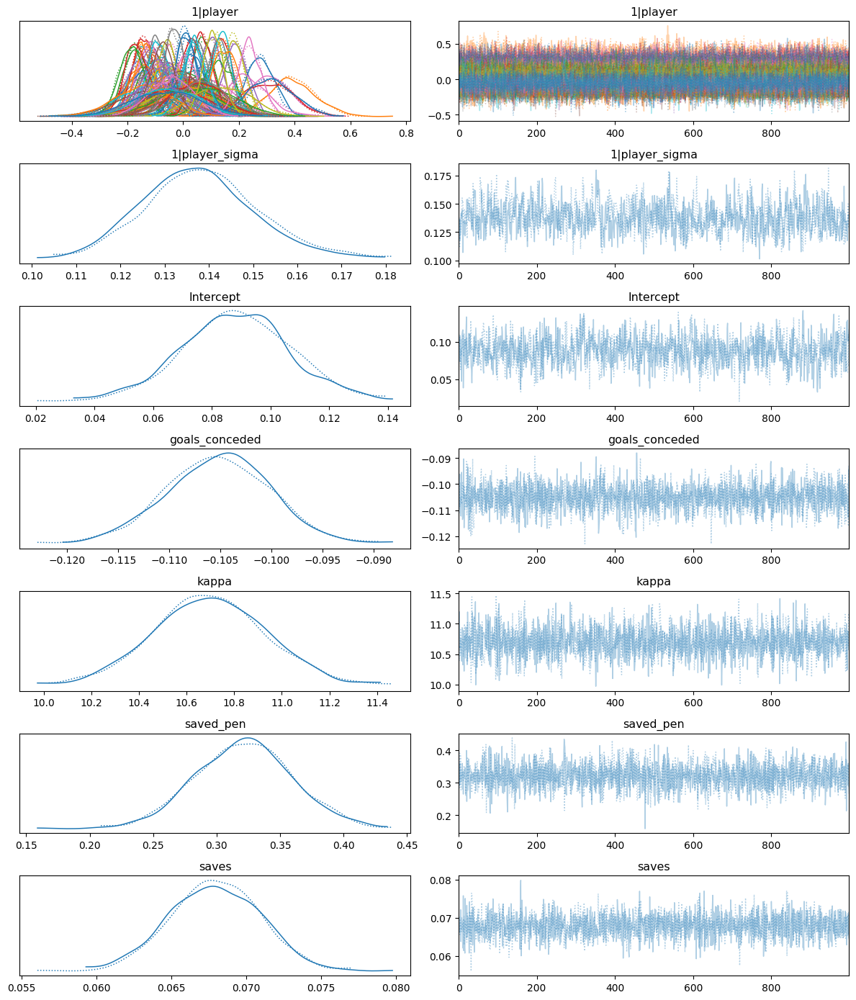

In [ ]:
plot_trace = az.plot_trace(glmm_gk_results, compact = True)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (117) in plot_posterior, generating only 40 plots
  warnings.warn(


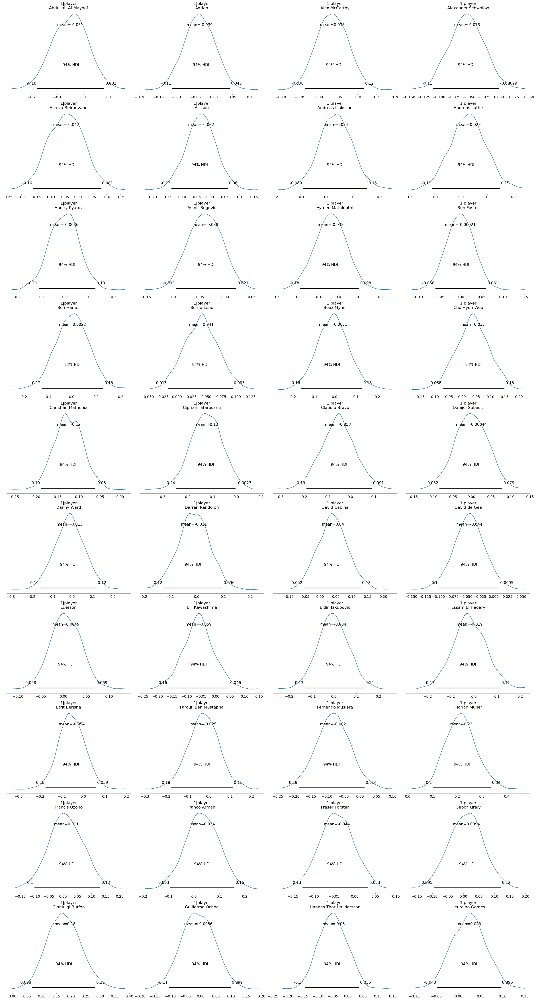

In [ ]:
az.plot_posterior(glmm_gk_results)
plt.tight_layout()
plt.show()

In [ ]:
defense_attributes
glmm_df

,total_dribbles,goals,assists,dangmistakes,chances2score,stop_shots,keypasses,tackles,rcards,clearances,owngoals,touches,countattack,total_grduels,total_aerials,original_rating,player
0,0,0,0,0,0,0,0,0,0,8,0,34,2,2,3,0.549995,Dragos Grigore
1,0,0,0,0,0,0,0,0,0,8,0,34,2,2,3,0.655994,Dragos Grigore
2,0,0,0,0,0,0,0,0,0,8,0,34,2,2,3,0.669993,Dragos Grigore
10,0,0,0,0,0,0,0,2,0,1,0,80,1,5,5,0.369996,Razvan Rat
11,0,0,0,0,0,0,0,2,0,1,0,80,1,5,5,0.637994,Razvan Rat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50629,1,0,0,0,0,0,0,3,0,0,0,37,0,9,2,0.539995,Ivan Strinic
50634,0,0,0,0,1,0,0,4,0,1,0,84,0,8,3,0.639994,Sime Vrsaljko
50635,0,0,0,0,1,0,0,4,0,1,0,84,0,8,3,0.599994,Sime Vrsaljko
50636,0,0,0,0,1,0,0,4,0,1,0,84,0,8,3,0.619994,Sime Vrsaljko


In [54]:
glmm_df_model = bmb.Model('original_rating ~ total_dribbles + goals + assists + dangmistakes + chances2score + stop_shots + keypasses + tackles + rcards + clearances + owngoals + touches + countattack + total_grduels + total_aerials + (1|player)', data=glmm_df, family = "beta", link = "probit")
glmm_df_model.build()

In [55]:
glmm_df_results = glmm_df_model.fit(sampler = "blackjax_hmc", backend = "jax", init ="jitter+adapt_diag")

Output()

ValueError: Not enough samples to build a trace.

In [ ]:
glmm_gk_model.predict(glmm_gk_results, kind = 'pps', inplace = True)

In [ ]:
import arviz as az
print(az.summary(glmm_df_results))

                               mean      sd  hdi_3%  hdi_97%  mcse_mean  \
1|player[Aaron Cresswell]    14.792   4.099  10.688   18.891      2.887   
1|player[Aaron Hughes]       -1.039   3.510  -4.548    2.472      2.472   
1|player[Aaron Wan-Bissaka] -12.960   3.648 -16.608   -9.308      2.569   
1|player[Abdou Diallo]      -11.157  10.015 -21.182   -1.145      7.053   
1|player[Abdullahi Shehu]     5.021   7.302  -2.280   12.321      5.142   
...                             ...     ...     ...      ...        ...   
tackles                       0.199   0.253  -0.054    0.452      0.178   
total_aerials                -0.764   0.036  -0.800   -0.728      0.025   
total_dribbles                0.226   0.554  -0.327    0.780      0.390   
total_grduels                 0.035   0.240  -0.205    0.275      0.169   
touches                       0.223   0.137   0.086    0.360      0.096   

                             mcse_sd  ess_bulk  ess_tail  r_hat  
1|player[Aaron Cresswell]      2.

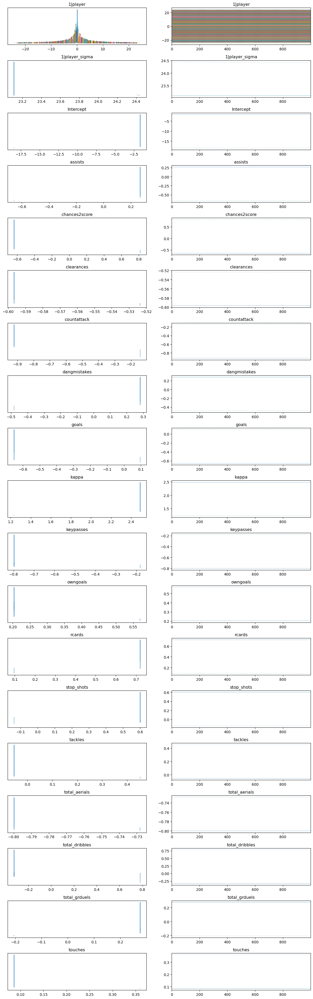

In [ ]:

az.plot_trace(glmm_df_results, compact = True)
plt.tight_layout()
plt.show()

In [ ]:
midfield_attributes

['total_dribbles',
 'goals',
 'assists',
 'dangmistakes',
 'chances2score',
 'stop_shots',
 'keypasses',
 'tackles',
 'rcards',
 'clearances',
 'touches',
 'countattack']

In [ ]:
glmm_mf_model = bmb.Model('original_rating ~ total_dribbles + goals + assists + dangmistakes + chances2score + stop_shots + keypasses + tackles + rcards + clearances + touches + countattack + (1|player)', data=glmm_mf, family = "beta", link = "probit")

In [ ]:
glmm_mf_results = glmm_mf_model.fit(sampler = "blackjax_hmc", sav)

NameError: name 'glmm_mf_model' is not defined

In [ ]:
az.plot_trace(glmm_mf_results, compact = True)
plt.tight_layout()
plt.show()

ValueError: Can only convert xarray dataarray, xarray dataset, dict, pytree (if 'dm-tree' is installed), netcdf filename, numpy array, pystan fit, emcee fit, pyro mcmc fit, numpyro mcmc fit, cmdstan fit csv filename, cmdstanpy fit to InferenceData, not MeanField

In [ ]:
forward_attributes

['total_dribbles',
 'goals',
 'assists',
 'dangmistakes',
 'keypasses',
 'tackles',
 'rcards',
 'touches',
 'countattack',
 'total_shots']

In [ ]:
glmm_fw_model = bmb.Model('original_rating ~ total_dribbles + goals + assists + dangmistakes + keypasses + tackles + rcards + touches + countattack + total_shots + (1|player)', data=glmm_fw, family = "beta", link = "probit")

In [ ]:
glmm_fw_results = glmm_fw_model.fit(sampler = "NUTS")

Output()

ValueError: Not enough samples to build a trace.

In [ ]:
# @title GLMM model diagnostics


In [70]:
glmm_gk_results

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

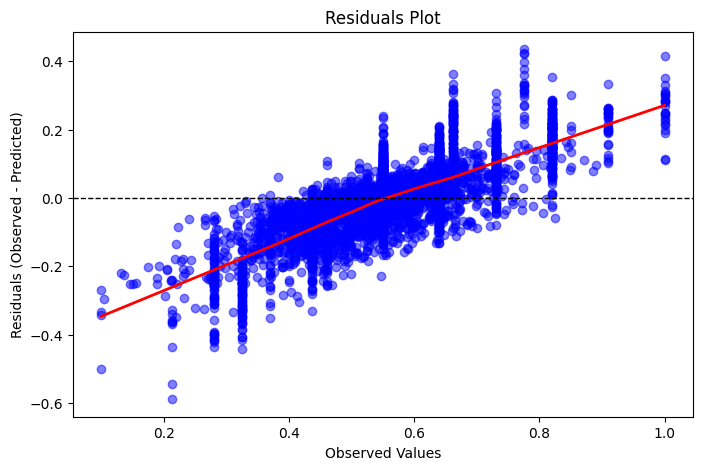

In [108]:
predicted_values_gk = glmm_gk_results.posterior_predictive['original_rating'].values.mean(axis=(0,1))


# observed_values_gk = glmm_gk['original_rating']
observed_values_gk = glmm_gk['original_rating']
# predicted_values_gk = posterior_predictive["original_rating"].mean(axis=0)

residuals_gk = observed_values_gk - predicted_values_gk

# Create residual plot
plt.figure(figsize=(8, 5))
sns.regplot(
    x=observed_values_gk,
    y=residuals_gk,
    lowess=True,
    scatter_kws={'color': 'blue', 'alpha': 0.5},  # Add transparency for better visibility
    line_kws={'color': 'red', 'linewidth': 2}  # Line showing trend in residuals
)

# Add labels and title
plt.axhline(0, color="black", linestyle="--", linewidth=1)  # Horizontal line at 0
plt.xlabel("Observed Values")
plt.ylabel("Residuals (Observed - Predicted)")
plt.title("Residuals Plot")

plt.show()

In [120]:
az.waic(glmm_gk_results, pointwise=True)


/usr/local/lib/python3.11/dist-packages/arviz/stats/stats.py:1655: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,0
elpd_waic,2116.917273
se,103.412512
p_waic,144.791964
n_samples,2000
n_data_points,4015
warning,True
waic_i,[<xarray.DataArray 'waic_i' ()> Size: 8B\narra...
scale,log


AttributeError: module 'arviz' has no attribute 'compute_log_likelihood'

In [129]:
glmm_gk_results.log_likelihood['original_rating'].values.max()

np.float64(4.714552066161405)

In [22]:
!pip install --upgrade arviz


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 16.3 MB/s eta 0:00:00
  Attempting uninstall: arviz
    Found existing installation: arviz 0.20.0
    Uninstalling arviz-0.20.0:
      Successfully uninstalled arviz-0.20.0


In [ ]:
gk_effects = glmm_gk_results.posterior["1|player"]
gk_alpha_mean = gk_effects.mean(dim=['chain', 'draw'])
gk_alpha_hat_mean = gk_alpha_mean.mean().item()


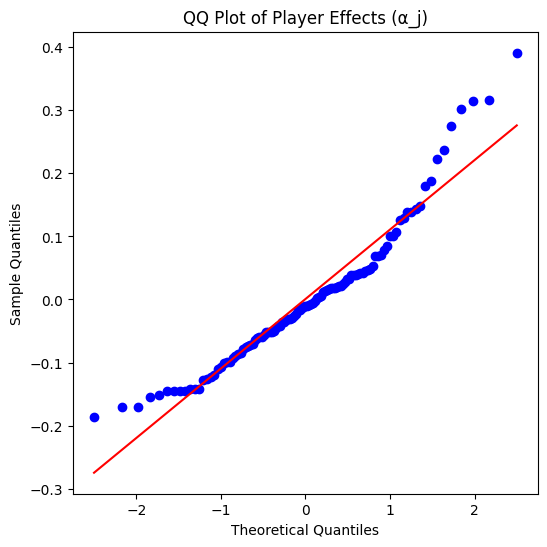

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))

stats.probplot(gk_alpha_mean.values, dist="norm", plot=ax)

ax.get_lines()[1].set_color('red')  # Make the reference line red
ax.set_title("QQ Plot of Player Effects (α_j)")
ax.set_xlabel("Theoretical Quantiles")
ax.set_ylabel("Sample Quantiles")

plt.show()

In [ ]:
observed_values_gk

,original_rating
46,0.639994
47,0.609994
48,0.619994
67,0.639994
68,0.619994
...,...
50562,0.579994
50612,0.599994
50613,0.595994
50614,0.549995


In [ ]:
mixed_df.columns

Index(['original_rating', 'saves', 'total_dribbles', 'total_tballs',
       'total_shots', 'total_passes', 'goals_conceded', 'goals', 'assists',
       'dangmistakes', 'chances2score', 'shotsblocked', 'stop_shots',
       'keypasses', 'tackles', 'interceptions', 'wasfouled', 'rcards',
       'saved_pen', 'clearances', 'pos', 'owngoals', 'touches', 'countattack',
       'total_grduels', 'total_crosses', 'total_aerials'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split

X_bn = mixed_df.drop('original_rating', axis=1)
y_bn = mixed_df['original_rating']


X_train_bn, X_test_bn, y_train_bn, y_test_bn = train_test_split(X_bn, y_bn, test_size=0.2, random_state=42)

In [ ]:
df_train_bn = pd.concat([X_train_bn, y_train_bn], axis=1)
df_train_bn

df_test_bn = pd.concat([X_test_bn,y_test_bn], axis=1)
df_test_bn

,saves,total_dribbles,total_tballs,total_shots,total_passes,goals_conceded,goals,assists,dangmistakes,chances2score,...,saved_pen,clearances,pos,owngoals,touches,countattack,total_grduels,total_crosses,total_aerials,original_rating
35686,0,0,0,0,45,0,0,0,0,0,...,0,0,DF,0,62,4,4,4,2,8.20
7180,0,1,1,0,54,0,0,0,0,0,...,0,2,DF,0,73,1,10,0,6,5.50
11594,1,0,0,0,26,0,0,0,1,0,...,0,0,GK,0,30,0,0,0,0,6.00
17703,0,0,0,0,37,0,0,0,0,0,...,0,0,MF,0,46,0,8,0,0,6.25
25328,0,0,0,0,46,0,0,0,0,0,...,0,0,DF,0,58,0,1,0,11,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34822,0,1,0,0,30,0,0,0,0,0,...,0,4,MF,0,41,0,13,0,2,6.40
11807,0,2,3,3,62,0,0,0,1,1,...,0,0,DF,0,91,2,11,4,4,6.00
7062,0,0,0,0,23,0,0,0,0,0,...,0,0,MF,0,32,0,7,0,3,4.60
29291,3,0,0,0,17,0,0,0,0,0,...,0,1,GK,0,25,0,0,0,0,7.00


[bnlearn] >Computing best DAG using [hc]
[bnlearn] >Set scoring type at [bic]
[bnlearn] >Compute structure scores for model comparison (higher is better).
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


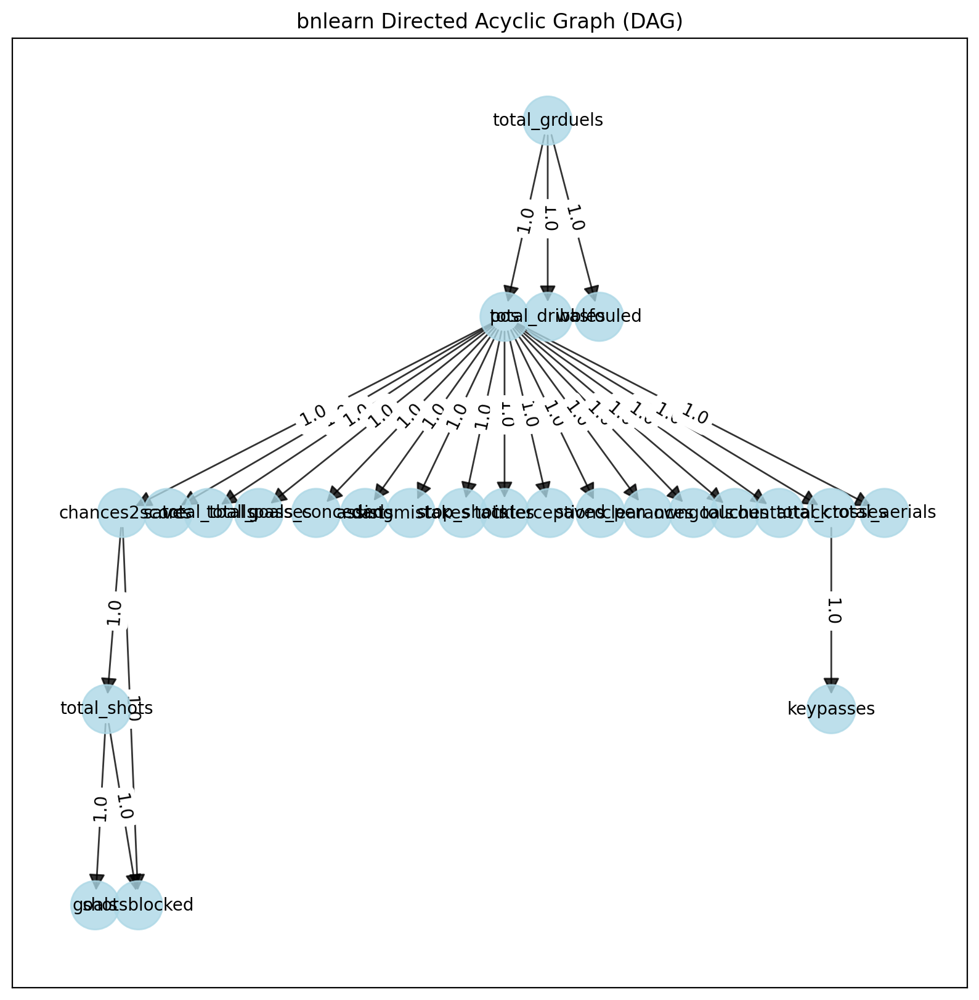

{'fig': <Figure size 2000x2000 with 1 Axes>,
 'ax': <Figure size 2000x2000 with 1 Axes>,
 'pos': {'total_shots': (56.247, 90.0),
  'goals': (29.247, 18.0),
  'shotsblocked': (133.25, 18.0),
  'chances2score': (94.247, 162.0),
  'pos': (1015.2, 234.0),
  'saves': (204.25, 162.0),
  'total_tballs': (302.25, 162.0),
  'total_passes': (423.25, 162.0),
  'goals_conceded': (561.25, 162.0),
  'assists': (679.25, 162.0),
  'dangmistakes': (789.25, 162.0),
  'stop_shots': (914.25, 162.0),
  'tackles': (1015.2, 162.0),
  'interceptions': (1124.2, 162.0),
  'saved_pen': (1246.2, 162.0),
  'clearances': (1360.2, 162.0),
  'owngoals': (1470.2, 162.0),
  'touches': (1570.2, 162.0),
  'countattack': (1677.2, 162.0),
  'total_crosses': (1802.2, 162.0),
  'total_aerials': (1930.2, 162.0),
  'total_grduels': (1119.2, 306.0),
  'total_dribbles': (1119.2, 234.0),
  'wasfouled': (1243.2, 234.0),
  'keypasses': (1802.2, 90.0)},
 'G': <networkx.classes.digraph.DiGraph at 0x7f1b05de0f50>,
 'node_properties': 

In [ ]:
# !pip install bnlearn
import bnlearn
import numpy as np
import pandas as pd

# Learn Hybrid Bayesian Network Structure
model = bnlearn.structure_learning.fit(df_train_bn, methodtype='hc', scoretype='bic')

# Visualize the learned network
bnlearn.plot(model)


In [ ]:
model = bnlearn.parameter_learning.fit(model, df_train_bn)

[bnlearn] >Parameter learning> Computing parameters using [bayes]
[bnlearn] >Converting [<class 'pgmpy.base.DAG.DAG'>] to BayesianNetwork model.
[bnlearn] >Converting adjmat to BayesianNetwork.
[bnlearn] >CPD of total_shots:
+-----------------+------------------------+-----+---------------------+---------------------+
| chances2score   | chances2score(0)       | ... | chances2score(7)    | chances2score(8)    |
+-----------------+------------------------+-----+---------------------+---------------------+
| total_shots(0)  | 0.8042108132843914     | ... | 0.0862515094014145  | 0.08340283569641366 |
+-----------------+------------------------+-----+---------------------+---------------------+
| total_shots(1)  | 0.1570050726824851     | ... | 0.0862515094014145  | 0.08340283569641366 |
+-----------------+------------------------+-----+---------------------+---------------------+
| total_shots(2)  | 0.027108960440865755   | ... | 0.0862515094014145  | 0.08340283569641366 |
+--------------

In [ ]:
bnlearn.predict(model, df_test_bn, variables=['original_rating'])

[bnlearn]> Remaining columns for inference: 26


  0%|          | 0/8568 [00:00<?, ?it/s]


ValueError: Node rcards not in not in graph

In [ ]:
print(model['model'].nodes)


['total_shots', 'goals', 'shotsblocked', 'chances2score', 'pos', 'saves', 'total_tballs', 'total_passes', 'goals_conceded', 'assists', 'dangmistakes', 'stop_shots', 'tackles', 'interceptions', 'saved_pen', 'clearances', 'owngoals', 'touches', 'countattack', 'total_crosses', 'total_aerials', 'total_grduels', 'total_dribbles', 'wasfouled', 'keypasses']


In [ ]:
forward_edges = [(col,'original_rating' ) for col in ['goals','total_passes','total_dribbles','total_tballs','keypasses','assists','chances2score','wasfouled','total_crosses','touches','countattack']]
mid_edges = [(col,'original_rating') for col in ['total_passes', 'assists','total_tballs','total_crosses','keypasses','touches','countattack']]
df_edges = [(col,'original_rating') for col in ['dangmistakes', 'interceptions','clearances','shotsblocked','stop_shots','tackles','owngoals','total_aerials','total_grduels']]
gk_edges = [(col,'original_rating') for col in ['saves', 'goals_conceded','saved_pen']]
# edges = [(feature,'original_rating') for feature in X_train_bn.columns]
# removed_edges = [(features,'original_rating') for features in ['rcards','pos_FW','pos_GK','pos_DF','pos_MF','pos_Sub']]

[bnlearn] >bayes DAG created.
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.
[bnlearn] >Plot based on Bayesian model


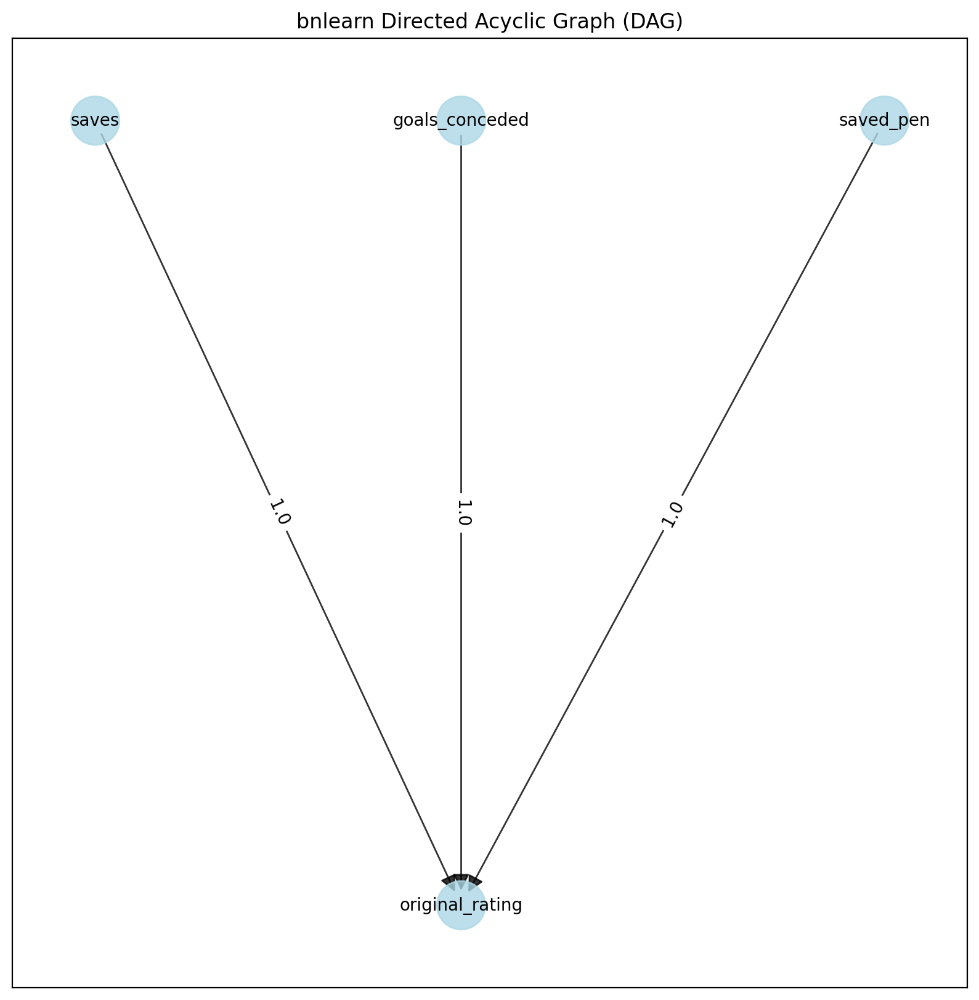

{'fig': <Figure size 2000x2000 with 1 Axes>,
 'ax': <Figure size 2000x2000 with 1 Axes>,
 'pos': {'saves': (29.897, 90.0),
  'original_rating': (144.9, 18.0),
  'goals_conceded': (144.9, 90.0),
  'saved_pen': (277.9, 90.0)},
 'G': <networkx.classes.digraph.DiGraph at 0x7890cf0c7450>,
 'node_properties': {'saves': {'node_color': '#ADD8E6', 'node_size': 800},
  'original_rating': {'node_color': '#ADD8E6', 'node_size': 800},
  'goals_conceded': {'node_color': '#ADD8E6', 'node_size': 800},
  'saved_pen': {'node_color': '#ADD8E6', 'node_size': 800}},
 'edge_properties': {('saves', 'original_rating'): {'color': '#000000',
   'weight': 1.0,
   'pvalue': 1,
   'value': 1.0},
  ('goals_conceded', 'original_rating'): {'color': '#000000',
   'weight': 1.0,
   'pvalue': 1,
   'value': 1.0},
  ('saved_pen', 'original_rating'): {'color': '#000000',
   'weight': 1.0,
   'pvalue': 1,
   'value': 1.0}}}

In [ ]:
# !pip install bnlearn
import bnlearn

bn_model_gk = bnlearn.make_DAG(gk_edges)


bnlearn.plot(bn_model_gk)


In [ ]:
gk_attributes = ['saves', 'goals_conceded','saved_pen']

X_train_bn_gk = df_train_bn[df_train_bn['pos'] == 'GK'].drop(['original_rating','pos'],axis = 1)[gk_attributes]
y_train_bn_gk = df_train_bn[df_train_bn['pos'] == 'GK']['original_rating']

X_test_bn_gk = df_test_bn[df_test_bn['pos'] == 'GK'].drop(['original_rating','pos'],axis = 1)[gk_attributes]
y_test_bn_gk = df_test_bn[df_test_bn['pos'] == 'GK']['original_rating']

# X_train_bn_gk = X_train_bn[X_train_bn['pos'] = 'GK']
# y_train_bn_gk = y_train_bn[X_train_bn['pos'] = 'GK']

In [ ]:
df_train_bn_gk = pd.concat([X_train_bn_gk, y_train_bn_gk], axis=1)

df_test_bn_gk = pd.concat([X_test_bn_gk,y_test_bn_gk], axis=1)

In [ ]:
df_train_bn_gk

,saves,goals_conceded,saved_pen,original_rating
32999,1,4,0,5.49
36371,1,2,0,5.50
17503,3,0,0,7.10
36983,3,2,0,6.00
28642,5,1,0,6.40
...,...,...,...,...
19118,3,4,0,6.00
2433,8,1,0,8.36
44131,7,1,0,7.50
37194,5,0,0,7.61


In [ ]:
bn_model_gk = bnlearn.parameter_learning.fit(bn_model_gk, df_train_bn_gk)

[bnlearn] >Parameter learning> Computing parameters using [bayes]
[bnlearn] >CPD of saves:
+-----------+-----------+
| saves(0)  | 0.0684941 |
+-----------+-----------+
| saves(1)  | 0.143536  |
+-----------+-----------+
| saves(2)  | 0.169183  |
+-----------+-----------+
| saves(3)  | 0.17037   |
+-----------+-----------+
| saves(4)  | 0.127387  |
+-----------+-----------+
| saves(5)  | 0.0917665 |
+-----------+-----------+
| saves(6)  | 0.0627947 |
+-----------+-----------+
| saves(7)  | 0.0454592 |
+-----------+-----------+
| saves(8)  | 0.0259864 |
+-----------+-----------+
| saves(9)  | 0.0217118 |
+-----------+-----------+
| saves(10) | 0.0207619 |
+-----------+-----------+
| saves(11) | 0.0176748 |
+-----------+-----------+
| saves(12) | 0.0174373 |
+-----------+-----------+
| saves(15) | 0.0174373 |
+-----------+-----------+
[bnlearn] >CPD of original_rating:
+-----------------------+-----+----------------------+
| goals_conceded        | ... | goals_conceded(7)    |
+---------

In [ ]:
predicted = bnlearn.predict(bn_model_gk, df_test_bn_gk, variables=['original_rating'])

[bnlearn]> Remaining columns for inference: 3


100%|██████████| 69/69 [00:00<00:00, 485.13it/s]


In [ ]:
from sklearn.metrics import mean_squared_error

# Compute RMSE
rmse = mean_squared_error(df_test_bn_gk['original_rating'], predicted['original_rating'])
print(f"RMSE for original_rating: {rmse:.2f}")


RMSE for original_rating: 1.40


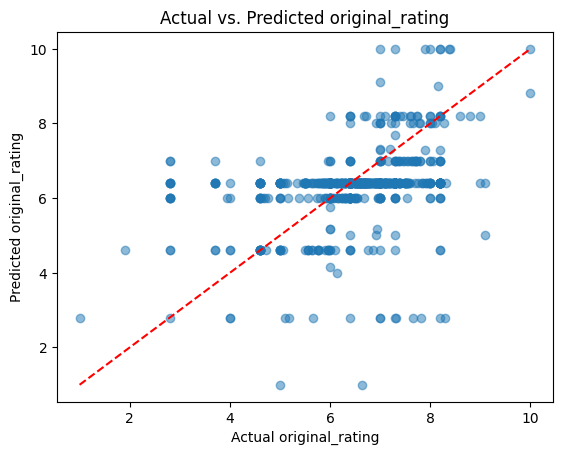

In [ ]:
plt.scatter(df_test_bn_gk['original_rating'], predicted['original_rating'], alpha=0.5)
plt.plot([min(df_test_bn_gk['original_rating']), max(df_test_bn_gk['original_rating'])],
         [min(df_test_bn_gk['original_rating']), max(df_test_bn_gk['original_rating'])], 'r--')  # Identity line
plt.xlabel("Actual original_rating")
plt.ylabel("Predicted original_rating")
plt.title("Actual vs. Predicted original_rating")
plt.show()

<Axes: xlabel='original_rating', ylabel='Count'>

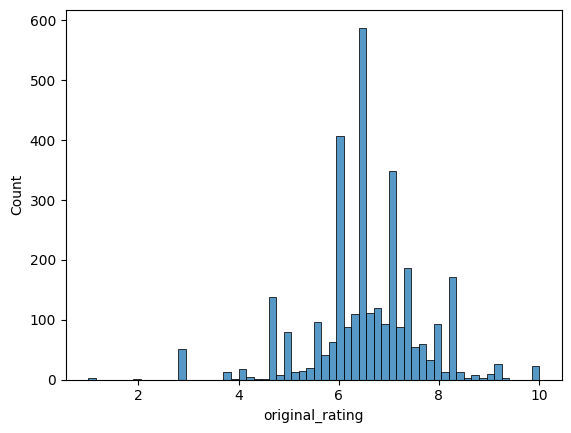

In [ ]:
sns.histplot(df_train_bn_gk['original_rating'])

,saves,goals_conceded,saved_pen,original_rating
count,3211.000000,3211.000000,3211.000000,3211.000000
mean,3.088446,1.327001,0.029897,6.535709
std,2.026221,1.221899,0.170330,1.101632
min,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,6.000000
50%,3.000000,1.000000,0.000000,6.400000
75%,4.000000,2.000000,0.000000,7.120000
max,15.000000,7.000000,1.000000,10.000000


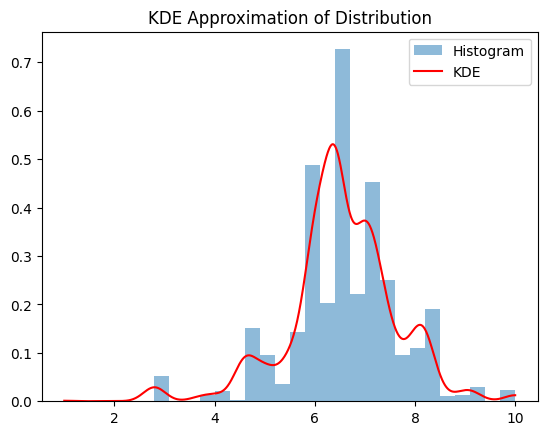

In [ ]:
from scipy.stats import gaussian_kde

gk_kde = gaussian_kde(df_train_bn_gk['original_rating'])
x_range = np.linspace(min(df_train_bn_gk['original_rating']), max(df_train_bn_gk['original_rating']), 1000)
pdf_values = gk_kde(x_range)

plt.hist(df_train_bn_gk['original_rating'], bins=30, density=True, alpha=0.5, label="Histogram")
plt.plot(x_range, pdf_values, label="KDE", color='red')
plt.legend()
plt.title("KDE Approximation of Distribution")
plt.show()

In [ ]:
df_test_bn_gk['original_rating'].describe()/10

,original_rating
count,80.400000
mean,0.650427
std,0.111707
min,0.100000
25%,0.600000
50%,0.650000
75%,0.716500
max,1.000000


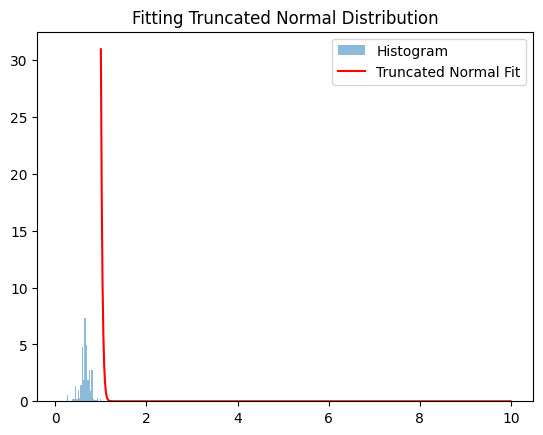

In [ ]:
from scipy.stats import truncnorm

# Estimate mean and std from data
mu, sigma = np.mean(y_train_gk_mixed), np.std(y_train_gk_mixed)

# Define bounds
a, b = (1 - mu) / sigma, (10 - mu) / sigma  # Convert to standard normal space

# Fit Truncated Normal
trunc_dist = truncnorm(a, b, loc=mu, scale=sigma)

# Plot histogram and fitted PDF
x = np.linspace(1, 10, 1000)
pdf_fitted = trunc_dist.pdf(x)

plt.hist(y_train_gk_mixed, bins=30, density=True, alpha=0.5, label="Histogram")
plt.plot(x, pdf_fitted, label="Truncated Normal Fit", color='red')
plt.legend()
plt.title("Fitting Truncated Normal Distribution")
plt.show()



In [ ]:
ks_stat, p_value = stats.kstest(y_train_gk_mixed, 'beta', args=(alpha, beta, loc, scale))
print(f"KS Test Statistic: {ks_stat:.4f}, p-value: {p_value:.4f}")

KS Test Statistic: 0.1356, p-value: 0.0000


In [ ]:
#!pip install bamt

import bamt.networks as networks

bn = networks.HybridBN(has_logit=True, use_mixture=True)

import bamt.preprocessors as pp
import pandas as pd
from sklearn import preprocessing

encoder = preprocessing.LabelEncoder()
discretizer = preprocessing.KBinsDiscretizer(n_bins=10, encode='ordinal', strategy='quantile')

p = pp.Preprocessor([('encoder', encoder), ('discretizer', discretizer)])
discretized_data, est = p.apply(df_train)

info = p.info

In [ ]:
discretized_data

,saves,total_dribbles,total_tballs,total_shots,total_passes,goals_conceded,goals,assists,dangmistakes,chances2score,...,countattack,total_grduels,total_crosses,total_aerials,pos_DF,pos_FW,pos_GK,pos_MF,pos_Sub,original_rating
22677,0,1,2,0,26,0,0,0,0,0,...,1,13,0,0,0,0,0,1,0,6
49411,0,0,0,1,77,0,0,0,0,0,...,0,7,0,12,0,0,0,1,0,6
44334,0,1,0,0,25,0,0,0,0,0,...,0,2,0,3,1,0,0,0,0,6
40145,0,0,0,0,15,0,0,0,0,0,...,5,10,3,4,0,1,0,0,0,2
3060,0,0,0,0,52,0,0,0,0,0,...,0,13,12,7,1,0,0,0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46286,0,1,1,4,20,0,1,0,0,2,...,0,12,1,4,0,1,0,0,0,8
10995,0,0,0,0,5,0,0,0,0,0,...,0,1,0,2,0,0,0,0,1,1
1486,0,0,1,0,66,0,0,1,1,0,...,1,2,3,0,1,0,0,0,0,7
33769,0,0,0,0,10,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
forward_edges = [(col,'pos_FW' ) for col in ['goals','total_passes','total_dribbles','total_tballs','keypasses','assists','chances2score','wasfouled','total_crosses','touches','countattack']]
mid_edges = [(col,'pos_MF') for col in ['total_passes', 'assists','total_tballs','total_crosses','keypasses','touches','countattack']]
df_edges = [(col,'pos_DF') for col in ['dangmistakes', 'interceptions','clearances','shotsblocked','stop_shots','tackles','owngoals','total_aerials','total_grduels']]
gk_edges = [(col,'pos_GK') for col in ['saves', 'goals_conceded','saved_pen']]
edges = [(feature,'original_rating') for feature in X_train.columns]
removed_edges = [(features,'original_rating') for features in ['rcards','pos_FW','pos_GK','pos_DF','pos_MF','pos_Sub']]

In [ ]:
all_possible_edges

[('original_rating', 'saves'),
 ('original_rating', 'total_dribbles'),
 ('original_rating', 'total_tballs'),
 ('original_rating', 'total_shots'),
 ('original_rating', 'total_passes'),
 ('original_rating', 'goals_conceded'),
 ('original_rating', 'goals'),
 ('original_rating', 'assists'),
 ('original_rating', 'dangmistakes'),
 ('original_rating', 'chances2score'),
 ('original_rating', 'shotsblocked'),
 ('original_rating', 'stop_shots'),
 ('original_rating', 'keypasses'),
 ('original_rating', 'tackles'),
 ('original_rating', 'interceptions'),
 ('original_rating', 'wasfouled'),
 ('original_rating', 'rcards'),
 ('original_rating', 'saved_pen'),
 ('original_rating', 'clearances'),
 ('original_rating', 'owngoals'),
 ('original_rating', 'touches'),
 ('original_rating', 'countattack'),
 ('original_rating', 'total_grduels'),
 ('original_rating', 'total_crosses'),
 ('original_rating', 'total_aerials'),
 ('original_rating', 'pos_DF'),
 ('original_rating', 'pos_FW'),
 ('original_rating', 'pos_GK'),

In [ ]:
len(cleaned_df.columns)

31

In [ ]:
len(df_test.columns)

31

In [ ]:
from pgmpy.estimators import K2Score

bn.add_nodes(info) # add nodes from info obtained from preprocessing




params = {
            # Defines initial nodes of the network, list of node names
           'init_nodes':list(cleaned_df.columns),
            # Defines initial edges of the network, list of tuples (node1, node2)
           'init_edges':edges + forward_edges + mid_edges + gk_edges + df_edges,
           # Strictly set edges where algoritm must learn, list of tuples (node1, node2)
           'white_list':edges + forward_edges + mid_edges + gk_edges + df_edges,
           # blacklist edges, list of tuples (node1, node2)
           'bl_add':[],
           # Allow algorithm to remove edges defined by user, bool
           'remove_init_edges':True
          }

# Structure learning using K2Score and parameters defined above
bn.add_edges(discretized_data, scoring_function=('K2', K2Score), params=params)

bn.plot('foo.html') # add nodes from info obtained from preprocessing

In [ ]:
bn.fit_parameters(df_train)

In [ ]:
bn
bn.get_info()

NameError: name 'bn' is not defined

In [ ]:
import bamt
bamt.redef_info_scores.log_likelihood(bn, df_test, method='LL')
# bamt.redef_info_scores.log_lik_local(data, method='LL')
# bamt.redef_info_scores.info_score(bn.edges, df_test, method='LL')

TypeError: 'list' object is not callable

In [ ]:
predictions = bn.predict(test=X_test, parall_count=4)

100%|██████████| 1494/1494 [00:04<00:00, 364.55it/s]


In [ ]:
predictions

{'original_rating': [nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
 

In [ ]:
from sklearn.linear_model import LinearRegression

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# The estimated mean for a given set of parent variables
predicted_mean = linear_model.predict(X_train)

print("Predicted Means:", predicted_mean)

coefficients = linear_model.coef_

intercept = linear_model.intercept_

# Make predictions on the test set
y_pred = linear_model.predict(X_train)

residuals = y_train - y_pred

# Compute the residual variance (sample variance)
residual_variance = np.var(residuals, ddof=1)

std_dev = np.sqrt(residual_variance)

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_train, y_pred)
print(f'Mean Squared Error (MSE): {mse}')

from sklearn.metrics import r2_score

# Calculate R-squared (Goodness of Fit)
r2 = r2_score(y_train, y_pred)
print(f"R-squared: {r2}")

predicted_mean = intercept + np.dot(X_train, coefficients)

std_dev = np.std(y_train)

Predicted Means: [7.01102201 7.24585567 6.69673265 ... 7.21796061 6.02471454 6.58239573]
Mean Squared Error (MSE): 0.1755026503545319
R-squared: 0.6509234530740804


In [ ]:
#!pip install pgmpy
from pgmpy.inference import VariableElimination
from pgmpy.models import BayesianNetwork
from pgmpy.models import LinearGaussianBayesianNetwork
from pgmpy.factors.continuous import LinearGaussianCPD



# Define a Bayesian Network
model = LinearGaussianBayesianNetwork(edges +  forward_edges + mid_edges + gk_edges + df_edges)

model.fit(df_train, method='mle')

# cpd_target_variable = (variable='original_rating',
#                                          beta=coefficients,
#                                          evidence_mean=predicted_mean,
#                                          evidence_variance=residual_variance,
#                                          evidence=list(cleaned_df.drop(columns='original_rating').columns))

model.cpds


[<LinearGaussianCPD: P(saves) = N(0.237; 1.002) at 0x7e19f57d5090,
 <LinearGaussianCPD: P(original_rating | saves, total_dribbles, total_tballs, total_shots, total_passes, goals_conceded, goals, assists, dangmistakes, chances2score, shotsblocked, stop_shots, keypasses, tackles, interceptions, wasfouled, rcards, saved_pen, clearances, owngoals, touches, countattack, total_grduels, total_crosses, total_aerials, pos_DF, pos_FW, pos_GK, pos_MF, pos_Sub) = N(0.197*saves + 0.039*total_dribbles + 0.004*total_tballs + 0.039*total_shots + -0.01*total_passes + -0.433*goals_conceded + 0.938*goals + 0.69*assists + -0.155*dangmistakes + 0.02*chances2score + -0.039*shotsblocked + 0.081*stop_shots + 0.161*keypasses + 0.063*tackles + 0.018*interceptions + 0.022*wasfouled + -1.005*rcards + 0.798*saved_pen + 0.046*clearances + -0.593*owngoals + 0.017*touches + 0.023*countattack + -0.005*total_grduels + -0.026*total_crosses + 0.018*total_aerials + -0.131*pos_DF + -0.087*pos_FW + 0.315*pos_GK + -0.071*pos

In [ ]:
from pgmpy.metrics import correlation_score
correlation_score(model,df_test, test="pearsonr", significance_level=0.05)

0.37924151696606784

In [ ]:
df_test.columns

Index(['saves', 'total_dribbles', 'total_tballs', 'total_shots',
       'total_passes', 'goals_conceded', 'goals', 'assists', 'dangmistakes',
       'chances2score', 'shotsblocked', 'stop_shots', 'keypasses', 'tackles',
       'interceptions', 'wasfouled', 'rcards', 'saved_pen', 'clearances',
       'owngoals', 'touches', 'countattack', 'total_grduels', 'total_crosses',
       'total_aerials', 'pos_DF', 'pos_FW', 'pos_GK', 'pos_MF', 'pos_Sub',
       'original_rating'],
      dtype='object')

In [ ]:
samples = model.simulate(n=1000)

# You can then compare the predictions (e.g., the values of Z) to actual observed values
print(samples[['original_rating']])




     original_rating
0           6.574105
1           6.861133
2           7.542565
3           7.357419
4           5.601851
..               ...
995         7.352967
996         6.251774
997         6.164561
998         5.415559
999         6.851465

[1000 rows x 1 columns]


AttributeError: 'LinearGaussianCPD' object has no attribute 'scope'

In [ ]:
# !pip install pygraphviz
model_graphviz = model.to_graphviz()

# Plot the model.
model_graphviz.draw("model.png", prog="dot")

# Other file formats can also be specified.
model_graphviz.draw("sachs.pdf", prog="dot")
model_graphviz.draw("sachs.svg", prog="dot")

ImportError: requires pygraphviz http://pygraphviz.github.io/

In [ ]:
print(model.edges())
print(model.nodes())

[('saves', 'original_rating'), ('total_dribbles', 'original_rating'), ('total_tballs', 'original_rating'), ('total_shots', 'original_rating'), ('total_passes', 'original_rating'), ('crosses_acc', 'original_rating'), ('goals_conceded', 'original_rating'), ('goals', 'original_rating'), ('assists', 'original_rating'), ('dangmistakes', 'original_rating'), ('chances2score', 'original_rating'), ('shotsblocked', 'original_rating'), ('stop_shots', 'original_rating'), ('keypasses', 'original_rating'), ('tackles', 'original_rating'), ('interceptions', 'original_rating'), ('wasfouled', 'original_rating'), ('rcards', 'original_rating'), ('saved_pen', 'original_rating'), ('clearances', 'original_rating'), ('pos_DF', 'original_rating'), ('pos_FW', 'original_rating'), ('pos_GK', 'original_rating'), ('pos_MF', 'original_rating'), ('pos_Sub', 'original_rating')]
['saves', 'original_rating', 'total_dribbles', 'total_tballs', 'total_shots', 'total_passes', 'crosses_acc', 'goals_conceded', 'goals', 'assis

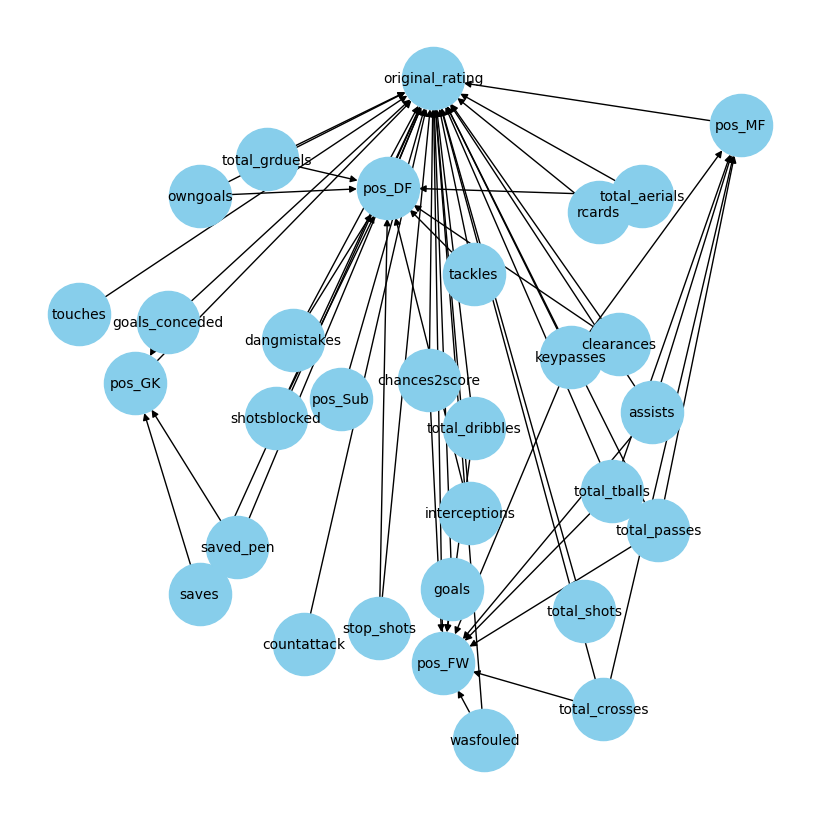

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty NetworkX graph
nx_graph = nx.DiGraph()

# Add edges from the Bayesian Network model to the NetworkX graph
nx_graph.add_edges_from(model.edges())

# Plot the graph using NetworkX
plt.figure(figsize=(8, 8))
nx.draw(nx_graph, with_labels=True, node_size=2000, node_color="skyblue", font_size=10)
plt.show()



C:\Users\prolo\AppData\Local\Temp\ipykernel_44056\1851329248.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


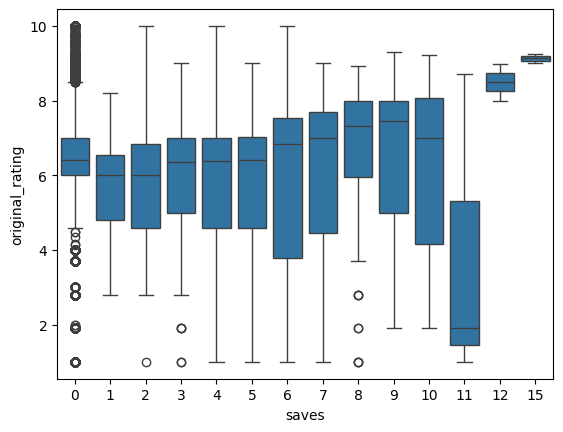

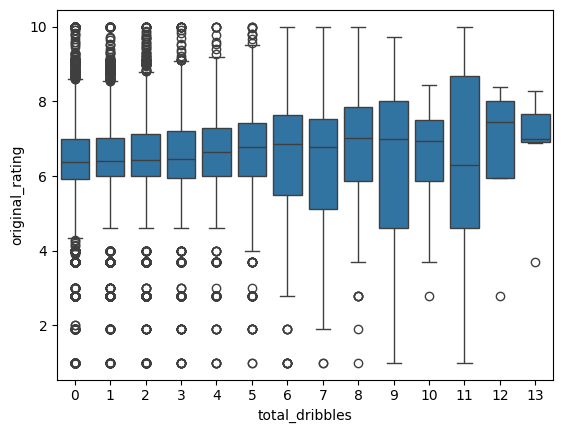

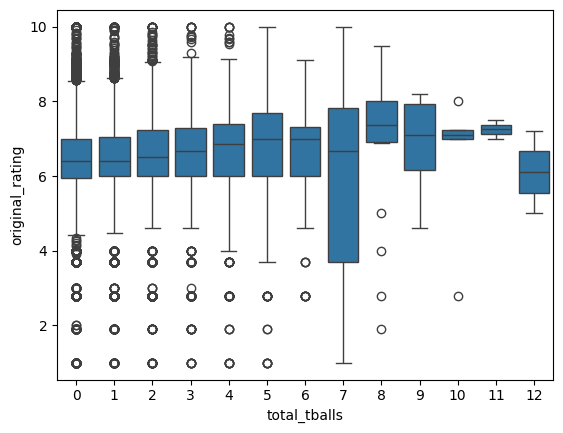

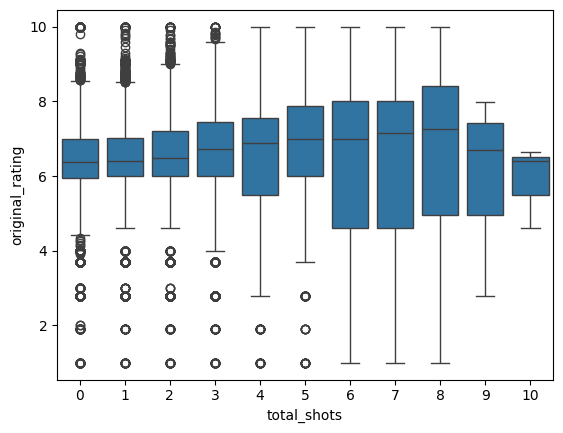

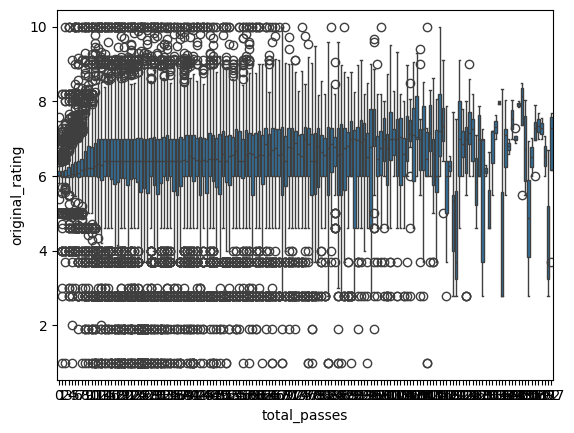

...

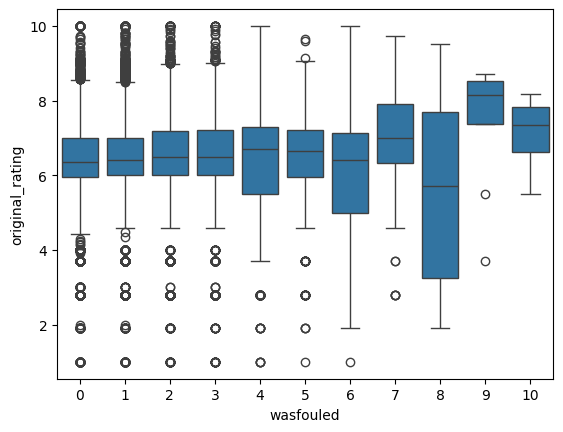

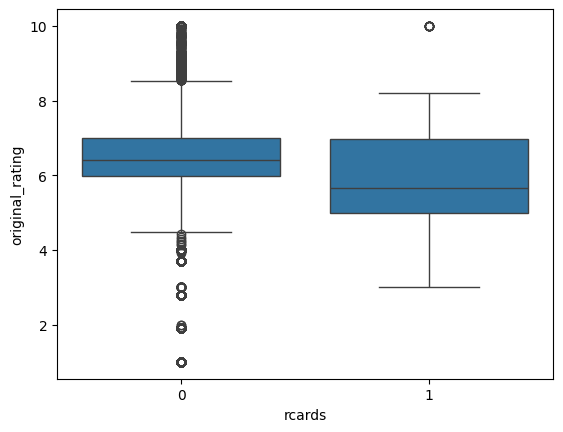

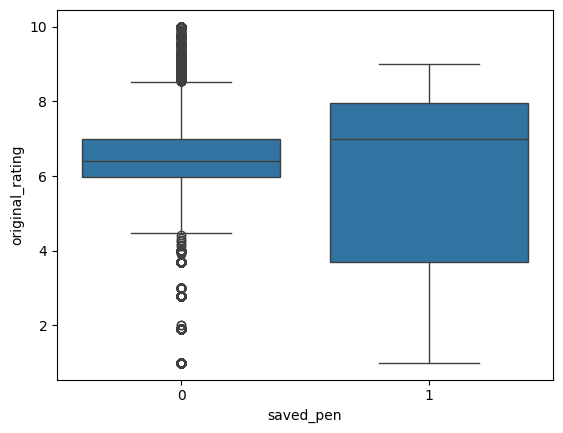

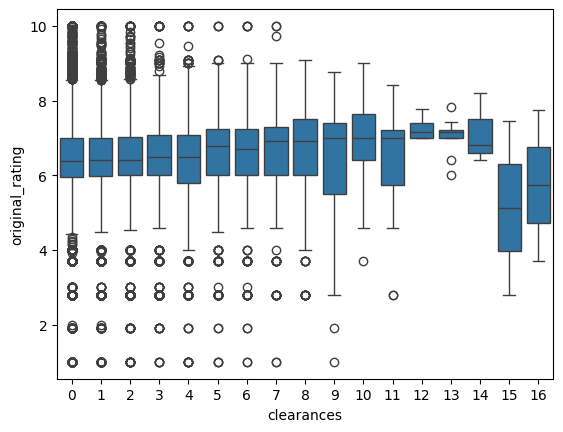

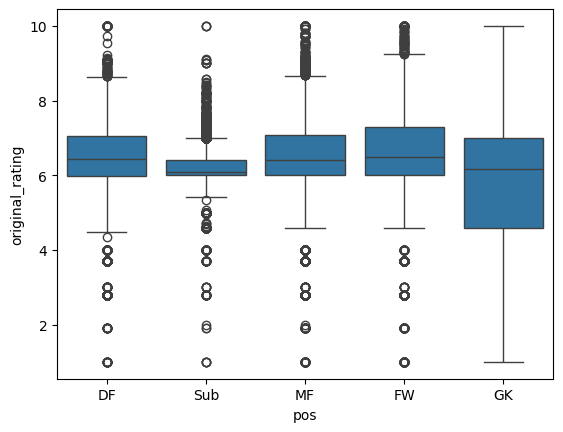

In [ ]:
for i,col in enumerate(cleaned_df.drop('original_rating',axis = 1)):
    plt.figure(i)
    sns.boxplot(x = col,y = cleaned_df['original_rating'], data = cleaned_df)

C:\Users\prolo\AppData\Local\Temp\ipykernel_21056\4199163190.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


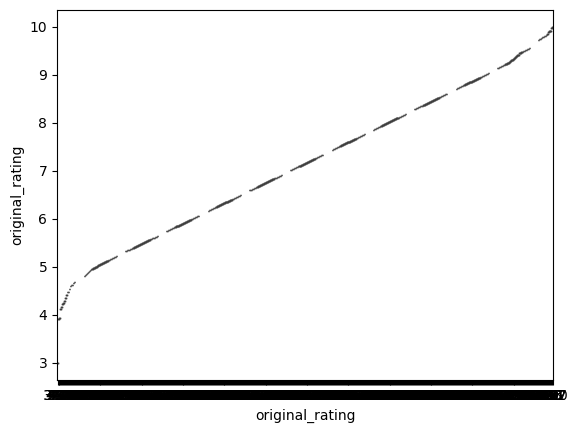

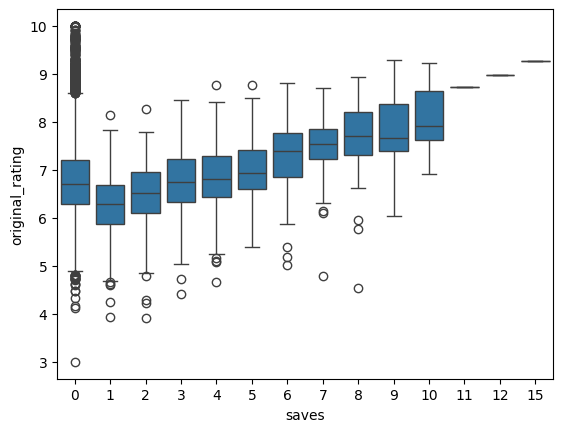

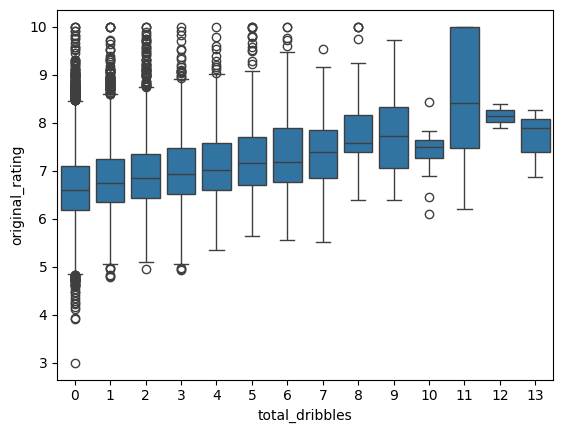

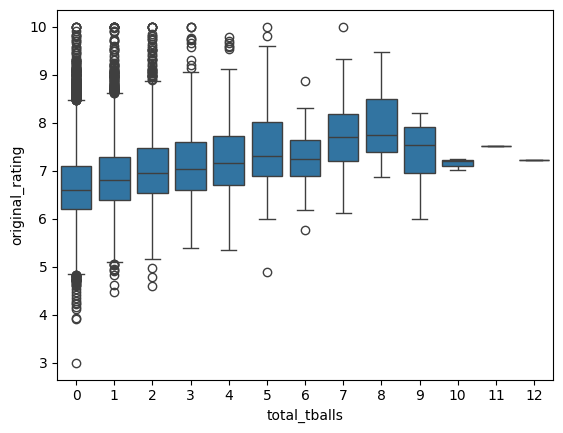

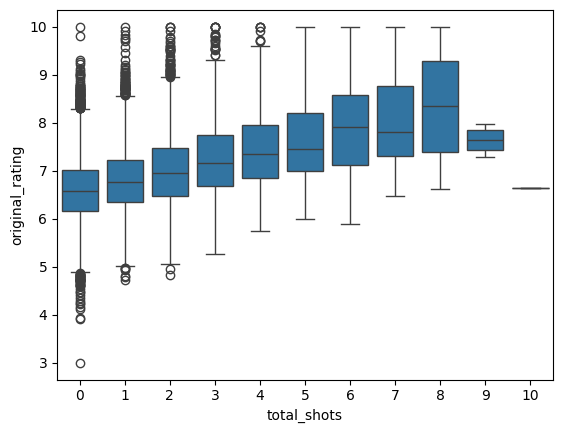

...

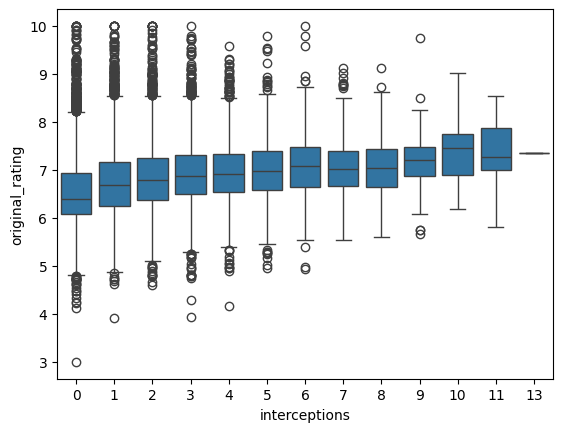

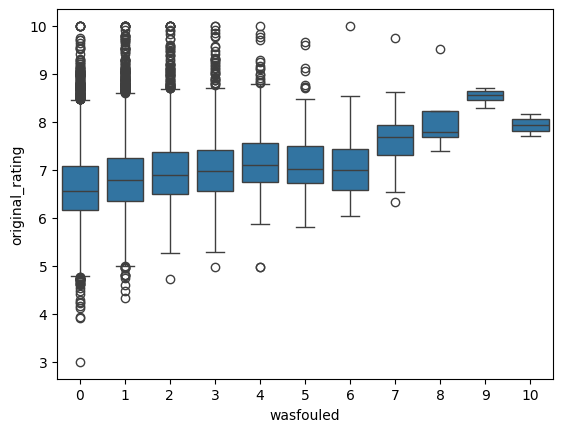

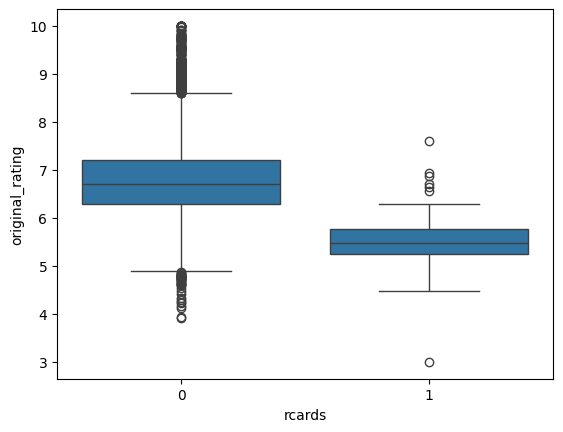

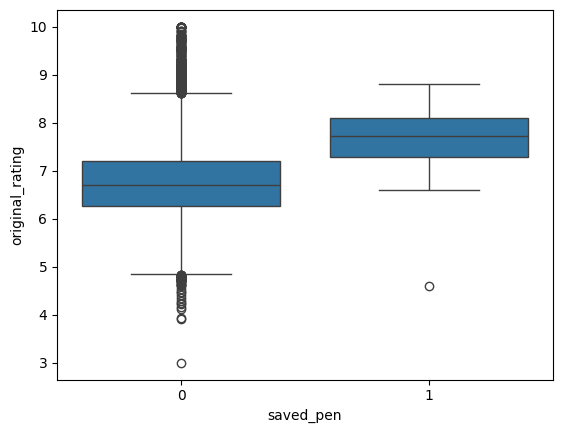

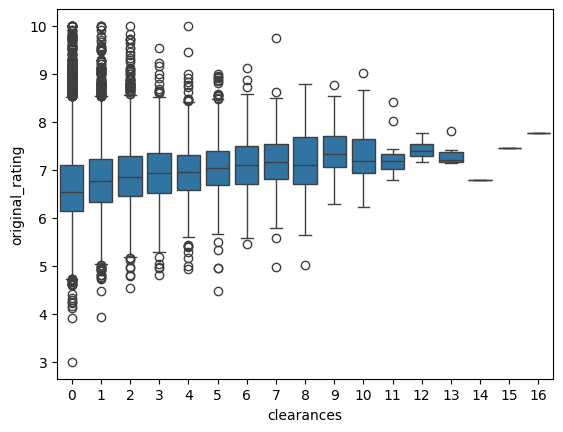

In [ ]:
for i,col in enumerate(cleaned_df.drop('pos',axis = 1)):
    plt.figure(i)
    sns.boxplot(x = col, y = cleaned_df.drop('pos',axis = 1)['original_rating'], data = cleaned_df.drop('pos',axis = 1))

In [ ]:
stat, p = stats.kstest(cleaned_df['original_rating'], "norm")
p

0.0

In [ ]:
stat, p_value = stats.kstest(cleaned_df['original_rating'], 'norm', args=(np.mean(cleaned_df['original_rating']), np.std(cleaned_df['original_rating'])))
p_value

3.69415247439648e-63

In [ ]:
df['original_rating'].value_counts()

original_rating
6.00    5280
6.40    4008
4.60    3734
7.00    3638
5.00    1916
        ... 
4.74       1
5.04       1
9.55       1
4.47       1
4.16       1
Name: count, Length: 515, dtype: int64

In [ ]:
# Split into features (X) and target (Y)
X = cleaned_df.drop(columns = ["original_rating",'pos'])  # Features
y = cleaned_df["original_rating"]  # Target

# Perform train-test split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Show the shape of the resulting datasets
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")


X_train shape: (40521, 20), X_test shape: (10131, 20)
y_train shape: (40521,), y_test shape: (10131,)


In [ ]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

# Fit GPR model
gpr = GaussianProcessRegressor(kernel=RBF(length_scale=1.0)).fit(X_train, y_train)

# Predict new Y value
y_pred, y_std = gpr.predict(X_test, return_std=True)
print(f"Predicted Y: {y_pred[0]:.2f} ± {y_std[0]:.2f}")


KeyboardInterrupt: 